<a href="https://colab.research.google.com/github/SauravMaheshkar/medical/blob/main/fMRI/CLIPvoxel_to_CLIPimage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook takes CLIP-voxels (brain voxels that have already been mapped to CLIP space via contrastive learning) and then uses a diffusion model to better align these CLIP-voxels to CLIP-image space (i.e., this is how DallE-2 uses a diffusion prior to go from CLIP-text space to CLIP-image space, as the spaces are still disjointed after contrastive learning).

# Import packages & functions

In [1]:
!pip install webdataset info-nce-pytorch clip-anytorch git+https://github.com/lucidrains/dalle2-pytorch diffusers git+https://github.com/isamu-isozaki/diffusers@rdm_retrieval 
!pip install -U transformers datasets
!pip install clip-retrieval  # !conda install -y --force-reinstall pyarrow
!pip install faiss-gpu pyarrow

  Cloning https://github.com/lucidrains/dalle2-pytorch to /tmp/pip-req-build-aauta53j
  Running command git clone --filter=blob:none --quiet https://github.com/lucidrains/dalle2-pytorch /tmp/pip-req-build-aauta53j
  Resolved https://github.com/lucidrains/dalle2-pytorch to commit 3b2cf7b0bc152d826f74a90f5f6b922a8b9f7b21
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/isamu-isozaki/diffusers (to revision rdm_retrieval) to /tmp/pip-req-build-tzs4_q0u
  Running command git clone --filter=blob:none --quiet https://github.com/isamu-isozaki/diffusers /tmp/pip-req-build-tzs4_q0u
  Running command git checkout -b rdm_retrieval --track origin/rdm_retrieval
  Switched to a new branch 'rdm_retrieval'
  Branch 'rdm_retrieval' set up to track remote branch 'rdm_retrieval' from 'origin'.
  Resolved https://github.com/isamu-isozaki/diffusers to commit f0e7bf52ffe951f2c9190c887dbba6a79ee210cb
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
 

In [2]:
%cd /kaggle/working/
!git clone https://github.com/laion-ai/medical
%cd medical/fMRI

/kaggle/working
fatal: destination path 'medical' already exists and is not an empty directory.
/kaggle/working/medical/fMRI


In [3]:
import os
import sys
import math
import random
import numpy as np
from matplotlib import pyplot as plt
import torch
from torch import nn
import torchvision
from torchvision import transforms
from tqdm import tqdm
import PIL
from datetime import datetime
import h5py
import webdataset as wds
from info_nce import InfoNCE
import clip
import pandas as pd
from collections import OrderedDict

from utils import * 
from models import * 

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device:",device)

seed_everything(seed=0)

device: cuda


In [4]:
# setup multi-gpu Data Distributed Processing (ddp) if available
# if not using ddp, using_ddp should be False and local_rank=0
import torch.distributed as dist
from torch.nn.parallel import DistributedDataParallel as DDP
import ddp_config
using_ddp,local_rank = ddp_config.ddp_test()
if device=='cuda':
    torch.cuda.set_device(local_rank)

NOT using distributed parallel processing!


In [5]:
# if full_training is True, use large batches and the entire training dataset 
full_training = True
print('full_training:',full_training)

full_training: True


## Which pretrained model are you using for voxel alignment to embedding space? 

In [6]:
img_augmentation = True # do image augmentation?
soft_clip = True # use loss_nce + loss_soft?

model_name = f'clip_image_vitL_aug{img_augmentation}_soft{soft_clip}' # CLIP ViT-L/14 image embeddings
# model_name = 'clip_text_vitL' # CLIP ViT-L/14 text embeddings
# model_name = 'clip_image_resnet' # CLIP basic ResNet image embeddings

print(f"Using model: {model_name}")
print(f"Image augmentation: {img_augmentation}")

Using model: clip_image_vitL_augTrue_softTrue
Image augmentation: True


In [7]:
!wget -c https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/COCO_73k_subj_indices.hdf5
!wget -c https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/COCO_73k_annots_curated.npy

--2023-02-17 21:05:29--  https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/COCO_73k_subj_indices.hdf5
Resolving huggingface.co (huggingface.co)... 54.235.118.239, 3.231.67.228, 2600:1f18:147f:e800:671:b733:ecf3:a585, ...
Connecting to huggingface.co (huggingface.co)|54.235.118.239|:443... connected.
HTTP request sent, awaiting response... 416 Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

--2023-02-17 21:05:31--  https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/COCO_73k_annots_curated.npy
Resolving huggingface.co (huggingface.co)... 3.231.67.228, 54.235.118.239, 2600:1f18:147f:e800:671:b733:ecf3:a585, ...
Connecting to huggingface.co (huggingface.co)|3.231.67.228|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.huggingface.co/repos/8c/38/8c3895ae23f30bf32bd3c1662586cccb3697fa048ac15f740da784bb29651ff0/da4f7b5730da9ea9d1ff9cf6fa7c4afe4c4d4bec8153819ba68be93b417

In [8]:
if "resnet" in model_name: 
    clip_extractor = Clipper("RN50")
else:
    clip_extractor = Clipper("ViT-L/14")
    
if "text" in model_name:     
    image_var = 'trial' 
else:
    image_var = 'images'
print("image_var =", image_var)

# load COCO annotations curated in the same way as the mind_reader (Lin Sprague Singh) preprint
f = h5py.File('COCO_73k_subj_indices.hdf5', 'r')
subj01_order = f['subj01'][:]
f.close()
annots = np.load('COCO_73k_annots_curated.npy',allow_pickle=True)
subj01_annots = annots[subj01_order]

ViT-L/14 cuda
image_var = images


# Prep dataloaders and brain_to_clip model

In [9]:
batch_size = 2  # 128
full_training = False
print("batch_size",batch_size)

if not full_training: 
    num_devices = 1
    num_workers = 1
    print("num_workers",num_workers)
    num_samples = 500 
    global_batch_size = batch_size * num_devices
    print("global_batch_size",global_batch_size)
    num_batches = math.floor(num_samples / global_batch_size)
    num_worker_batches = math.floor(num_batches / num_workers)
    print("num_worker_batches",num_worker_batches)
    train_url = "https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/webdataset/train/train_subj01_{0..1}.tar"
else:
    num_devices = torch.cuda.device_count() or 1
    print("num_devices",num_devices)
    num_workers = num_devices
    print("num_workers",num_workers)
    num_samples = 24983 # see metadata.json in webdataset_split folder
    global_batch_size = batch_size * num_devices
    print("global_batch_size",global_batch_size)
    num_batches = math.floor(num_samples / global_batch_size)
    num_worker_batches = math.floor(num_batches / num_workers)
    print("num_worker_batches",num_worker_batches)
    train_url = "https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/webdataset/train/train_subj01_{0..49}.tar"

train_data = wds.DataPipeline([wds.ResampledShards(train_url),
                    wds.tarfile_to_samples(),
                    wds.shuffle(500,initial=500),
                    wds.decode("torch"),
                    wds.rename(images="jpg;png", voxels="nsdgeneral.npy",
#                                embs="sgxl_emb.npy",
                               trial="trial.npy"),
                    wds.to_tuple("voxels", image_var),
                    wds.batched(batch_size, partial=True),
                ]).with_epoch(num_worker_batches)
train_dl = wds.WebLoader(train_data, num_workers=num_workers,
                         batch_size=None, shuffle=False, persistent_workers=True)

# Validation #
num_samples = 492
num_batches = math.ceil(num_samples / global_batch_size)
num_worker_batches = math.ceil(num_batches / num_workers)
print("validation: num_worker_batches",num_worker_batches)

url = "https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/webdataset/val/val_subj01_0.tar"
val_data = wds.DataPipeline([wds.SimpleShardList(url),
                    wds.tarfile_to_samples(),
                    wds.decode("torch"),
                    wds.rename(images="jpg;png", voxels="nsdgeneral.npy", 
#                                embs="sgxl_emb.npy",
                               trial="trial.npy"),
                    wds.to_tuple("voxels", image_var),
                    wds.batched(batch_size, partial=True),
                ]).with_epoch(num_worker_batches)
val_dl = wds.WebLoader(val_data, num_workers=num_workers,
                       batch_size=None, shuffle=False, persistent_workers=True)

batch_size 2
num_workers 1
global_batch_size 2
num_worker_batches 250
validation: num_worker_batches 246


In [10]:
# from models.py
brain_net = BrainNetwork(768) 
if using_ddp:
    brain_net0 = brain_net.to(local_rank)
    brain_net = DDP(brain_net0, device_ids=[local_rank])
else:
    brain_net = brain_net.to(device)

# Train Diffusion Prior

This will map the CLIP-voxel embeddings to the CLIP-image embeddings space. Right now they are disjointed embedding spaces despite being aligned to maximize same-pair cosine similarity.

In [11]:
!mkdir -p checkpoints
!wget -c https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/checkpoints/clip_image_vitL_augTrue_softTrue_subj01_epoch24_diffusionprior.pth -P checkpoints
!wget -c https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/checkpoints/clip_image_vit_subj01_epoch20.pth -P checkpoints
!wget -c https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/checkpoints/clip_image_vitL_augTrue_softTrue_subj01_epoch19.pth -P checkpoints
# %cd checkpoints
# !gdown 1FVgFBMB31a8ChJi2RysoJp7iUnq3aYlS
# !gdown 1FVAUZJoBMXHoCxJu7s0onizrqNyM81LG
# !gdown 1FV1Qfa5hON6JjBz0bE_u-73T6QLV1ize
# %cd ..

--2023-02-17 21:05:50--  https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/checkpoints/clip_image_vitL_augTrue_softTrue_subj01_epoch24_diffusionprior.pth
Resolving huggingface.co (huggingface.co)... 3.231.67.228, 54.235.118.239, 2600:1f18:147f:e850:e203:c458:10cd:fc3c, ...
Connecting to huggingface.co (huggingface.co)|3.231.67.228|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.huggingface.co/repos/8c/38/8c3895ae23f30bf32bd3c1662586cccb3697fa048ac15f740da784bb29651ff0/80a0633f3ea182b3b34e53abca55ca20f763bb3c789e3590fa88055cd99ced70?response-content-disposition=attachment%3B+filename*%3DUTF-8%27%27clip_image_vitL_augTrue_softTrue_subj01_epoch24_diffusionprior.pth%3B+filename%3D%22clip_image_vitL_augTrue_softTrue_subj01_epoch24_diffusionprior.pth%22%3B&Expires=1676927150&Policy=eyJTdGF0ZW1lbnQiOlt7IlJlc291cmNlIjoiaHR0cHM6Ly9jZG4tbGZzLmh1Z2dpbmdmYWNlLmNvL3JlcG9zLzhjLzM4LzhjMzg5NWFlMjNmMzBiZjMyYmQzYzE2NjI1ODZjY2NiMzY5N2

In [12]:
# Loading checkpoint
ckpt_path = f'checkpoints/{model_name}_subj01_epoch19.pth'  
# ckpt_path = f'checkpoints/{model_name}_subj01_epoch20.pth'.replace("L", ""
    # ).replace("_augTrue_softTrue", "")
print("ckpt_path",ckpt_path)
checkpoint = torch.load(ckpt_path, map_location=device)

print(f"Plotting results from {ckpt_path}")
train_losses=checkpoint['train_losses']
# train_fwd_topk=checkpoint['train_fwd_topk']
# train_bwd_topk=checkpoint['train_bwd_topk']
val_losses=checkpoint['val_losses']
# val_fwd_topk=checkpoint['val_fwd_topk']
# val_bwd_topk=checkpoint['val_bwd_topk']
lrs=checkpoint['lrs']

# fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(1, 7, figsize=(23,3))
# ax1.set_title(f"Training Loss\n(final={train_losses[-1]:.3f})")
# ax1.plot(train_losses)
# # ax2.set_title(f"Training Top-1 (fwd)\n(final={train_fwd_topk[-1]:.3f})")
# # ax2.plot(train_fwd_topk)
# # ax3.set_title(f"Training Top-1 (bwd)\n(final={train_bwd_topk[-1]:.3f})")
# # ax3.plot(train_bwd_topk)
# ax4.set_title(f"Val Loss\n(final={val_losses[-1]:.3f})")
# ax4.plot(val_losses)
# # ax5.set_title(f"Val Top-1 (fwd)\n(final={val_fwd_topk[-1]:.3f})")
# # ax5.plot(val_fwd_topk)
# # ax6.set_title(f"Val Top-1 (bwd)\n(final={val_bwd_topk[-1]:.3f})")
# # ax6.plot(val_bwd_topk)
# ax7.set_title(f"Learning Rate")
# ax7.plot(lrs)
# fig.tight_layout()
# plt.show()
    
brain_net.load_state_dict(checkpoint['model_state_dict'])
brain_net.eval()
brain_net.requires_grad_(False)

ckpt_path checkpoints/clip_image_vitL_augTrue_softTrue_subj01_epoch19.pth
Plotting results from checkpoints/clip_image_vitL_augTrue_softTrue_subj01_epoch19.pth


BrainNetwork(
  (lin0): Sequential(
    (0): Linear(in_features=15724, out_features=4096, bias=True)
    (1): ReLU(inplace=True)
    (2): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.5, inplace=False)
  )
  (mlp): ModuleList(
    (0): Sequential(
      (0): Linear(in_features=4096, out_features=4096, bias=True)
      (1): ReLU(inplace=True)
      (2): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.15, inplace=False)
    )
    (1): Sequential(
      (0): Linear(in_features=4096, out_features=4096, bias=True)
      (1): ReLU(inplace=True)
      (2): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Dropout(p=0.15, inplace=False)
    )
    (2): Sequential(
      (0): Linear(in_features=4096, out_features=4096, bias=True)
      (1): ReLU(inplace=True)
      (2): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_st

In [13]:
from dalle2_pytorch import DiffusionPriorNetwork, DiffusionPrior

prior_network = DiffusionPriorNetwork(
    dim = 768,
    depth = 6,
    dim_head = 64,
    heads = 8
).to(device)

diffusion_prior = DiffusionPrior(
    net = prior_network,
    #clip = clip_model,
    image_embed_dim = 768,
    condition_on_text_encodings = False,
    timesteps = 100,
    cond_drop_prob = 0.2
).to(device)

In [14]:
# epoch = 14
# num_epochs = 60
# lr = 3e-4
# losses = []
# optimizer = torch.optim.AdamW(diffusion_prior.parameters(), lr=lr)

# # resume from checkpoint:
# prior_checkpoint = torch.load(f'{ckpt_path[:-12]}_epoch{epoch}_diffusionprior.pth', 
#                               map_location=device)
# epoch = prior_checkpoint['epoch']+1
# diffusion_prior.load_state_dict(prior_checkpoint['model_state_dict'])
# losses = prior_checkpoint['train_losses']
# optimizer.load_state_dict(prior_checkpoint['optimizer_state_dict'])
# optimizer.param_groups[0]['lr'] = lr

In [15]:
# # feed text and images into diffusion prior network
# progress_bar = tqdm(range(epoch,num_epochs),ncols=250)
# for epoch in progress_bar:
#     diffusion_prior.train()
#     for train_i, (voxel, image) in enumerate(train_dl):
#         optimizer.zero_grad()
#         image = image.to(device)

#         clip_embed = brain_net(voxel.to(device).float())
#         #clip_embed = nn.functional.normalize(clip_embed,dim=-1)

#         # clip_embed = clip_extractor.embed_curated_annotations(subj01_annots[voxel])

#         image_clip = clip_extractor.embed_image(image).float()

#         loss = diffusion_prior(text_embed=clip_embed, image_embed=image_clip)
        
#         loss.backward()
#         optimizer.step()
        
#         losses.append(loss.item())
        
#     diffusion_prior.eval()
#     for val_i, (val_voxel, val_image) in enumerate(val_dl):
#         with torch.no_grad(): 
#             val_image = val_image.to(device)

#             clip_embed = brain_net(val_voxel.to(device).float())
#             #clip_embed = nn.functional.normalize(clip_embed,dim=-1)

#             # clip_embed = clip_extractor.embed_curated_annotations(subj01_annots[voxel])

#             image_clip = clip_extractor.embed_image(val_image).float()

#             val_loss = diffusion_prior(text_embed=clip_embed, image_embed=image_clip)

#             val_losses.append(val_loss.item())
    
#     # Save model checkpoint every 5 epochs if full_training==True
#     if (epoch+1)%5==0 and full_training:
#         print(f'saving {ckpt_path[:-12]}_epoch{epoch}_diffusionprior.pth')
#         if (using_ddp==False) or (using_ddp==True and local_rank==0):
#             state_dict = brain_net.state_dict()
#             if using_ddp: # if using DDP, convert DDP state_dict to non-DDP before saving
#                 for key in list(state_dict.keys()):
#                     if 'module.' in key:
#                         state_dict[key.replace('module.', '')] = state_dict[key]
#                         del state_dict[key]   
#             torch.save({
#                 'epoch': epoch,
#                 'model_state_dict': diffusion_prior.state_dict(),
#                 'optimizer_state_dict': optimizer.state_dict(),
#                 'train_losses': losses,
#                 'val_losses': val_losses,
#                 }, f'{ckpt_path[:-12]}_epoch{epoch}_diffusionprior.pth')
#         if using_ddp:
#             dist.barrier() # this tells the other gpus wait for the first gpu to finish saving the model
        
#     logs = OrderedDict(
#         loss=np.mean(losses[-(train_i+1):]),
#         val_loss=np.mean(val_losses[-(val_i+1):]),
#     )
#     progress_bar.set_postfix(**logs)
    
# plt.plot(losses)
# plt.show()
# plt.plot(val_losses)
# plt.show()

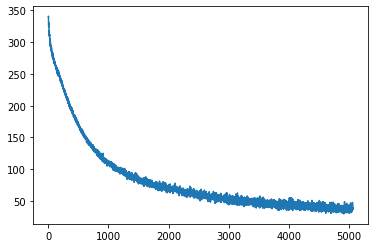

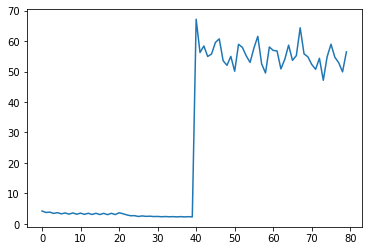

In [16]:
# load pretrained checkpoint
prior_ckpt_path = f'{ckpt_path[:-12]}_epoch24_diffusionprior.pth'
prior_checkpoint = torch.load(prior_ckpt_path, map_location=device)
losses = prior_checkpoint['train_losses']
val_losses = prior_checkpoint['val_losses']
diffusion_prior.load_state_dict(prior_checkpoint['model_state_dict'])
diffusion_prior=diffusion_prior.to(device)

diffusion_prior.eval()
diffusion_prior.requires_grad_(False)
prior_network.eval()
prior_network.requires_grad_(False)
brain_net.eval()
brain_net.requires_grad_(False)

plt.plot(losses)
plt.show()
plt.plot(val_losses)
plt.show()

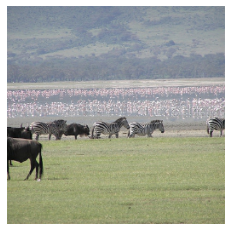

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

Cosine sim for CLIP-voxel x CLIP-image tensor([0.1434], device='cuda:0')
Cosine sim for CLIP-voxel-aligned x CLIP-image tensor([0.5848], device='cuda:0')


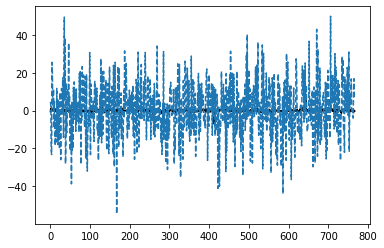

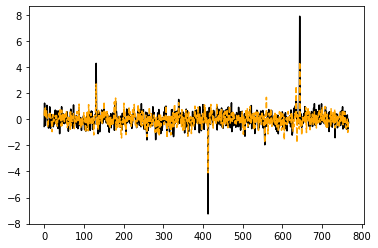

In [17]:
for i, (voxel, image) in enumerate(val_dl):
    image_test = image.to(device)
    clip_embed = brain_net(voxel.to(device).float())
    break

for idx in [0]:
    plt.imshow(torch_to_Image(image_test[idx]))
    plt.axis('off')
    plt.show()

    image_clip = clip_extractor.embed_image(image_test[idx][None])
    orig_vox_clip = clip_embed[idx][None]

    with torch.no_grad():
        align_vox_clip = diffusion_prior.p_sample_loop(clip_embed[idx][None].shape, 
                                                       text_cond = dict(text_embed = clip_embed[idx][None].long()), 
                                                       cond_scale = 1., timesteps = 100)
    
    print("Cosine sim for CLIP-voxel x CLIP-image", nn.functional.cosine_similarity(orig_vox_clip.float(),image_clip,dim=1))
    print("Cosine sim for CLIP-voxel-aligned x CLIP-image",nn.functional.cosine_similarity(align_vox_clip.float(),image_clip,dim=1))

    plt.plot(image_clip.detach().cpu().numpy().flatten(),c='k')
    plt.plot(orig_vox_clip.detach().cpu().numpy().flatten(),ls='--')
    plt.show()

    plt.plot(image_clip.detach().cpu().numpy().flatten(),c='k')
    plt.plot(align_vox_clip.detach().cpu().numpy().flatten(),c='orange',ls='--')
    plt.show()

# Test out feeding these aligned CLIP-voxel embeddings through Stable Diffusion (Image Variation) model

In [18]:
from IPython.display import display, clear_output
from tqdm.auto import tqdm, trange
from ipywidgets import Output


all_embeddings = []
val_dl = wds.WebLoader(val_data, num_workers=num_workers,
                       batch_size=None, shuffle=False, persistent_workers=True)

num_inference_steps = 20
clip_guidance_scale = 3 # guidance scale used in example: https://huggingface.co/lambdalabs/sd-image-variations-diffusers
vox_guidance_scale = 3
num_per_sample = 4

out = Output()
display(out)

for voxel, image in tqdm(val_dl):
    image = clip_extractor.resize_image(image)
    
    # Original clip embedding:
    clip_emb = clip_extractor.embed_image(image)
    clip_emb = torch.cat([torch.zeros_like(clip_emb), clip_emb]).unsqueeze(1).to(device).float()

    # Encode voxels to CLIP space
    image_embeddings = brain_net(voxel.to(device).float())
    # image_embeddings = nn.functional.normalize(image_embeddings,dim=-1) 
    # image_embeddings *= clip_emb[1].norm()/image_embeddings.norm() # note: this is cheating to equate norm scaling
    with out:
        clear_output(wait=True)
        image_embeddings = diffusion_prior.p_sample_loop(image_embeddings.shape, 
                                           text_cond = dict(text_embed = image_embeddings), 
                                           cond_scale = 1., timesteps = num_inference_steps)
        plt.plot(clip_emb[1].detach().cpu().numpy().flatten(),label='CLIP-image emb.')
        plt.plot(image_embeddings.detach().cpu().numpy().flatten(),label='CLIP-voxel emb.')
        plt.legend()
        plt.show()
        print("Cosine sim:", nn.functional.cosine_similarity(image_embeddings,clip_emb[2],dim=1))
    
    all_embeddings.append(([x.detach().cpu().numpy() for x in clip_emb], image_embeddings.detach().cpu().numpy()))

Output()

0it [00:00, ?it/s]

In [19]:
del diffusion_prior, brain_net, prior_network, checkpoint
import gc
gc.collect()
torch.cuda.empty_cache()

In [20]:
!nvidia-smi

Fri Feb 17 21:10:23 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   59C    P0    45W / 250W |   2909MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [21]:
import torch
import sys
import os


torch.set_grad_enabled(False)
sd_mode = False
if sd_mode:
    from diffusers import StableDiffusionImageVariationPipeline
    from diffusers import AutoencoderKL, PNDMScheduler, UNet2DConditionModel
    from transformers import CLIPVisionModelWithProjection, CLIPFeatureExtractor

    # cache_dir = '/scratch/gpfs/ps6938/nsd/stable_recons/models/sd-image-variations-diffusers/snapshots/fffa9500babf6ab7dfdde36a35ccef6d814ae432'
    cache_dir = "/abracadabra"
    if not os.path.isdir(cache_dir): # download from huggingface if not already downloaded / cached
        print("Downloading lambdalabs/sd-image-variations-diffusers from huggingface...")
        sd_pipe = StableDiffusionImageVariationPipeline.from_pretrained("lambdalabs/sd-image-variations-diffusers", revision="v2.0").to(device)
        cache_dir = "lambdalabs/sd-image-variations-diffusers"
        
    unet = UNet2DConditionModel.from_pretrained(cache_dir,subfolder="unet").to(device)
    vae = AutoencoderKL.from_pretrained(cache_dir,subfolder="vae").to(device)
    noise_scheduler = PNDMScheduler.from_pretrained(cache_dir, subfolder="scheduler")

    unet.eval() # dont want to train model
    unet.requires_grad_(False) # dont need to calculate gradients

    vae.eval() # dont want to train model
    vae.requires_grad_(False) # dont need to calculate gradients

    @torch.no_grad()
    def decode_latents(latents):
        latents = 1 / 0.18215 * latents
        image = vae.decode(latents).sample
        image = (image / 2 + 0.5).clamp(0, 1)
        return image[0]

    print("loaded pre-trained SD model!")
else:
    from diffusers import RDMPipeline
    rdm = RDMPipeline.from_pretrained("fusing/rdm", torch_dtype=torch.float16)
    from diffusers.models.retriever import Retriever, IndexConfig

/opt/conda/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:585: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.object,
/opt/conda/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:627: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.object,
/opt/conda/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:637: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by its

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [22]:
# if not sd_mode:
#     with torch.no_grad():  # , torch.autocast("cuda"):
#         r = Retriever(
#             IndexConfig(dataset_name="svnfs/depth-of-field",  # "mrm8488/ImageNet1K-val",  # "alexandrainst/da-wit",  # "maderix/flickr_bw_rgb",  # "BirdL/DallData",  # "dalle-mini/open-images", # "nlphuji/open_images_dataset_v7",
#                         dataset_set="train",  # "train",  # "train",  #"valid",  #"test"
#                         image_column="image",  # "Images",  # "image",
#                         ),
#                         clip_model=rdm.clip.cuda().float(),
#                         feature_extractor=rdm.feature_extractor
#                       )

In [23]:
!nvidia-smi

Fri Feb 17 21:16:57 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    35W / 250W |   2909MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [24]:
if sd_mode:
    @torch.no_grad()
    def sample_fn(image_embeddings, i=-1, bs=1, gs=clip_guidance_scale):
        # Prepare timesteps
        noise_scheduler.set_timesteps(num_inference_steps, device=device)
        timesteps = noise_scheduler.timesteps
        latents = torch.randn([bs, 4, 64, 64], device=device)
            # Denoising loop (brain recon)
        for i, t in enumerate(timesteps):
            # expand the latents if we are doing classifier free guidance
            latent_model_input = torch.cat([latents] * 2)
            latent_model_input = noise_scheduler.scale_model_input(latent_model_input, t)

            # predict the noise residual
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=image_embeddings).sample
            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + gs * (noise_pred_text - noise_pred_uncond)

            # compute the previous noisy sample x_t -> x_t-1
            latents = noise_scheduler.step(noise_pred, t, latents).prev_sample       
else:
    rdm = rdm.to(device)
    
    def decode_latents(x):
        return x

In [25]:
if not sd_mode:
    from clip_retrieval.clip_client import ClipClient, Modality
    from IPython.display import Image as IPyImage, display
    import numpy as np
    from PIL import Image, UnidentifiedImageError
    import traceback
    import requests
    import time
    import io


    size = (336, 336)  #  (1920//4, 1080//4)


    def pad_resize(im, size, fit=True):
        ratio = (max if fit else min)((w / s for s, w in zip(im.size, size)))
        im = im.resize([int(s * ratio) for s, w in zip(im.size, size)])
        canvas = Image.new("RGB", size, (0, 0, 0))
        canvas.paste(im, [w // 2 - s // 2 for s, w in zip(im.size, size)])
        return canvas

    def crop_resize(im, size):
        assert size[0] == size[1]  # unnecessary, bad design, why
        w = size[0]
        im = im.convert("RGB")
        a, b = im.size
        im = im.resize((w if a < b else int(a / b * w), w if b <= a else int(b / a * w)))
        a, b = im.size
        x, y = (a - w) // 2, (b - w) // 2
        im = im.crop((x, y, x + w, y + w))
        im = im.resize((w, w))
        return im


    def img_result(result, size=size):
        print(result)
        try:
            return crop_resize(  # pad_resize(
                Image.open(
                io.BytesIO(
                    requests.get(result["url"]).content  # , stream=True).raw
                )
            ).convert("RGB"), size)  # .resize(size).convert("RGB")
        except (TypeError, requests.ConnectionError, UnidentifiedImageError):
            traceback.print_exc()
            return None  # Image.new("RGB", size)


    def query_laion(text=None, emb=None, num=50):
        client = ClipClient(
            url="https://knn.laion.ai/knn-service",
#             url="https://knn5.laion.ai/knn-service",
            indice_name="laion5B-L-14",
#             indice_name="laion5B",
#             indice_name="laion_400m",
            aesthetic_score=9,
            aesthetic_weight=0.15,
            modality=Modality.IMAGE,
            num_images=max(4, num * 2),
            use_violence_detector=False,
            use_safety_model=False
        )

        while True:
            try:
                while len(emb.shape) > 1:
                    emb = emb[0]
                results = client.query(text=text, embedding_input=(emb / np.linalg.norm(emb)).tolist() if emb is not None else None)
            except Exception:
                traceback.print_exc()
                time.sleep(1)
                continue
            break
#         return results
        if not results:
            return Image.new("RGB", size)
#         print(results)
        imgs = [img_result(result) for result in results]
#         print(imgs)
        imgs = [im for im in imgs if im is not None][:num]
        return imgs
        # img = np.concatenate([np.asarray(img) for img in imgs], axis=1)
        # return Image.fromarray(img)


#     i = random.choice(list(range(len(feats))))
#     from IPython.display import display, Image as IImage
#     display(IImage(glob.glob(f"image-{i+1:03d}.*")[0]))
#     f = feats[i]
#     sample = pca.inverse_transform(np.random.normal(f, f * 0 + bandwidth ** -2))
#     query_laion(
#         # "A green apple",
#         # emb=np.ones(768),
#         emb=sample / np.linalg.norm(sample),
#         num=1)[0]

    @torch.no_grad()
    def sample_fn(ie, i=-1, bs=1, retrieve=1, gs=clip_guidance_scale):
        ie = np.asarray(ie)
        embs = ie / np.linalg.norm(ie, axis=-1, keepdims=True)
        all_imgs = []
        for emb in tqdm(embs):
#             _, retrieved, *_ = r.retrieve_imgs(emb, retrieve)
#             retrieved = np.asarray(retrieved["embeddings"])[:, None, :][0]  # this is pointless
#             retrieved = retrieved / np.linalg.norm(retrieved, -1, keepdims=True) # * 18
#             print((retrieved * emb).sum(-1))
            retrieved = query_laion(
#                 "A green apple",
#                 emb=np.ones(768),
                emb=emb / np.linalg.norm(emb),
                num=retrieve)
#             print(retrieved)
            with torch.autocast("cuda"):
                all_imgs.append(rdm("", retrieved_images=retrieved,  # torch.from_numpy(emb).squeeze()[None, ...]
                                   ).images[0])  #"", retrieved_images=images).images[0])
        return all_imgs


In [26]:
!nvidia-smi

Fri Feb 17 21:17:03 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    35W / 250W |   6547MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [27]:
# from diffusers.pipelines.rdm import pipeline_rdm
# pipeline_rdm.preprocess_images = lambda x, y: torch.from_numpy(x).half()
# pipeline_rdm.normalize_images = lambda x: x
# rdm.clip.get_image_features = lambda x: x

  0%|          | 0/246 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Pilanesberg National Park', 'url': 'https://www.sdamy.com/images/Rustenburg4.jpg', 'id': 510370267, 'similarity': 0.844582200050354}, {'caption': '4 Days Masai Mara Wildlife & Lake Naivasha Tour', 'url': 'https://africajoytours.com/wp-content/uploads/2019/06/cccc-101-scaled.jpg', 'id': 4756963673, 'similarity': 0.8438379168510437}, {'caption': 'herd of zebra on savanna. available in hd. - steppenzebra stock-videos und b-roll-filmmaterial', 'url': 'https://media.gettyimages.com/videos/herd-of-zebra-on-savanna-available-in-hd-video-id3B2FBBC8_0248?s=640x640', 'id': 72312062, 'similarity': 0.8409318327903748}, {'caption': 'Plain zebra Stock Footage', 'url': 'https://images.pond5.com/plain-zebra-footage-010596701_iconm.jpeg', 'id': 2254053041, 'similarity': 0.8405797481536865}]
{'caption': 'Pilanesberg National Park', 'url': 'https://www.sdamy.com/images/Rustenburg4.jpg', 'id': 510370267, 'similarity': 0.844582200050354}
{'caption': '4 Days Masai Mara Wildlife & Lake Naivasha

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be806e30>


{'caption': 'herd of zebra on savanna. available in hd. - steppenzebra stock-videos und b-roll-filmmaterial', 'url': 'https://media.gettyimages.com/videos/herd-of-zebra-on-savanna-available-in-hd-video-id3B2FBBC8_0248?s=640x640', 'id': 72312062, 'similarity': 0.8409318327903748}
{'caption': 'Plain zebra Stock Footage', 'url': 'https://images.pond5.com/plain-zebra-footage-010596701_iconm.jpeg', 'id': 2254053041, 'similarity': 0.8405797481536865}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE800F10>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB7012528D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE7F6090>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Video: Báo hoa mai ẩn nấp trên cây, bất ngờ sà xuống đoạt mạng linh dương trong tích tắc', 'url': 'https://mcnewsmd1.keeng.net/netnews/archive/imageslead/2021/10/26/tinngan015009_987550347_00wap_240.jpg', 'id': 5104938736, 'similarity': 0.8727788925170898}, {'caption': "'Đơn thương độc mã' săn trâu rừng, sư tử đực bị con mồi húc tả tơi", 'url': 'https://sohanews.sohacdn.com/thumb_w/1000/160588918557773824/2021/7/26/photo1627290111637-16272901119011680288881.jpg', 'id': 4590836863, 'similarity': 0.8561294674873352}, {'caption': 'Casela Nature Parks: Lion Safari', 'url': 'https://media-cdn.tripadvisor.com/media/photo-s/13/2b/46/01/lion-safari.jpg', 'id': 4281127799, 'similarity': 0.8553639054298401}, {'caption': 'African buffalo', 'url': 'https://media.gettyimages.com/videos/african-buffalo-video-id815616434?s=640x640', 'id': 552800535, 'similarity': 0.8552069664001465}]
{'caption': 'Video: Báo hoa mai ẩn nấp trên cây, bất ngờ sà xuống đoạt mạng linh dương trong tích tắc', 

  0%|          | 0/50 [00:00<?, ?it/s]

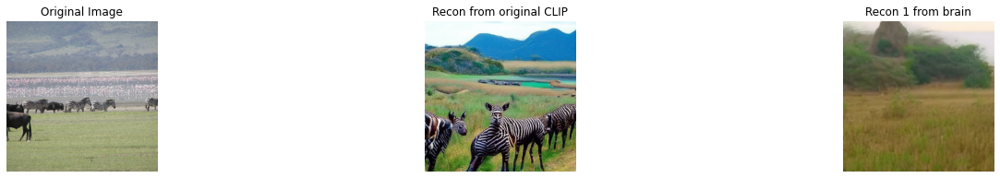

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Hotel Scofield', 'url': 'https://i2.wp.com/themoonlitroad.com/wp-content/uploads/2009/04/onemorehotel1.jpg?resize=174%2C253', 'id': 1023993964, 'similarity': 0.9027436971664429}, {'caption': 'Chicago IL ~ Rookery Building  ~ Facade', 'url': 'https://live.staticflickr.com/6071/6154434550_563cf0aa54_z.jpg', 'id': 2248267772, 'similarity': 0.887229323387146}]
{'caption': 'Hotel Scofield', 'url': 'https://i2.wp.com/themoonlitroad.com/wp-content/uploads/2009/04/onemorehotel1.jpg?resize=174%2C253', 'id': 1023993964, 'similarity': 0.9027436971664429}
{'caption': 'Chicago IL ~ Rookery Building  ~ Facade', 'url': 'https://live.staticflickr.com/6071/6154434550_563cf0aa54_z.jpg', 'id': 2248267772, 'similarity': 0.887229323387146}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB701199810>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB70103EC10>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Columnas', 'url': 'https://cdn.artphotolimited.com/images/59b65ee9faa2f46b71080369/1x1/colonnes.jpg', 'id': 4760328239, 'similarity': 0.836316704750061}, {'caption': 'Photo1828 blue', 'url': 'https://i2.wp.com/natashashilbhadra.files.wordpress.com/2015/06/photo1828-blue.jpg?w=406&', 'id': 3589503492, 'similarity': 0.8287960886955261}, {'caption': 'Times Square Postcard Blueprint Panel', 'url': 'http://images.photowall.com/products/48069/times-square-postcard-blueprint-panel.jpg?h=650&amp;q=90', 'id': 2143529739, 'similarity': 0.8280819654464722}]
{'caption': 'Columnas', 'url': 'https://cdn.artphotolimited.com/images/59b65ee9faa2f46b71080369/1x1/colonnes.jpg', 'id': 4760328239, 'similarity': 0.836316704750061}
{'caption': 'Photo1828 blue', 'url': 'https://i2.wp.com/natashashilbhadra.files.wordpress.com/2015/06/photo1828-blue.jpg?w=406&', 'id': 3589503492, 'similarity': 0.8287960886955261}
{'caption': 'Times Square Postcard Blueprint Panel', 'url': 'http://images.photowall.

  0%|          | 0/50 [00:00<?, ?it/s]

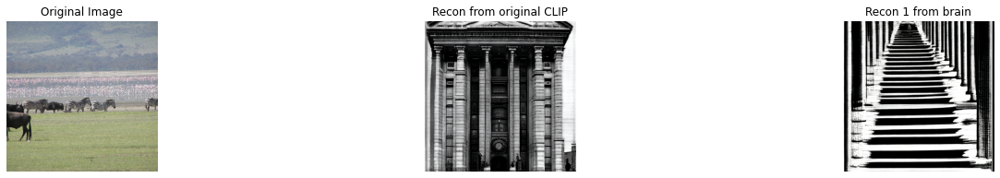

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Hotel Scofield', 'url': 'https://i2.wp.com/themoonlitroad.com/wp-content/uploads/2009/04/onemorehotel1.jpg?resize=174%2C253', 'id': 1023993964, 'similarity': 0.9027436971664429}, {'caption': 'Chicago IL ~ Rookery Building  ~ Facade', 'url': 'https://live.staticflickr.com/6071/6154434550_563cf0aa54_z.jpg', 'id': 2248267772, 'similarity': 0.887229323387146}]
{'caption': 'Hotel Scofield', 'url': 'https://i2.wp.com/themoonlitroad.com/wp-content/uploads/2009/04/onemorehotel1.jpg?resize=174%2C253', 'id': 1023993964, 'similarity': 0.9027436971664429}
{'caption': 'Chicago IL ~ Rookery Building  ~ Facade', 'url': 'https://live.staticflickr.com/6071/6154434550_563cf0aa54_z.jpg', 'id': 2248267772, 'similarity': 0.887229323387146}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB701002BD0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB70114F990>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'zegar antyk zdjęcia stock', 'url': 'https://thumbs.dreamstime.com/t/zegar-antyk-52841943.jpg', 'id': 4334249098, 'similarity': 0.882891833782196}]
{'caption': 'zegar antyk zdjęcia stock', 'url': 'https://thumbs.dreamstime.com/t/zegar-antyk-52841943.jpg', 'id': 4334249098, 'similarity': 0.882891833782196}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB7011C13D0>]


  0%|          | 0/50 [00:00<?, ?it/s]

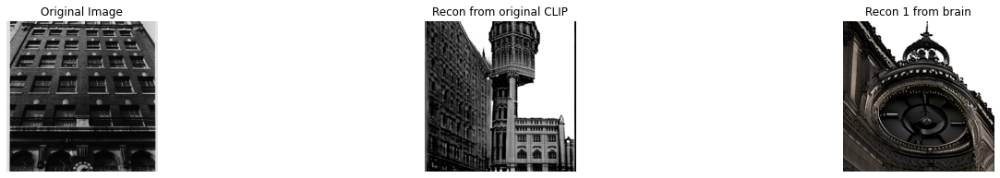

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Lorraine Young, Edmonton pastel artist', 'url': 'https://lorraineyoung.files.wordpress.com/2009/01/photo-on-03-31-13-at-9-16-pm.jpg?w=300&', 'id': 944061662, 'similarity': 0.84444260597229}, {'caption': 'Shirley Turner', 'url': 'https://lh5.googleusercontent.com/-YeLnEb0JSL0/AAAAAAAAAAI/AAAAAAAAABs/vo5w76MnR6c/photo.jpg', 'id': 14310677, 'similarity': 0.8386399745941162}, {'caption': 'Meredith Smith, Senior Account Executive', 'url': 'https://cdn.firespring.com/images/30596360-30d9-4c0a-8d43-ab87744dc12c.jpg', 'id': 522946010, 'similarity': 0.8384398818016052}, {'caption': 'Michelle Safirstein', 'url': 'https://farm2.static.flickr.com/1108/1433134110_be8fa8440a_m.jpg', 'id': 5169618808, 'similarity': 0.8368545770645142}]
{'caption': 'Lorraine Young, Edmonton pastel artist', 'url': 'https://lorraineyoung.files.wordpress.com/2009/01/photo-on-03-31-13-at-9-16-pm.jpg?w=300&', 'id': 944061662, 'similarity': 0.84444260597229}
{'caption': 'Shirley Turner', 'url': 'https://lh5.go

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Kimberly Anderson Photo 36', 'url': 'https://lh4.googleusercontent.com/-c4dnykyXR1U/AAAAAAAAAAI/AAAAAAAAAFs/bzIElJ56UNw/photo.jpg', 'id': 4183087208, 'similarity': 0.8425366878509521}, {'caption': 'Sheila Arrand (Ferguson)', 'url': 'https://k.7w7.us/cm/imgsvc/d?p=122510587', 'id': 3609554711, 'similarity': 0.8399296402931213}, {'caption': 'Paula Landua (Adams)', 'url': 'https://k.7w7.us/cm/imgsvc/d?p=15112704', 'id': 3438097876, 'similarity': 0.8383011221885681}, {'caption': 'PROFESSORA DELMIRA', 'url': 'http://1.bp.blogspot.com/-mwrFk9BMTng/TqmEgvZ3NNI/AAAAAAAABFQ/LQ1iGdvC-z0/s220/Professora%2BDelmira.jpg', 'id': 237558298, 'similarity': 0.8376680016517639}]
{'caption': 'Kimberly Anderson Photo 36', 'url': 'https://lh4.googleusercontent.com/-c4dnykyXR1U/AAAAAAAAAAI/AAAAAAAAAFs/bzIElJ56UNw/photo.jpg', 'id': 4183087208, 'similarity': 0.8425366878509521}
{'caption': 'Sheila Arrand (Ferguson)', 'url': 'https://k.7w7.us/cm/imgsvc/d?p=122510587', 'id': 3609554711, 'similarity'

  0%|          | 0/50 [00:00<?, ?it/s]

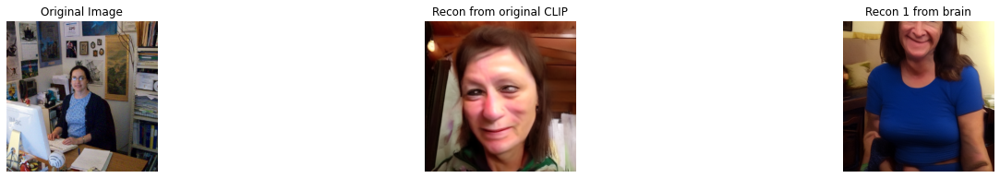

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'brushing teeth', 'url': 'https://i1.wp.com/thekidsdidit.com/wp-content/uploads/2014/02/brushing-teeth.jpg?resize=400%2C600', 'id': 4050833509, 'similarity': 0.8435518145561218}, {'caption': "The 4 B's at night. Bath, brush, book and bed! #babyteeth", 'url': 'https://i.pinimg.com/736x/7a/50/fe/7a50feff3c960cd2edfcbe1ddfdf2e5c.jpg', 'id': 174238946, 'similarity': 0.8409444093704224}, {'caption': 'bath time', 'url': 'https://youngclergywomen.myworshiptimes31.com/wp-content/uploads/sites/3/2013/01/bath-time-e1358351546924-300x271.jpg', 'id': 1223286600, 'similarity': 0.8374179005622864}]
{'caption': 'brushing teeth', 'url': 'https://i1.wp.com/thekidsdidit.com/wp-content/uploads/2014/02/brushing-teeth.jpg?resize=400%2C600', 'id': 4050833509, 'similarity': 0.8435518145561218}
{'caption': "The 4 B's at night. Bath, brush, book and bed! #babyteeth", 'url': 'https://i.pinimg.com/736x/7a/50/fe/7a50feff3c960cd2edfcbe1ddfdf2e5c.jpg', 'id': 174238946, 'similarity': 0.8409444093704224}

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700efcfb0>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'A Noah selfie.', 'url': 'https://images.squarespace-cdn.com/content/52e16dc8e4b0d2e910d9b8de/1451429125298-3IRCXOCGU2RWOFESYUR1/11146346_10155438896835459_5421377281584616699_o.jpg?content-type=image%2Fjpeg', 'id': 1062127148, 'similarity': 0.8585819005966187}, {'caption': 'Thinks the sweet potato casserole is Pie. #toddler #parentwinning', 'url': 'http://rreynoso.com/reysapoint/wp-content/uploads/2014/11/10802540_311621172373423_1130702126_n.jpg', 'id': 2773435910, 'similarity': 0.8563388586044312}, {'caption': 'Joshua smiles', 'url': 'http://www.davidbydavid.com/images/josh_smile.jpg', 'id': 4543751406, 'similarity': 0.8558712005615234}]
{'caption': 'A Noah selfie.', 'url': 'https://images.squarespace-cdn.com/content/52e16dc8e4b0d2e910d9b8de/1451429125298-3IRCXOCGU2RWOFESYUR1/11146346_10155438896835459_5421377281584616699_o.jpg?content-type=image%2Fjpeg', 'id': 1062127148, 'similarity': 0.8585819005966187}
{'caption': 'Thinks the sweet potato casserole is Pie. #toddler 

  0%|          | 0/50 [00:00<?, ?it/s]

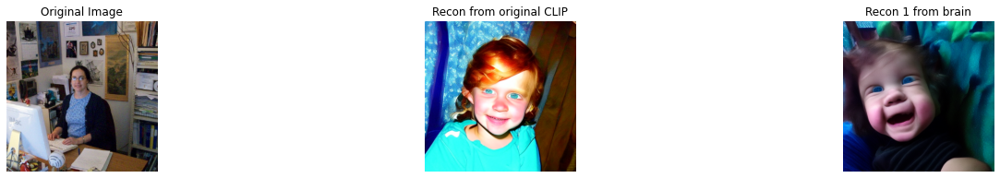

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'brushing teeth', 'url': 'https://i1.wp.com/thekidsdidit.com/wp-content/uploads/2014/02/brushing-teeth.jpg?resize=400%2C600', 'id': 4050833509, 'similarity': 0.8435518145561218}, {'caption': "The 4 B's at night. Bath, brush, book and bed! #babyteeth", 'url': 'https://i.pinimg.com/736x/7a/50/fe/7a50feff3c960cd2edfcbe1ddfdf2e5c.jpg', 'id': 174238946, 'similarity': 0.8409444093704224}, {'caption': 'bath time', 'url': 'https://youngclergywomen.myworshiptimes31.com/wp-content/uploads/sites/3/2013/01/bath-time-e1358351546924-300x271.jpg', 'id': 1223286600, 'similarity': 0.8374179005622864}]
{'caption': 'brushing teeth', 'url': 'https://i1.wp.com/thekidsdidit.com/wp-content/uploads/2014/02/brushing-teeth.jpg?resize=400%2C600', 'id': 4050833509, 'similarity': 0.8435518145561218}
{'caption': "The 4 B's at night. Bath, brush, book and bed! #babyteeth", 'url': 'https://i.pinimg.com/736x/7a/50/fe/7a50feff3c960cd2edfcbe1ddfdf2e5c.jpg', 'id': 174238946, 'similarity': 0.8409444093704224}

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb6c842a530>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Thinks the sweet potato casserole is Pie. #toddler #parentwinning', 'url': 'http://rreynoso.com/reysapoint/wp-content/uploads/2014/11/10802540_311621172373423_1130702126_n.jpg', 'id': 2773435910, 'similarity': 0.8485886454582214}, {'caption': "Playing with play doh at Grandma's!", 'url': 'https://i.pinimg.com/236x/40/97/3f/40973f16039cd48debb0407aaa50b424.jpg', 'id': 2611016654, 'similarity': 0.8409347534179688}, {'caption': "The 4 B's at night. Bath, brush, book and bed! #babyteeth", 'url': 'https://i.pinimg.com/736x/7a/50/fe/7a50feff3c960cd2edfcbe1ddfdf2e5c--bath-brushes-the-.jpg', 'id': 38104291, 'similarity': 0.8371068835258484}]
{'caption': 'Thinks the sweet potato casserole is Pie. #toddler #parentwinning', 'url': 'http://rreynoso.com/reysapoint/wp-content/uploads/2014/11/10802540_311621172373423_1130702126_n.jpg', 'id': 2773435910, 'similarity': 0.8485886454582214}
{'caption': "Playing with play doh at Grandma's!", 'url': 'https://i.pinimg.com/236x/40/97/3f/40973f1

  0%|          | 0/50 [00:00<?, ?it/s]

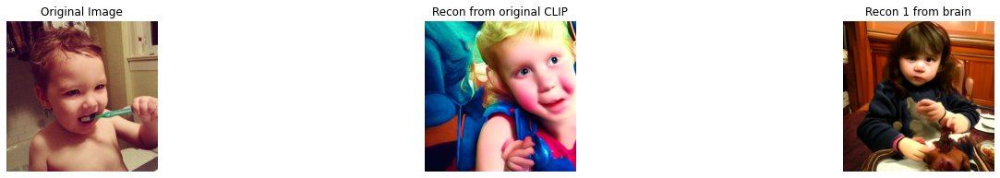

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'stir-fried broccoli', 'url': 'https://i2.wp.com/www.lesauce.com/wp-content/uploads/2011/02/6a00e5506b058d88340133eede3caf970b-600wi.jpg?w=1200', 'id': 1603923500, 'similarity': 0.8909375667572021}, {'caption': 'как вкусно и полезно приготовить капусту брокколи', 'url': 'https://avatars.mds.yandex.net/get-pdb/69339/24a27251-162f-4a88-a0a9-551c4387250c/s1200?webp=false', 'id': 3482460683, 'similarity': 0.8904622793197632}, {'caption': 'recetas con brócoli', 'url': 'https://www.mamirecetas.com/wp-content/uploads/2013/10/recetas-con-br%C3%B3coli-330x220.jpg', 'id': 63587046, 'similarity': 0.890455424785614}, {'caption': 'Makanan Yang Mengandung Vitamin B Kompleks', 'url': 'https://4.bp.blogspot.com/-1nrOXDKjL9c/VcmV9voiCbI/AAAAAAAACHU/bZzvLBjrovU/s640/Makanan%2BYang%2BMengandung%2BVitamin%2BB%2BKompleks.jpg', 'id': 947257674, 'similarity': 0.8904229998588562}]
{'caption': 'stir-fried broccoli', 'url': 'https://i2.wp.com/www.lesauce.com/wp-content/uploads/2011/02/6a00e5506b058

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Zapiekanka makaronowa z kurczakiem i brokułem', 'url': 'https://static.gotujmy.pl/ZDJECIE_PRZEPISU_ETAP/zapiekanka-makaronowa-z-kurczakiem-i-brokulem-384243.jpg', 'id': 3406970980, 'similarity': 0.897097647190094}, {'caption': 'как вкусно и полезно приготовить капусту брокколи', 'url': 'https://avatars.mds.yandex.net/get-pdb/69339/24a27251-162f-4a88-a0a9-551c4387250c/s1200?webp=false', 'id': 3482460683, 'similarity': 0.8962956666946411}, {'caption': 'Кои са полезните храни за вечеря и как да си ги приготвим?', 'url': 'https://p.bnt.bg/v/l/vlcsnap-2019-02-21-09h50m38s026-352684-810x0.png', 'id': 4609529378, 'similarity': 0.8959755897521973}, {'caption': 'Broccoli With Lemon Garlic Almond Butter picture', 'url': 'http://familyoven-recipe-images.s3.amazonaws.com/173710.jpg', 'id': 1452917390, 'similarity': 0.8945873975753784}]
{'caption': 'Zapiekanka makaronowa z kurczakiem i brokułem', 'url': 'https://static.gotujmy.pl/ZDJECIE_PRZEPISU_ETAP/zapiekanka-makaronowa-z-kurczakie

  0%|          | 0/50 [00:00<?, ?it/s]

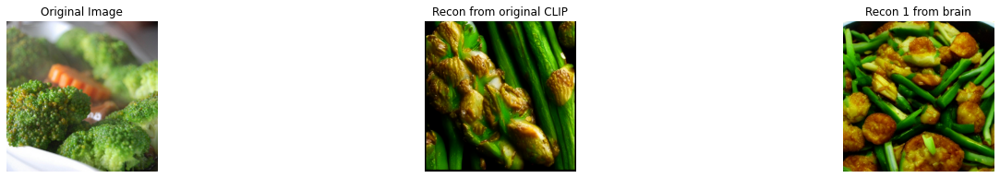

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'The aircraft was last seen slowly climbing into the overcast, but shortly after emerged from the clouds descending before impacting an embankment near Interstate 17.<br /> <br /> The pilot, the sole occupant on the flight was killed in the accident.', 'url': 'https://photos.smugmug.com/Commercial-Aviation/December-23-2004/i-2q6CCCG/0/f92b0016/O/310c.jpg', 'id': 2680096010, 'similarity': 0.8484441041946411}, {'caption': 'Single engine airplane landing at a high altitude mountain airport in the Alps in front of snow covered peaks', 'url': 'https://us.123rf.com/450wm/miq1969/miq19691803/miq1969180300017/98550984-single-engine-airplane-landing-at-a-high-altitude-mountain-airport-in-the-alps-in-front-of-snow-cove.jpg?ver=6', 'id': 2866574694, 'similarity': 0.8357537388801575}, {'caption': 'Over-Wings-Safari', 'url': 'http://surewaytours.net/wp-content/uploads/2015/11/Over-Wings-Safari1.jpg', 'id': 4511133881, 'similarity': 0.8350372314453125}, {'caption': 'Historický vývoj let

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb70111a350>


{'caption': 'Historický vývoj letounů ZLIN', 'url': 'https://zlinaircraft.eu/galerie/16_min_1583931242.jpg', 'id': 5249391425, 'similarity': 0.8316774964332581}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5C47A0350>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB70221D610>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB70221D510>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': '多摩湖堤防の上の飛行機', 'url': 'https://i2.wp.com/kura1.photozou.jp/pub/53/2955053/photo/167548030.jpg?resize=450%2C338', 'id': 4513941951, 'similarity': 0.8455520272254944}, {'caption': 'Tuzla Fly-In / 23-24 Aug 2008 Dscf8811', 'url': 'https://i.servimg.com/u/f59/12/29/26/37/dscf8811.jpg', 'id': 3904600300, 'similarity': 0.8445020318031311}, {'caption': 'Avião Piper PA-31 Navajo', 'url': 'https://cdnbr1.img.sputniknews.com/img/1276/64/12766405_0:58:2560:1862_638x450_80_0_0_807fcc602088a863a0295d1261f11f43.jpg', 'id': 3435192290, 'similarity': 0.8424012064933777}]
{'caption': '多摩湖堤防の上の飛行機', 'url': 'https://i2.wp.com/kura1.photozou.jp/pub/53/2955053/photo/167548030.jpg?resize=450%2C338', 'id': 4513941951, 'similarity': 0.8455520272254944}
{'caption': 'Tuzla Fly-In / 23-24 Aug 2008 Dscf8811', 'url': 'https://i.servimg.com/u/f59/12/29/26/37/dscf8811.jpg', 'id': 3904600300, 'similarity': 0.8445020318031311}
{'caption': 'Avião Piper PA-31 Navajo', 'url': 'https://cdnbr1.img.sputniknews.

  0%|          | 0/50 [00:00<?, ?it/s]

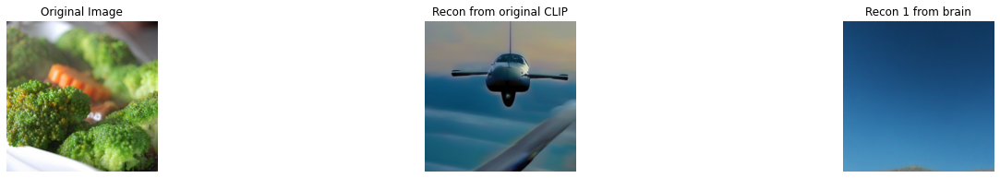

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'The aircraft was last seen slowly climbing into the overcast, but shortly after emerged from the clouds descending before impacting an embankment near Interstate 17.<br /> <br /> The pilot, the sole occupant on the flight was killed in the accident.', 'url': 'https://photos.smugmug.com/Commercial-Aviation/December-23-2004/i-2q6CCCG/0/f92b0016/O/310c.jpg', 'id': 2680096010, 'similarity': 0.8484441041946411}, {'caption': 'Single engine airplane landing at a high altitude mountain airport in the Alps in front of snow covered peaks', 'url': 'https://us.123rf.com/450wm/miq1969/miq19691803/miq1969180300017/98550984-single-engine-airplane-landing-at-a-high-altitude-mountain-airport-in-the-alps-in-front-of-snow-cove.jpg?ver=6', 'id': 2866574694, 'similarity': 0.8357537388801575}, {'caption': 'Over-Wings-Safari', 'url': 'http://surewaytours.net/wp-content/uploads/2015/11/Over-Wings-Safari1.jpg', 'id': 4511133881, 'similarity': 0.8350372314453125}, {'caption': 'Historický vývoj let

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb6c821d710>


{'caption': 'Historický vývoj letounů ZLIN', 'url': 'https://zlinaircraft.eu/galerie/16_min_1583931242.jpg', 'id': 5249391425, 'similarity': 0.8316774964332581}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5C479EB50>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB70099B090>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB701180150>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Name: flyby.jpg Views: 540 Size: 86.6 KB Description: The Harrier 46 in flight.', 'url': 'https://static.rcgroups.net/forums/attachments/4/7/5/a917281-68-flyby.jpg?d=1153306031', 'id': 534938186, 'similarity': 0.8265534043312073}, {'caption': 'Takeoff', 'url': 'https://www.returnofkings.com/wp-content/uploads/2014/01/Takeoff-620x350.jpg', 'id': 47368690, 'similarity': 0.8192073106765747}, {'caption': 'Small Plane Flying In Blue Sky Camera is following a small plane flying in a crystal blue sky. propeller airplane stock videos & royalty-free footage', 'url': 'https://media.istockphoto.com/videos/small-plane-flying-in-blue-sky-video-id467803122?s=640x640', 'id': 3039189418, 'similarity': 0.8181484341621399}]
{'caption': 'Name: flyby.jpg Views: 540 Size: 86.6 KB Description: The Harrier 46 in flight.', 'url': 'https://static.rcgroups.net/forums/attachments/4/7/5/a917281-68-flyby.jpg?d=1153306031', 'id': 534938186, 'similarity': 0.8265534043312073}
{'caption': 'Takeoff', 'url

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb701112e90>


{'caption': 'Small Plane Flying In Blue Sky Camera is following a small plane flying in a crystal blue sky. propeller airplane stock videos & royalty-free footage', 'url': 'https://media.istockphoto.com/videos/small-plane-flying-in-blue-sky-video-id467803122?s=640x640', 'id': 3039189418, 'similarity': 0.8181484341621399}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D860D0>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D7CFD0>]


  0%|          | 0/50 [00:00<?, ?it/s]

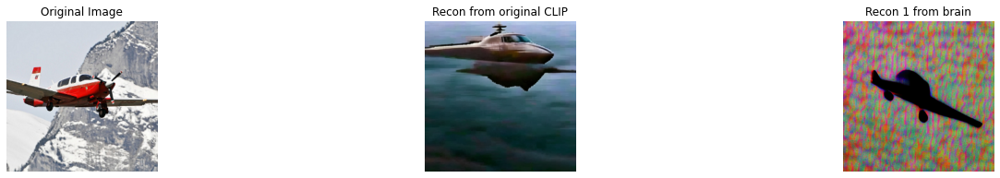

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Grafika komputerowa, programowanie, informatyka, MINECRAFT.', 'url': 'https://st-lento.pl/adpics/original/05_2017/29/2fe5e7-grafika-komputerowa-programowanie-informatyka-i-nie-tylko-uslugi-i-firmy-zdjecia.jpg', 'id': 3696924526, 'similarity': 0.8122924566268921}, {'caption': 'My friends and I having a LAN party in Estonia, 2010. We would mostly play StarCraft or Civilization, or as pictured here - racing games to wind down at the end.', 'url': 'https://www.riinu.me/img/lanparty2010.jpg', 'id': 3343279905, 'similarity': 0.8066143989562988}, {'caption': 'DanDomain bidrager med Edison-robotter i Randers', 'url': 'https://codingpirates.dk/wp-content/uploads/2016/11/top800px_codingpirates-400x250.jpg', 'id': 4476882307, 'similarity': 0.7997541427612305}, {'caption': 'Lotři Hronov pořádají každý rok tradiční LAN párty', 'url': 'http://www.lo3.cz/wp-content/uploads/2014/01/Lotri-Hronov-LAN-party-2013-009-80x80.jpg', 'id': 3505505085, 'similarity': 0.7973647117614746}]
{'caption'

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb6c8a2d050>


{'caption': 'Lotři Hronov pořádají každý rok tradiční LAN párty', 'url': 'http://www.lo3.cz/wp-content/uploads/2014/01/Lotri-Hronov-LAN-party-2013-009-80x80.jpg', 'id': 3505505085, 'similarity': 0.7973647117614746}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700EF9310>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700EF9850>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB70116FF10>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': "Lyssa's new zen office space at home. Lyssa started working from home twice a week and is forever grateful for her organization and managers for being so flexible.", 'url': 'https://greatgoalrush.files.wordpress.com/2013/12/3-2013.jpg?w=700', 'id': 2751899556, 'similarity': 0.8274944424629211}, {'caption': 'Développer votre espace de travail électronique/Science', 'url': 'https://image.tubefr.com/thumb/170x110/0/68/0682b9383f0303f28a49e079463e0eab.jpg', 'id': 4361533664, 'similarity': 0.8265381455421448}, {'caption': 'OfficeTourMosesandTVInterview', 'url': 'http://stc.videowired.com/com/img/thumbs/4177759.jpg', 'id': 1113827655, 'similarity': 0.8261833190917969}, {'caption': 'Executive desk with Hutch', 'url': 'https://i.ebayimg.com/00/s/ODAwWDQ1MA==/z/iwAAAOSwi8VZOqAO/$_35.JPG', 'id': 1828835742, 'similarity': 0.8251001238822937}]
{'caption': "Lyssa's new zen office space at home. Lyssa started working from home twice a week and is forever grateful for her organization a

  0%|          | 0/50 [00:00<?, ?it/s]

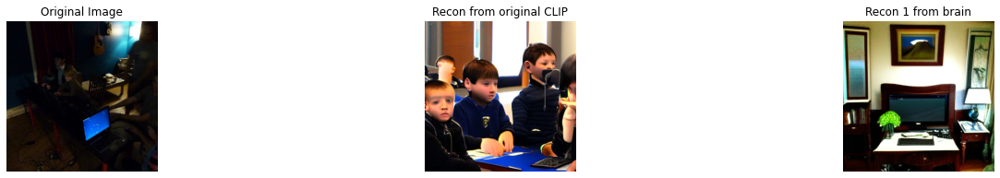

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'High Speed Camera : Ocean Waves Beach Resort 5 Footage', 'url': 'http://d1hw6n3yxknhky.cloudfront.net/000493127_icon.jpeg', 'id': 3813869429, 'similarity': 0.8593394756317139}, {'caption': 'Beach', 'url': 'https://farm5.static.flickr.com/4140/4753607903_a963a6765e.jpg', 'id': 4905638348, 'similarity': 0.8318631052970886}, {'caption': 'Sea wave foam froth liquid, seascape coastal beauty. Sea wave foam motion liquid beauty seascape coastal stock video footage', 'url': 'https://thumbs.dreamstime.com/t/sea-%C3%A2%E2%82%AC%E2%80%B9%C3%A2%E2%82%AC%E2%80%B9wave-foam-motion-liquid-beauty-seascape-coastal-sea-%C3%A2%E2%82%AC%E2%80%B9%C3%A2%E2%82%AC%E2%80%B9wave-foam-froth-liquid-seascape-coastal-beauty-112886402.jpg', 'id': 945867395, 'similarity': 0.8300535678863525}, {'caption': 'Picturesque Pacific', 'url': 'https://athometogether.files.wordpress.com/2015/10/img_5580.jpg?w=133&h=199', 'id': 876207555, 'similarity': 0.8296235799789429}]
{'caption': 'High Speed Camera : Ocean Wav

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': "Paroles de voyageurs #5 : Anne, des Maldives au Sri Lanka, une belle histoire d'amour", 'url': 'https://media.focus-voyage.com/i/615/6155528/paroles-voyageurs-5-anne-maldives-sri-lanka-b-L-avc8fn.png', 'id': 5036066124, 'similarity': 0.850215494632721}, {'caption': 'Photo of Martinique Beach', 'url': 'http://im-1.msw.ms/md/image.php?id=299838&type=PHOTOLAB&resize_type=STREAM_MEDIUM_SQUARE', 'id': 628513548, 'similarity': 0.8439257740974426}, {'caption': 'Body-surf', 'url': 'https://www.campinglagrisse.com/wp-content/gallery/accueil/body-surf.jpg', 'id': 704795230, 'similarity': 0.8430846929550171}, {'caption': 'High Speed Camera : Ocean Waves Beach Resort 5 Footage', 'url': 'http://d1hw6n3yxknhky.cloudfront.net/000493127_icon.jpeg', 'id': 3813869429, 'similarity': 0.8427910804748535}]
{'caption': "Paroles de voyageurs #5 : Anne, des Maldives au Sri Lanka, une belle histoire d'amour", 'url': 'https://media.focus-voyage.com/i/615/6155528/paroles-voyageurs-5-anne-maldives-sr

  0%|          | 0/50 [00:00<?, ?it/s]

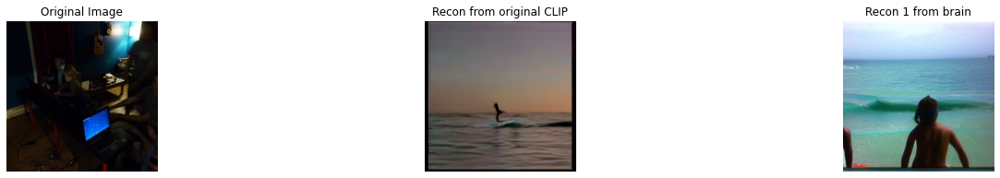

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'High Speed Camera : Ocean Waves Beach Resort 5 Footage', 'url': 'http://d1hw6n3yxknhky.cloudfront.net/000493127_icon.jpeg', 'id': 3813869429, 'similarity': 0.8593394756317139}, {'caption': 'Beach', 'url': 'https://farm5.static.flickr.com/4140/4753607903_a963a6765e.jpg', 'id': 4905638348, 'similarity': 0.8318631052970886}, {'caption': 'Sea wave foam froth liquid, seascape coastal beauty. Sea wave foam motion liquid beauty seascape coastal stock video footage', 'url': 'https://thumbs.dreamstime.com/t/sea-%C3%A2%E2%82%AC%E2%80%B9%C3%A2%E2%82%AC%E2%80%B9wave-foam-motion-liquid-beauty-seascape-coastal-sea-%C3%A2%E2%82%AC%E2%80%B9%C3%A2%E2%82%AC%E2%80%B9wave-foam-froth-liquid-seascape-coastal-beauty-112886402.jpg', 'id': 945867395, 'similarity': 0.8300535678863525}, {'caption': 'Picturesque Pacific', 'url': 'https://athometogether.files.wordpress.com/2015/10/img_5580.jpg?w=133&h=199', 'id': 876207555, 'similarity': 0.8296235799789429}]
{'caption': 'High Speed Camera : Ocean Wav

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Detektiv-Ralley am Strand: Den Entführern auf der Spur', 'url': 'https://www.sh-tourismus.de/data/imxplatformj/img_7834-2.jpg', 'id': 5146564851, 'similarity': 0.7730910181999207}, {'caption': 'Stock Video Footage of School children by Beach Football playing training', 'url': 'http://d1hw6n3yxknhky.cloudfront.net/032642029_iconv.jpeg', 'id': 2876705350, 'similarity': 0.7630691528320312}, {'caption': 'ws man jumping to catch pass during touch football game on beach - touch football video stock e b–roll', 'url': 'https://media.gettyimages.com/videos/man-jumping-to-catch-pass-during-touch-football-game-on-beach-video-id1189511366?s=640x640', 'id': 2950951573, 'similarity': 0.7617558836936951}]
{'caption': 'Detektiv-Ralley am Strand: Den Entführern auf der Spur', 'url': 'https://www.sh-tourismus.de/data/imxplatformj/img_7834-2.jpg', 'id': 5146564851, 'similarity': 0.7730910181999207}


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700e92cb0>


{'caption': 'Stock Video Footage of School children by Beach Football playing training', 'url': 'http://d1hw6n3yxknhky.cloudfront.net/032642029_iconv.jpeg', 'id': 2876705350, 'similarity': 0.7630691528320312}
{'caption': 'ws man jumping to catch pass during touch football game on beach - touch football video stock e b–roll', 'url': 'https://media.gettyimages.com/videos/man-jumping-to-catch-pass-during-touch-football-game-on-beach-video-id1189511366?s=640x640', 'id': 2950951573, 'similarity': 0.7617558836936951}
[None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB7006043D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700C62890>]


  0%|          | 0/50 [00:00<?, ?it/s]

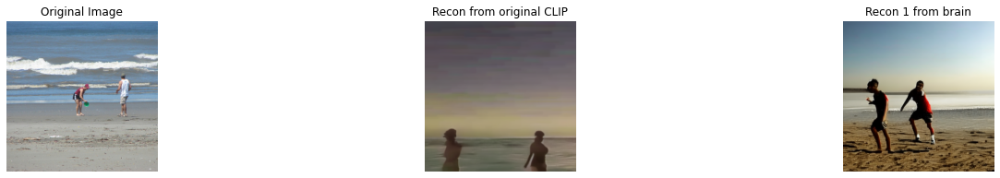

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Anita, 53, Eindhoven', 'url': 'https://ii.cdn.tf/u120408657/r455x502/40:16n1y5a.jpg', 'id': 713378916, 'similarity': 0.8038192391395569}, {'caption': 'Johanna Goulot reçoit en direct les compliments de Cyril Lignac', 'url': 'https://cdn-s-www.lejsl.com/images/820DE7AE-EF51-4593-B313-BCA827F36F04/NW_listF/johanna-goulot-recoit-en-direct-les-compliments-de-cyril-lignac-1591460938.jpg', 'id': 4796393122, 'similarity': 0.7905179262161255}, {'caption': 'Cornell Sabrina Miller, Acupuncturist  in Minneapolis', 'url': 'https://cdn0.sussexdirectories.com/cam/cam_photos/sized/27/10/501027_6_120x150.jpg?pu=0', 'id': 4438012235, 'similarity': 0.7875962257385254}]
{'caption': 'Anita, 53, Eindhoven', 'url': 'https://ii.cdn.tf/u120408657/r455x502/40:16n1y5a.jpg', 'id': 713378916, 'similarity': 0.8038192391395569}


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700f78a10>


{'caption': 'Johanna Goulot reçoit en direct les compliments de Cyril Lignac', 'url': 'https://cdn-s-www.lejsl.com/images/820DE7AE-EF51-4593-B313-BCA827F36F04/NW_listF/johanna-goulot-recoit-en-direct-les-compliments-de-cyril-lignac-1591460938.jpg', 'id': 4796393122, 'similarity': 0.7905179262161255}
{'caption': 'Cornell Sabrina Miller, Acupuncturist  in Minneapolis', 'url': 'https://cdn0.sussexdirectories.com/cam/cam_photos/sized/27/10/501027_6_120x150.jpg?pu=0', 'id': 4438012235, 'similarity': 0.7875962257385254}
[None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700F82490>, None]


Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connection.py", line 175, in _new_conn
    (self._dns_host, self.port), self.timeout, **extra_kw
  File "/opt/conda/lib/python3.7/site-packages/urllib3/util/connection.py", line 72, in create_connection
    for res in socket.getaddrinfo(host, port, family, socket.SOCK_STREAM):
  File "/opt/conda/lib/python3.7/socket.py", line 752, in getaddrinfo
    for res in _socket.getaddrinfo(host, port, family, type, proto, flags):
socket.gaierror: [Errno -2] Name or service not known

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 710, in urlopen
    chunked=chunked,
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 386, in _make_request
    self._validate_conn(conn)
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", lin

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Jackie Weger', 'url': 'https://images-na.ssl-images-amazon.com/images/I/51IeVlF+M4L._SY300_.jpg', 'id': 3773544405, 'similarity': 0.8300089240074158}, {'caption': 'Janie Oct 2012', 'url': 'https://distinctive-journeys.com/wp-content/uploads/2016/06/Janie-Oct-20121.jpg', 'id': 4952746557, 'similarity': 0.8293455243110657}]
{'caption': 'Jackie Weger', 'url': 'https://images-na.ssl-images-amazon.com/images/I/51IeVlF+M4L._SY300_.jpg', 'id': 3773544405, 'similarity': 0.8300089240074158}
{'caption': 'Janie Oct 2012', 'url': 'https://distinctive-journeys.com/wp-content/uploads/2016/06/Janie-Oct-20121.jpg', 'id': 4952746557, 'similarity': 0.8293455243110657}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700F82CD0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700EBB690>]


  0%|          | 0/50 [00:00<?, ?it/s]

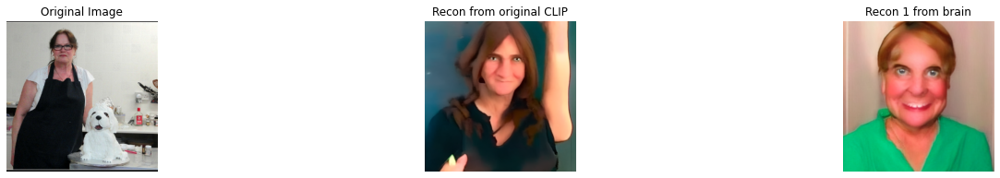

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': "Feliciano Lopez was brought in to play an exhibition during the women's event in Montreal last week.", 'url': 'https://cdn-s3.si.com/s3fs-public/si/dam/assets/13/08/14/130814165721-feliciano-lopez-single-image-cut.jpg', 'id': 3180570867, 'similarity': 0.8431776762008667}, {'caption': 'melzer: KYIV, UKRAINE - JULY 15, 2016: Sergiy STAKHOVSKY of Ukraine in action during BNP Paribas Davis Cup EuropeAfrica Zone Group I game against Gerald MELZER of Austria at Campa Bucha Tennis Club in Kyiv', 'url': 'https://us.123rf.com/450wm/katatonia/katatonia1608/katatonia160800054/60818582-kyiv-ukraine--july-15-2016-sergiy-stakhovsky-of-ukraine-in-action-during-bnp-paribas-davis-cup-europ.jpg?ver=6', 'id': 1257618976, 'similarity': 0.8430563807487488}, {'caption': 'FELICIANO LOPEZ (ESP)<br /> <br /> TENNIS - AEGON CHAMPIONSHIPS -  2015 -  QUEENS CLUB - LONDON -  ATP 500- 2015  - ENGLAND - UNITED KINGDOM<br /> <br /> &copy; AMN IMAGES', 'url': 'https://ssl.c.photoshelter.com/img-get/I0000

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'US Open 2015', 'url': 'https://thefrogzeye.files.wordpress.com/2015/09/img_2410.jpg?w=320&', 'id': 395338101, 'similarity': 0.8095431923866272}, {'caption': 'service au tennis appuis', 'url': 'https://www.tennispourcentage.fr/wp-content/uploads/2013/12/Direction-appuis-service-Federer.png', 'id': 5286835699, 'similarity': 0.806795060634613}, {'caption': 'Western and Southern Open tennis tournament, Cincinnati, USA - 16 Aug 2019', 'url': 'http://www.sipa.com//thumbnails26/00000029567/shutterstock40722660_000090.thw', 'id': 3177575023, 'similarity': 0.8049761056900024}, {'caption': 'flushing: FLUSHING, NY - AUGUST 21: Professional tennis player Gilles Simon practices for US Open at Billie Jean King National Tennis Center on August 21, 2012 in Flushing, NY', 'url': 'https://us.123rf.com/450wm/zhukovsky/zhukovsky1301/zhukovsky130100106/17393432-flushing-ny--august-21-professional-tennis-player-gilles-simon-practices-for-us-open-at-billie-jean-.jpg?ver=6', 'id': 2485033717, 's

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700e67a10>


{'caption': 'flushing: FLUSHING, NY - AUGUST 21: Professional tennis player Gilles Simon practices for US Open at Billie Jean King National Tennis Center on August 21, 2012 in Flushing, NY', 'url': 'https://us.123rf.com/450wm/zhukovsky/zhukovsky1301/zhukovsky130100106/17393432-flushing-ny--august-21-professional-tennis-player-gilles-simon-practices-for-us-open-at-billie-jean-.jpg?ver=6', 'id': 2485033717, 'similarity': 0.8040602207183838}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700CC7450>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB7010B0890>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB70101B810>]


  0%|          | 0/50 [00:00<?, ?it/s]

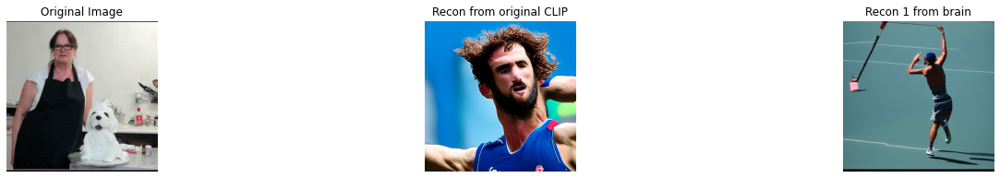

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': "Feliciano Lopez was brought in to play an exhibition during the women's event in Montreal last week.", 'url': 'https://cdn-s3.si.com/s3fs-public/si/dam/assets/13/08/14/130814165721-feliciano-lopez-single-image-cut.jpg', 'id': 3180570867, 'similarity': 0.8431776762008667}, {'caption': 'melzer: KYIV, UKRAINE - JULY 15, 2016: Sergiy STAKHOVSKY of Ukraine in action during BNP Paribas Davis Cup EuropeAfrica Zone Group I game against Gerald MELZER of Austria at Campa Bucha Tennis Club in Kyiv', 'url': 'https://us.123rf.com/450wm/katatonia/katatonia1608/katatonia160800054/60818582-kyiv-ukraine--july-15-2016-sergiy-stakhovsky-of-ukraine-in-action-during-bnp-paribas-davis-cup-europ.jpg?ver=6', 'id': 1257618976, 'similarity': 0.8430563807487488}, {'caption': 'FELICIANO LOPEZ (ESP)<br /> <br /> TENNIS - AEGON CHAMPIONSHIPS -  2015 -  QUEENS CLUB - LONDON -  ATP 500- 2015  - ENGLAND - UNITED KINGDOM<br /> <br /> &copy; AMN IMAGES', 'url': 'https://ssl.c.photoshelter.com/img-get/I0000

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Tennis - Ernests Gulbis', 'url': 'http://www2.tennisserver.com/images/photofeed/2009/legg_mason_washington_dc/090804/berdych-gulbis/LeggMason-20090804-02-0497.jpg', 'id': 4157666804, 'similarity': 0.8505209684371948}, {'caption': '20 February 2008: Andy Roddick of the United States during his first round win over Chris Guccione of Australia in the SAP Open at the HP Pavilion in San Jose, CA.', 'url': 'https://photos.smugmug.com/Individual-Sports/Tennis/i-p7CDM9G/0/64167930/L/DRH_8244-L.jpg', 'id': 2573387385, 'similarity': 0.8489851355552673}, {'caption': "Photo - Australia's Lleyton Hewitt  plays a return to Spain's Feliciano Lopez at The Queen's Club, grass-court tournament  in London Wednesday June 11, 2014. Lopez defeat Hewitt  6-3, 6-4.  (AP Photo/Jonathan Brady/PA) UNITED KINGDOM OUT", 'url': 'http://cdn2.newsok.biz/cache/r960-a1a9f410f3a1208f9c54ccf1259ddcf0.jpg', 'id': 1478839568, 'similarity': 0.8487438559532166}, {'caption': 'Julien Benneteau W&SFG Masters Cinci

  0%|          | 0/50 [00:00<?, ?it/s]

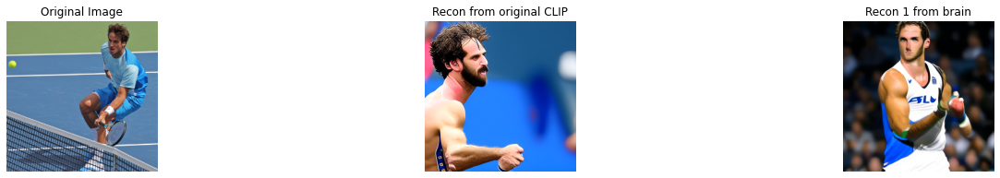

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'materials for menorahs', 'url': 'http://eduart4kids.com/wp-content/uploads/2013/11/materials-for-menorahs1-e1385352391731-197x300.jpg', 'id': 909253683, 'similarity': 0.8270907402038574}, {'caption': 'restos de tecido, tesoura e cola', 'url': 'https://desafiouhu.abae.pt/wp-content/uploads/et_temp/restos%20de%20tecido,%20tesoura%20e%20cola-1011568_250x190.jpg', 'id': 3761628732, 'similarity': 0.8191690444946289}, {'caption': 'crafts', 'url': 'https://annastephanie.files.wordpress.com/2011/09/crafts.jpg?w=501&', 'id': 642812131, 'similarity': 0.803739070892334}, {'caption': 'Supplies you need for Yarn Art', 'url': 'https://usercontent1.hubstatic.com/6858740_f520.jpg', 'id': 544525901, 'similarity': 0.7962113618850708}]
{'caption': 'materials for menorahs', 'url': 'http://eduart4kids.com/wp-content/uploads/2013/11/materials-for-menorahs1-e1385352391731-197x300.jpg', 'id': 909253683, 'similarity': 0.8270907402038574}


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700cd84d0>


{'caption': 'restos de tecido, tesoura e cola', 'url': 'https://desafiouhu.abae.pt/wp-content/uploads/et_temp/restos%20de%20tecido,%20tesoura%20e%20cola-1011568_250x190.jpg', 'id': 3761628732, 'similarity': 0.8191690444946289}


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700cd8050>


{'caption': 'crafts', 'url': 'https://annastephanie.files.wordpress.com/2011/09/crafts.jpg?w=501&', 'id': 642812131, 'similarity': 0.803739070892334}
{'caption': 'Supplies you need for Yarn Art', 'url': 'https://usercontent1.hubstatic.com/6858740_f520.jpg', 'id': 544525901, 'similarity': 0.7962113618850708}
[None, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB7010E5210>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB7010E5D90>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Mon sac à main et son contenu....', 'url': 'http://img.over-blog-kiwi.com/0/89/49/56/20140525/ob_8a3b95_sdc14214.JPG', 'id': 33934374, 'similarity': 0.8017444014549255}, {'caption': "what's in my bag by Laura O'Hanesian", 'url': 'https://cdn.eyeem.com/thumb/4dcce3da32071e1c3956515b9c9be8cb6d8f7019-1366667179/h/400', 'id': 1470318481, 'similarity': 0.8005130887031555}, {'caption': 'clutteredbag2', 'url': 'https://happypajimna.files.wordpress.com/2007/05/clutteredbag2.png?w=510', 'id': 4388036324, 'similarity': 0.7974448800086975}, {'caption': 'Tasche packen', 'url': 'https://eswirdzeitdasseszeitwird.files.wordpress.com/2017/01/foto-12.jpg?w=217&', 'id': 4232288381, 'similarity': 0.7940083742141724}]
{'caption': 'Mon sac à main et son contenu....', 'url': 'http://img.over-blog-kiwi.com/0/89/49/56/20140525/ob_8a3b95_sdc14214.JPG', 'id': 33934374, 'similarity': 0.8017444014549255}
{'caption': "what's in my bag by Laura O'Hanesian", 'url': 'https://cdn.eyeem.com/thumb/4dcce3da

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700f15110>


[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700B6D090>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700B6D1D0>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB701175E50>]


  0%|          | 0/50 [00:00<?, ?it/s]

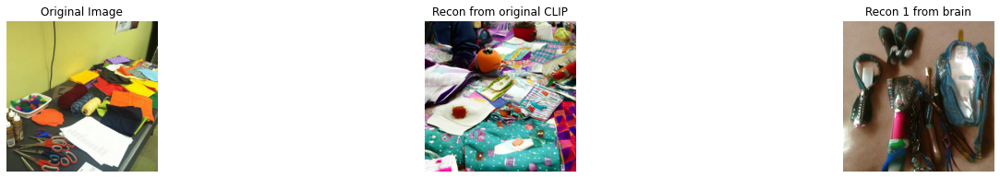

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Snowboarder Skittering on a Rail by Bob Winsett', 'url': 'https://imgc.allpostersimages.com/img/posters/bob-winsett-snowboarder-skittering-on-a-rail_u-L-P3HY500.jpg?src=gp&w=300&h=375', 'id': 616457099, 'similarity': 0.8374455571174622}, {'caption': 'Snowboarder performs trick over the sunny blue sky. Stock Footage', 'url': 'https://d1hw6n3yxknhky.cloudfront.net/060937903_iconm.jpeg', 'id': 2825262185, 'similarity': 0.8286327123641968}, {'caption': '7 July NZ Snowboarder Banked Slalom 2012', 'url': 'https://farm1.static.flickr.com/7116/7673664424_b57016b904_z.jpg', 'id': 4892157192, 'similarity': 0.8270212411880493}]
{'caption': 'Snowboarder Skittering on a Rail by Bob Winsett', 'url': 'https://imgc.allpostersimages.com/img/posters/bob-winsett-snowboarder-skittering-on-a-rail_u-L-P3HY500.jpg?src=gp&w=300&h=375', 'id': 616457099, 'similarity': 0.8374455571174622}
{'caption': 'Snowboarder performs trick over the sunny blue sky. Stock Footage', 'url': 'https://d1hw6n3yxknhky

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Interview: Chris Haffey about his Vibralux Part - Be-Mag', 'url': 'https://www.be-mag.com/wp-content/uploads/2015/01/haffey_vod_5.png', 'id': 1717202550, 'similarity': 0.8775640726089478}, {'caption': 'Fermé pour raisons de sécurité, le skate park de Tipaerui a réouvert ce lundi', 'url': 'https://la1ere.francetvinfo.fr/image/IvhnViZ0-K6NBRqCzN-4g1O4zRU/600x400/outremer/2019/10/03/5d95d12308fe3_skate-1-559849.jpg', 'id': 4480495892, 'similarity': 0.876866340637207}, {'caption': 'skate20111.jpg', 'url': 'http://www.stargraphics.jp/blog/skate20111.jpg', 'id': 3784804504, 'similarity': 0.875942051410675}, {'caption': 'BHouse Trick Of The Week - The Shuv It', 'url': 'https://cdn.shoplightspeed.com/shops/611538/files/14021463/2760x1240x1/image.jpg', 'id': 2048410461, 'similarity': 0.8750588893890381}]
{'caption': 'Interview: Chris Haffey about his Vibralux Part - Be-Mag', 'url': 'https://www.be-mag.com/wp-content/uploads/2015/01/haffey_vod_5.png', 'id': 1717202550, 'similarity'

  0%|          | 0/50 [00:00<?, ?it/s]

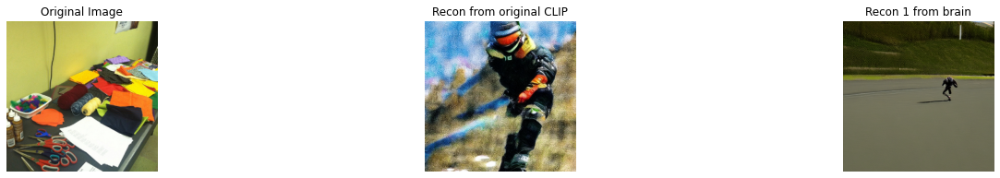

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Snowboarder Skittering on a Rail by Bob Winsett', 'url': 'https://imgc.allpostersimages.com/img/posters/bob-winsett-snowboarder-skittering-on-a-rail_u-L-P3HY500.jpg?src=gp&w=300&h=375', 'id': 616457099, 'similarity': 0.8374455571174622}, {'caption': 'Snowboarder performs trick over the sunny blue sky. Stock Footage', 'url': 'https://d1hw6n3yxknhky.cloudfront.net/060937903_iconm.jpeg', 'id': 2825262185, 'similarity': 0.8286327123641968}, {'caption': '7 July NZ Snowboarder Banked Slalom 2012', 'url': 'https://farm1.static.flickr.com/7116/7673664424_b57016b904_z.jpg', 'id': 4892157192, 'similarity': 0.8270212411880493}]
{'caption': 'Snowboarder Skittering on a Rail by Bob Winsett', 'url': 'https://imgc.allpostersimages.com/img/posters/bob-winsett-snowboarder-skittering-on-a-rail_u-L-P3HY500.jpg?src=gp&w=300&h=375', 'id': 616457099, 'similarity': 0.8374455571174622}
{'caption': 'Snowboarder performs trick over the sunny blue sky. Stock Footage', 'url': 'https://d1hw6n3yxknhky

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Snowboarder Skittering on a Rail by Bob Winsett', 'url': 'https://imgc.allpostersimages.com/img/posters/bob-winsett-snowboarder-skittering-on-a-rail_u-L-P3HY500.jpg?src=gp&w=300&h=375', 'id': 616457099, 'similarity': 0.8381717801094055}, {'caption': 'Interview: Chris Haffey about his Vibralux Part - Be-Mag', 'url': 'https://www.be-mag.com/wp-content/uploads/2015/01/haffey_vod_5.png', 'id': 1717202550, 'similarity': 0.837325930595398}, {'caption': 'Mit dem Longboard durch den Schnee', 'url': 'https://www.strongg.com/wp-content/uploads/screenshot_05-2-1080x598.jpg', 'id': 3897884625, 'similarity': 0.8362345695495605}, {'caption': 'skate3211ffggh.jpg', 'url': 'http://www.stargraphics.jp/blog/skate3211ffggh.jpg', 'id': 3947976372, 'similarity': 0.8357455730438232}]
{'caption': 'Snowboarder Skittering on a Rail by Bob Winsett', 'url': 'https://imgc.allpostersimages.com/img/posters/bob-winsett-snowboarder-skittering-on-a-rail_u-L-P3HY500.jpg?src=gp&w=300&h=375', 'id': 616457099

  0%|          | 0/50 [00:00<?, ?it/s]

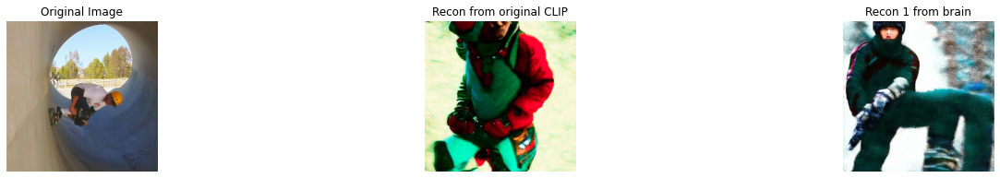

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Stripes and More Stripes by kejeki', 'url': 'http://t11.deviantart.net/tI1gTFebHfNC1uR4pPa-q2qASf8=/300x200/filters:fixed_height(100,100):origin()/pre14/ab12/th/pre/i/2015/124/2/8/stripes_and_more_stripes_by_kejeki-d1zeops.jpg', 'id': 216720529, 'similarity': 0.9007579684257507}, {'caption': 'Společné Zebra, věda, názvy Equus burchellii, detailní v Hd', 'url': 'https://st2.depositphotos.com/1156587/9557/v/600/depositphotos_95579222-stock-video-common-zebra-science-names-equus.jpg', 'id': 3814662680, 'similarity': 0.8945861458778381}, {'caption': 'San Diego Zoo Anniversary Trip 181', 'url': 'https://suebeeandkat.files.wordpress.com/2013/11/san-diego-zoo-anniversary-trip-181.jpg?w=311&', 'id': 1103888915, 'similarity': 0.8931769728660583}]
{'caption': 'Stripes and More Stripes by kejeki', 'url': 'http://t11.deviantart.net/tI1gTFebHfNC1uR4pPa-q2qASf8=/300x200/filters:fixed_height(100,100):origin()/pre14/ab12/th/pre/i/2015/124/2/8/stripes_and_more_stripes_by_kejeki-d1zeops.jp

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Zebra', 'url': 'http://lh3.ggpht.com/_pDhIos2uqf8/S7XylxJq_oI/AAAAAAAACFI/d3OfkenND1Y/Zebra_thumb%5B1%5D.jpg?imgmax=800', 'id': 815266664, 'similarity': 0.902046799659729}, {'caption': 'Zebras', 'url': 'http://media.gettyimages.com/videos/zebras-video-id473200647?s=192x192', 'id': 4466483535, 'similarity': 0.900952160358429}, {'caption': 'Zebras 7', 'url': 'https://home.badenduo.de/wp-content/uploads/2019/07/DSCF7569-1024x682.jpeg', 'id': 5402985661, 'similarity': 0.8984761238098145}, {'caption': 'Mara Beautiful Zebra', 'url': 'https://farm2.static.flickr.com/1382/764424588_9ef9993e2a.jpg', 'id': 4127572379, 'similarity': 0.8983087539672852}]
{'caption': 'Zebra', 'url': 'http://lh3.ggpht.com/_pDhIos2uqf8/S7XylxJq_oI/AAAAAAAACFI/d3OfkenND1Y/Zebra_thumb%5B1%5D.jpg?imgmax=800', 'id': 815266664, 'similarity': 0.902046799659729}
{'caption': 'Zebras', 'url': 'http://media.gettyimages.com/videos/zebras-video-id473200647?s=192x192', 'id': 4466483535, 'similarity': 0.9009521603584

  0%|          | 0/50 [00:00<?, ?it/s]

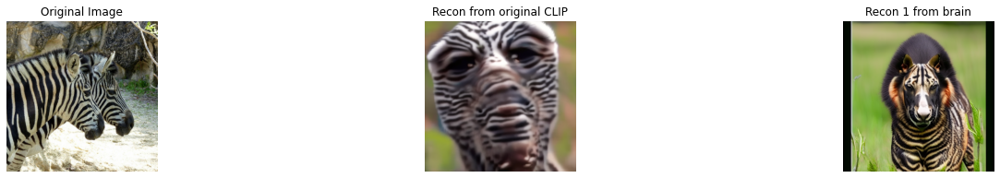

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'transporte publico -- bus', 'url': 'https://a0.muscache.com/im/pictures/063f388a-681e-4b90-a2c0-c39cb8cb5dfd.jpg?aki_policy=x_large', 'id': 4754638632, 'similarity': 0.7378650903701782}, {'caption': 'Atascos en Valencia 20180702_163608 (8)', 'url': 'https://valencianoticias.com/wp-content/uploads/2018/07/Atascos-en-Valencia-20180702_163608-8-250x122.jpg', 'id': 4588293573, 'similarity': 0.7336744070053101}, {'caption': 'Autobús turístico de dos pisos y, en segundo plano, bus lanzadera azul hacia el Park Güell a su paso por la avenida Virgen de Montserrat de Barcelona / @VeinsdeCanBaro', 'url': 'https://cronicaglobal.elespanol.com/uploads/s1/63/10/02/9/buses_4_275x145.jpeg', 'id': 5004917715, 'similarity': 0.7336327433586121}, {'caption': 'metro-valencia-metrovalencia-20160919_084450', 'url': 'https://valencianoticias.com/wp-content/uploads/2017/01/METRO-VALENCIA-METROVALENCIA-20160919_0844501-150x113.jpg', 'id': 1063298314, 'similarity': 0.7325596809387207}]
{'caption': '

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700d7b950>


{'caption': 'Autobús turístico de dos pisos y, en segundo plano, bus lanzadera azul hacia el Park Güell a su paso por la avenida Virgen de Montserrat de Barcelona / @VeinsdeCanBaro', 'url': 'https://cronicaglobal.elespanol.com/uploads/s1/63/10/02/9/buses_4_275x145.jpeg', 'id': 5004917715, 'similarity': 0.7336327433586121}
{'caption': 'metro-valencia-metrovalencia-20160919_084450', 'url': 'https://valencianoticias.com/wp-content/uploads/2017/01/METRO-VALENCIA-METROVALENCIA-20160919_0844501-150x113.jpg', 'id': 1063298314, 'similarity': 0.7325596809387207}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB712412490>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D3DCD0>, None]


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700d25b90>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'minibus electrico emt', 'url': 'https://movilidadelectrica.com/wp-content/uploads/2016/01/minibus-electrico-emt-324x160.jpg', 'id': 1223453078, 'similarity': 0.7734895348548889}, {'caption': 'Bus BHNS DSCF5206', 'url': 'http://img.over-blog.com/300x224/1/89/54/33/Collectivites/Bus-BHNS-DSCF5206.JPG', 'id': 961026816, 'similarity': 0.7647168040275574}, {'caption': 'Χανιά: Ο καβγάς φοιτήτριας με ελεγκτή ακινητοποίησε το λεωφορείο', 'url': 'https://www.newsit.gr/wp-content/uploads/2017n/11/lll-300x169.jpg', 'id': 3570853283, 'similarity': 0.7635088562965393}]
{'caption': 'minibus electrico emt', 'url': 'https://movilidadelectrica.com/wp-content/uploads/2016/01/minibus-electrico-emt-324x160.jpg', 'id': 1223453078, 'similarity': 0.7734895348548889}
{'caption': 'Bus BHNS DSCF5206', 'url': 'http://img.over-blog.com/300x224/1/89/54/33/Collectivites/Bus-BHNS-DSCF5206.JPG', 'id': 961026816, 'similarity': 0.7647168040275574}
{'caption': 'Χανιά: Ο καβγάς φοιτήτριας με ελεγκτή ακινητο

  0%|          | 0/50 [00:00<?, ?it/s]

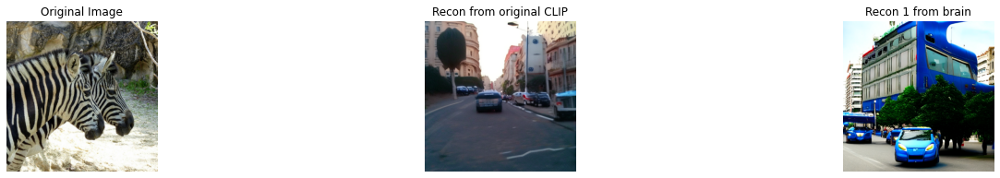

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'transporte publico -- bus', 'url': 'https://a0.muscache.com/im/pictures/063f388a-681e-4b90-a2c0-c39cb8cb5dfd.jpg?aki_policy=x_large', 'id': 4754638632, 'similarity': 0.7378650903701782}, {'caption': 'Atascos en Valencia 20180702_163608 (8)', 'url': 'https://valencianoticias.com/wp-content/uploads/2018/07/Atascos-en-Valencia-20180702_163608-8-250x122.jpg', 'id': 4588293573, 'similarity': 0.7336744070053101}, {'caption': 'Autobús turístico de dos pisos y, en segundo plano, bus lanzadera azul hacia el Park Güell a su paso por la avenida Virgen de Montserrat de Barcelona / @VeinsdeCanBaro', 'url': 'https://cronicaglobal.elespanol.com/uploads/s1/63/10/02/9/buses_4_275x145.jpeg', 'id': 5004917715, 'similarity': 0.7336327433586121}, {'caption': 'metro-valencia-metrovalencia-20160919_084450', 'url': 'https://valencianoticias.com/wp-content/uploads/2017/01/METRO-VALENCIA-METROVALENCIA-20160919_0844501-150x113.jpg', 'id': 1063298314, 'similarity': 0.7325596809387207}]
{'caption': '

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700db21d0>


{'caption': 'Autobús turístico de dos pisos y, en segundo plano, bus lanzadera azul hacia el Park Güell a su paso por la avenida Virgen de Montserrat de Barcelona / @VeinsdeCanBaro', 'url': 'https://cronicaglobal.elespanol.com/uploads/s1/63/10/02/9/buses_4_275x145.jpeg', 'id': 5004917715, 'similarity': 0.7336327433586121}
{'caption': 'metro-valencia-metrovalencia-20160919_084450', 'url': 'https://valencianoticias.com/wp-content/uploads/2017/01/METRO-VALENCIA-METROVALENCIA-20160919_0844501-150x113.jpg', 'id': 1063298314, 'similarity': 0.7325596809387207}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D50E50>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700F8EC90>, None]


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700db21d0>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Berislavićeva ulica', 'url': 'http://www.apartment-bery.hr/wp-content/uploads/apartment-bery-101-200x133.jpg', 'id': 4912682293, 'similarity': 0.7529526352882385}, {'caption': 'Brazilian bus-conductors take cash and let passengers through the turnstile', 'url': 'https://i2.wp.com/modernbrazil.files.wordpress.com/2014/04/img-20140426-00374.jpg?w=152&', 'id': 23798168, 'similarity': 0.7484923601150513}, {'caption': 'Autobús turístico de dos pisos y, en segundo plano, bus lanzadera azul hacia el Park Güell a su paso por la avenida Virgen de Montserrat de Barcelona / @VeinsdeCanBaro', 'url': 'https://cronicaglobal.elespanol.com/uploads/s1/63/10/02/9/buses_4_275x145.jpeg', 'id': 5004917715, 'similarity': 0.7453998327255249}, {'caption': '20141225_122742 安祥線バス - 朝日町西', 'url': 'https://cdn-ak.f.st-hatena.com/images/fotolife/i/iwase_akihiko/20141225/20141225122742_120.jpg', 'id': 4283671784, 'similarity': 0.7448386549949646}]
{'caption': 'Berislavićeva ulica', 'url': 'http://www.

  0%|          | 0/50 [00:00<?, ?it/s]

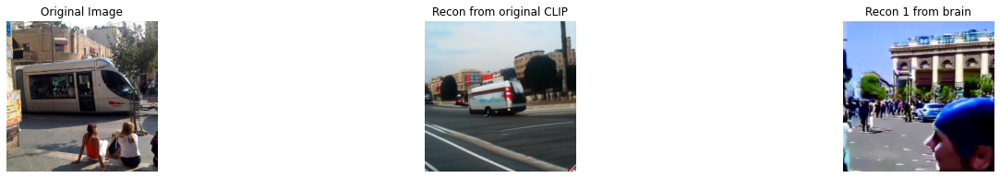

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'lichte vrachtwagen RENAULT Master, diesel, 2299cm³, 92kW, 1e inschr 06/04/12, chassisnr VF1MAF4DE46892071, 146020km, CO²-uitstoot 226g/km, Euro5, MTM 3500kg, Tarra 2164kg, compl met kentekenbewijs, gelijkvormigheidsattest, keuring tot 29/04/21, 1sleutel', 'url': 'https://img.appelboomonline.be/Image.aspx?img=504%7C128%7C10563%7C1m.jpg&x=595&y=350&box=1&nowm=1', 'id': 5352088203, 'similarity': 0.8109399676322937}, {'caption': 'Дверь боковая сдвижная, правая раздвижная, Серая, 7751472220 на Opel Vivaro, Renault Trafic, Nissan Primastar, Рено Трафик, Опель Виваро, Ниссан', 'url': 'https://images.ua.prom.st/1131398849_w200_h200_dver-bokovaya-sdvizhnaya.jpg', 'id': 3790852579, 'similarity': 0.8098025918006897}, {'caption': 'Grafiteiros e pichadores tomam conta dos becos; autorização para pintura de pontos comerciais cresce a cada dia na região - Renê Castro', 'url': 'https://conteudo.imguol.com.br/c/entretenimento/e3/2018/02/02/conheca-o-bairro-hippie-que-e-um-sucesso-em-toron

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Painted Walls Of Bandra - By Graffiti Artist Alex by firoze shakir photographerno1', 'url': 'https://lh4.googleusercontent.com/proxy/NCiP6p-LzwEjBOnq-nm0aRijq9eDi2NDaYtHoAG7GLHUVKWEzD12HmrqQgg5_9Mp0j5c63osjIWNHrJbWC8cO47aKJwXDCE30H8KHEbG-RM=s0-d', 'id': 3943526228, 'similarity': 0.787952721118927}, {'caption': 'Водил поезда машинист (1961) Виктор Жилин', 'url': 'https://pp.userapi.com/c6077/u113493420/video/s_2a8edb73.jpg', 'id': 4159676437, 'similarity': 0.7872925996780396}, {'caption': 'Skullphone', 'url': 'http://www.urban-shaker.com/wp-content/uploads/2011/05/Skullphone.png', 'id': 1041457350, 'similarity': 0.7858211398124695}, {'caption': 'Замшелость стен осоловелых<br/> И скрип простуженных дверей<br/> Крадутся поступью несвежей<br/> Вкруг наших жизней. Средь камней<br/> <br/> Уставших город существует-<br/> В колодец каркает окно,<br/> Что дом напротив- франт и щеголь,<br/> И не зовет давно в кино.<br/> <br/> Вот подворотня с подворотней<br/> Затеяли жестокий спор-

  0%|          | 0/50 [00:00<?, ?it/s]

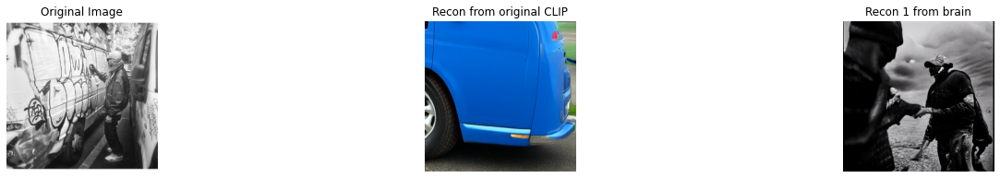

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Custom Made Suits For Grooms To Feel Like James Bond', 'url': 'https://i.weddingomania.com/custom-made-suits-for-grooms-to-feel-like-james-bond-4.jpg', 'id': 1747158132, 'similarity': 0.8759066462516785}, {'caption': 'Formal Men Photo Suit apk screenshot', 'url': 'https://image.winudf.com/v2/image/Y29tLmZvcm1hdGlvbmFwcHMudXNzdWlldF9zY3JlZW5fOF8xNTIxMTg4NzM0XzA5MA/screen-8.jpg?h=355&amp;fakeurl=1&amp;type=.jpg', 'id': 408689553, 'similarity': 0.8752329349517822}]
{'caption': 'Custom Made Suits For Grooms To Feel Like James Bond', 'url': 'https://i.weddingomania.com/custom-made-suits-for-grooms-to-feel-like-james-bond-4.jpg', 'id': 1747158132, 'similarity': 0.8759066462516785}
{'caption': 'Formal Men Photo Suit apk screenshot', 'url': 'https://image.winudf.com/v2/image/Y29tLmZvcm1hdGlvbmFwcHMudXNzdWlldF9zY3JlZW5fOF8xNTIxMTg4NzM0XzA5MA/screen-8.jpg?h=355&amp;fakeurl=1&amp;type=.jpg', 'id': 408689553, 'similarity': 0.8752329349517822}
[<PIL.Image.Image image mode=RGB size=336

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': "sm :o)'s avatar", 'url': 'https://i1.sndcdn.com/avatars-000005603952-khpt01-t500x500.jpg', 'id': 299391093, 'similarity': 0.8237553834915161}, {'caption': 'Profile cover photo', 'url': 'https://lh3.googleusercontent.com/-PgGvZSfJUG0/UhyDXEDqGxI/AAAAAAAAAY0/3GuE1QcZ1yg_lSb4_vZ-b3eBPXtKXKELACL0B/w256-h86-n-no/Yaz3.jpg', 'id': 4786474847, 'similarity': 0.8211800456047058}, {'caption': 'Dry Eyes', 'url': 'https://www.doctor-4-u.co.uk/media/catalog/category/d4u-dry-eyes-thumb.jpg', 'id': 4795952659, 'similarity': 0.8142269849777222}, {'caption': 'scythe by noirsacre', 'url': 'https://t00.deviantart.net/WI0Vmg2uRWoS81gUe9Uji4_vhwE=/fit-in/700x350/filters:fixed_height(100,100):origin()/pre00/8412/th/pre/f/2010/097/f/2/f26d214c1301c30c3fc7c527d53ac8ca.jpg', 'id': 885973798, 'similarity': 0.8131520748138428}]
{'caption': "sm :o)'s avatar", 'url': 'https://i1.sndcdn.com/avatars-000005603952-khpt01-t500x500.jpg', 'id': 299391093, 'similarity': 0.8237553834915161}
{'caption': 'Profil

  0%|          | 0/50 [00:00<?, ?it/s]

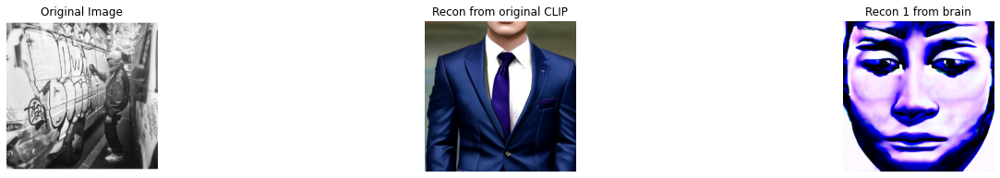

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Custom Made Suits For Grooms To Feel Like James Bond', 'url': 'https://i.weddingomania.com/custom-made-suits-for-grooms-to-feel-like-james-bond-4.jpg', 'id': 1747158132, 'similarity': 0.8759066462516785}, {'caption': 'Formal Men Photo Suit apk screenshot', 'url': 'https://image.winudf.com/v2/image/Y29tLmZvcm1hdGlvbmFwcHMudXNzdWlldF9zY3JlZW5fOF8xNTIxMTg4NzM0XzA5MA/screen-8.jpg?h=355&amp;fakeurl=1&amp;type=.jpg', 'id': 408689553, 'similarity': 0.8752329349517822}]
{'caption': 'Custom Made Suits For Grooms To Feel Like James Bond', 'url': 'https://i.weddingomania.com/custom-made-suits-for-grooms-to-feel-like-james-bond-4.jpg', 'id': 1747158132, 'similarity': 0.8759066462516785}
{'caption': 'Formal Men Photo Suit apk screenshot', 'url': 'https://image.winudf.com/v2/image/Y29tLmZvcm1hdGlvbmFwcHMudXNzdWlldF9zY3JlZW5fOF8xNTIxMTg4NzM0XzA5MA/screen-8.jpg?h=355&amp;fakeurl=1&amp;type=.jpg', 'id': 408689553, 'similarity': 0.8752329349517822}
[<PIL.Image.Image image mode=RGB size=336

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Binder-de-Luxe-Designer-Krawatte-Einstecktuch-Krawatten-Set-Tie-155-silber-Tlg', 'url': 'https://i.ebayimg.com/images/g/tPMAAOSwEo1cZasN/s-l300.jpg', 'id': 4314417554, 'similarity': 0.8384637832641602}, {'caption': '"""LAVALLIERE & pochette assortie (Marque) Bel ENSEMBLE 2 pièces, comme pour les grands : - LAVALIERE montée sur élastique (ou """"cravalière), très pratique, prête à l\'emploi pour les JUNIORS, en tissu brillant satiné, double pointe large, et noeud réhaussé d\'un petit brillant, - POCHETTE carrée assortie pour """"habiller"""" la poche poitrine de la veste."""', 'url': 'https://www.frutti-ceremonie.fr/wp-content/uploads/2015/10/Photo1132-450x338.jpg', 'id': 3408887476, 'similarity': 0.8370464444160461}, {'caption': 'Check-in Woven Microfiber Necktie', 'url': 'https://img.diytrade.com/smimg/529208/47050173-9000156-1/Check_in_Woven_Microfiber_Necktie/b4f4.jpg', 'id': 957999354, 'similarity': 0.8364142179489136}, {'caption': 'Damask Scroll Leaf Necktie Set Men 

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be710e90>


{'caption': 'Check-in Woven Microfiber Necktie', 'url': 'https://img.diytrade.com/smimg/529208/47050173-9000156-1/Check_in_Woven_Microfiber_Necktie/b4f4.jpg', 'id': 957999354, 'similarity': 0.8364142179489136}
{'caption': 'Damask Scroll Leaf Necktie Set Men Navy White Wedding Hanky  image 2', 'url': 'https://images.bonanzastatic.com/afu/images/8951/3826/damask_navy_leaf_tie1.jpg', 'id': 126482884, 'similarity': 0.834909975528717}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700B6DB50>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700BEE0D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D98750>]


  0%|          | 0/50 [00:00<?, ?it/s]

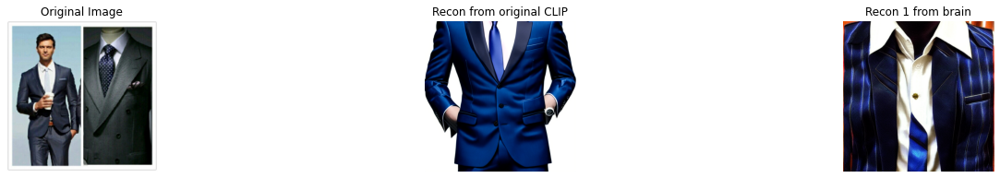

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': '東京都練馬区光が丘5丁目にあるカフェ「サンマルクカフェ 光が丘IMA店」アイスカフェラテLサイズ、クロワッサンサンド(タマゴサラダ)あらびきウインナー', 'url': 'https://cdn-ak.f.st-hatena.com/images/fotolife/m/morigen1/20190714/20190714102746.jpg', 'id': 4298099598, 'similarity': 0.8671743869781494}, {'caption': 'glams cafe (19)', 'url': 'http://blog-imgs-47.fc2.com/h/a/r/haraheri5214/2013021112482994ds.jpg', 'id': 1081289830, 'similarity': 0.8520327806472778}, {'caption': '奈良「森緑カフェ」ベーグルサンド', 'url': 'https://xn----kx8a55x5zdu8lppiv89e.jinja-tera-gosyuin-meguri.com/wp-content/uploads/2016/04/%E5%A5%88%E8%89%AF%E3%80%8C%E6%A3%AE%E7%B7%91%E3%82%AB%E3%83%95%E3%82%A7%E3%80%8D%E3%83%99%E3%83%BC%E3%82%B0%E3%83%AB%E3%82%B5%E3%83%B3%E3%83%89.jpg', 'id': 3568106977, 'similarity': 0.8488613963127136}, {'caption': 'エクセルシオールカフェ 亀戸店', 'url': 'https://tabelog.ssl.k-img.com/restaurant/images/Rvw/24334/24334995.jpg', 'id': 4500526788, 'similarity': 0.8483750820159912}]
{'caption': '東京都練馬区光が丘5丁目にあるカフェ「サンマルクカフェ 光が丘IMA店」アイスカフェラテLサイズ、クロワッサンサンド(タマゴサラダ)あらびきウインナー', 'ur

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Comida em Paris', 'url': 'https://1.bp.blogspot.com/-tRA4NTmFh04/VieQCMsRGVI/AAAAAAAABPc/4ZKfFcKnVE0/s1600/IMG_4119.JPG', 'id': 4499070415, 'similarity': 0.8558902740478516}, {'caption': 'Photo taken at Bakery Nouveau by Kari S. on 12/8/2012', 'url': 'https://igx.4sqi.net/img/general/600x600/39898185__ttoPLhvdqD7h07uY-gfnDxRWDRw7sdp7U8jrrKPaB8.jpg', 'id': 137827810, 'similarity': 0.8548786640167236}, {'caption': '三角函數_鮮奶茶&草莓厚片', 'url': 'https://farm8.staticflickr.com/7086/6885728860_ae754f00bb.jpg', 'id': 5065729579, 'similarity': 0.8521530032157898}, {'caption': '「Cafe de Lyon」は、自家製のケーキやパフェ等のスイーツが充実した、フランスのLyon風のカフェ。洒落た店内で頂くコーヒーは、焙煎士による本格コーヒー。2種類のサンドウィッチと果物入りのヨーグルト、本日のトーストが付いたモーニングセット(※土・日・祝限定)は、ドリンク代のみで頂けます。彩りも豊かで朝から幸せな気分になります。', 'url': 'https://resize-kinarino.k-img.com/cv3074d/autoorient=y,jpeghint=y,progressive=y,q=10,rmprof=y/press_images/001/536/854/8886672962750ca54c9b551e50a248a65dffbac1.jpg?1575184794', 'id': 5307309090, 'similarity': 0.8456652164459229}]
{'capt

  0%|          | 0/50 [00:00<?, ?it/s]

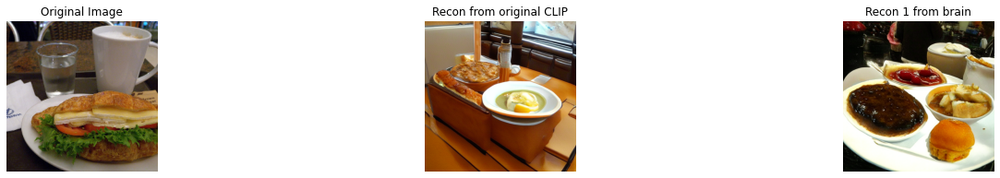

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Sheep grazing on field', 'url': 'https://cdn3.eyeem.com/thumb/590d3349529d5ccae20d72cee852a2e688082f49-1428074836/w/700', 'id': 464352990, 'similarity': 0.8636209964752197}, {'caption': 'Lambing Season', 'url': 'https://farm5.staticflickr.com/4046/4490495352_7f4bc36770_z.jpg', 'id': 4176865267, 'similarity': 0.8630124926567078}, {'caption': 'The animal, which is much more nimble on his feet than a typical lamb, and its mother', 'url': 'https://www.irishtimes.com/polopoly_fs/1.1749079.1396540267!/image/image.jpg_gen/derivatives/box_300_160/image.jpg', 'id': 1860567245, 'similarity': 0.8597869873046875}, {'caption': 'Sheep in Grasmere', 'url': 'https://images.squarespace-cdn.com/content/v1/596f9422f5e2311db0bdec3d/1505673692228-1293NRLXWBP5COG41TWX/ke17ZwdGBToddI8pDm48kFdjnJDBrqfDmvHUkalIVe5Zw-zPPgdn4jUwVcJE1ZvWEtT5uBSRWt4vQZAgTJucoTqqXjS3CfNDSuuf31e0tVE60xEeJ_ac2R5aHqbYM2uOwA1jx4wbCDhUkSsGDFpFQbuvPknf91-IP_XxpMjX9og/England+4.jpg', 'id': 1577318234, 'similarity': 0.8589770

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Evil sheep - photo#12', 'url': 'http://3.bp.blogspot.com/-X9zSDRNnztQ/T8yYUCEYZRI/AAAAAAAAAqM/rt28pTBC4Gk/s1600/evil+sheep.jpg', 'id': 5446866963, 'similarity': 0.8882210850715637}, {'caption': 'black headed: Black headed sheep', 'url': 'https://us.123rf.com/450wm/johnaapw/johnaapw1602/johnaapw160200004/52409541-black-headed-sheep.jpg?ver=6', 'id': 493605547, 'similarity': 0.8868560194969177}, {'caption': 'Bizarre-looking sheep with an upside-down head sparks debate (video). Keep your head on straight. http://oyea2.com', 'url': 'https://i.pinimg.com/236x/bf/d6/3f/bfd63f283f05dabe15e2cb7991285000.jpg', 'id': 3213810860, 'similarity': 0.8862180709838867}, {'caption': 'The animal, which is much more nimble on his feet than a typical lamb, and its mother', 'url': 'https://www.irishtimes.com/polopoly_fs/1.1749079.1396540267!/image/image.jpg_gen/derivatives/box_300_160/image.jpg', 'id': 1860567245, 'similarity': 0.8842490315437317}]
{'caption': 'Evil sheep - photo#12', 'url': '

  0%|          | 0/50 [00:00<?, ?it/s]

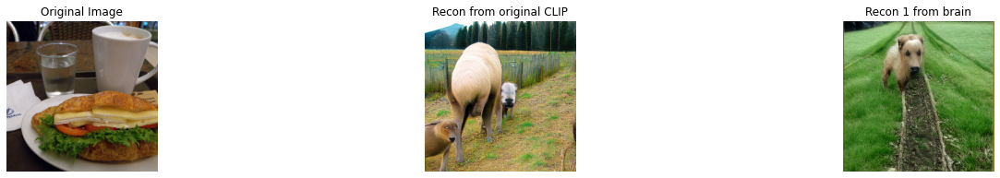

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Sheep grazing on field', 'url': 'https://cdn3.eyeem.com/thumb/590d3349529d5ccae20d72cee852a2e688082f49-1428074836/w/700', 'id': 464352990, 'similarity': 0.8636209964752197}, {'caption': 'Lambing Season', 'url': 'https://farm5.staticflickr.com/4046/4490495352_7f4bc36770_z.jpg', 'id': 4176865267, 'similarity': 0.8630124926567078}, {'caption': 'The animal, which is much more nimble on his feet than a typical lamb, and its mother', 'url': 'https://www.irishtimes.com/polopoly_fs/1.1749079.1396540267!/image/image.jpg_gen/derivatives/box_300_160/image.jpg', 'id': 1860567245, 'similarity': 0.8597869873046875}, {'caption': 'Sheep in Grasmere', 'url': 'https://images.squarespace-cdn.com/content/v1/596f9422f5e2311db0bdec3d/1505673692228-1293NRLXWBP5COG41TWX/ke17ZwdGBToddI8pDm48kFdjnJDBrqfDmvHUkalIVe5Zw-zPPgdn4jUwVcJE1ZvWEtT5uBSRWt4vQZAgTJucoTqqXjS3CfNDSuuf31e0tVE60xEeJ_ac2R5aHqbYM2uOwA1jx4wbCDhUkSsGDFpFQbuvPknf91-IP_XxpMjX9og/England+4.jpg', 'id': 1577318234, 'similarity': 0.8589770

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Sheep in Grasmere', 'url': 'https://images.squarespace-cdn.com/content/v1/596f9422f5e2311db0bdec3d/1505673692228-1293NRLXWBP5COG41TWX/ke17ZwdGBToddI8pDm48kFdjnJDBrqfDmvHUkalIVe5Zw-zPPgdn4jUwVcJE1ZvWEtT5uBSRWt4vQZAgTJucoTqqXjS3CfNDSuuf31e0tVE60xEeJ_ac2R5aHqbYM2uOwA1jx4wbCDhUkSsGDFpFQbuvPknf91-IP_XxpMjX9og/England+4.jpg', 'id': 1577318234, 'similarity': 0.8784490823745728}, {'caption': '仲良し子羊', 'url': 'https://i1.wp.com/img.pioneer-labo.jp/kitanomori/20120528_548042_t.jpg?resize=300%2C225&ssl=1', 'id': 5041035633, 'similarity': 0.8771054148674011}, {'caption': 'Lambies', 'url': 'https://farm3.staticflickr.com/2597/4449459909_d0f7eb69ed.jpg', 'id': 317681982, 'similarity': 0.8744608759880066}]
{'caption': 'Sheep in Grasmere', 'url': 'https://images.squarespace-cdn.com/content/v1/596f9422f5e2311db0bdec3d/1505673692228-1293NRLXWBP5COG41TWX/ke17ZwdGBToddI8pDm48kFdjnJDBrqfDmvHUkalIVe5Zw-zPPgdn4jUwVcJE1ZvWEtT5uBSRWt4vQZAgTJucoTqqXjS3CfNDSuuf31e0tVE60xEeJ_ac2R5aHqbYM2uOwA1jx4wbCDh

  0%|          | 0/50 [00:00<?, ?it/s]

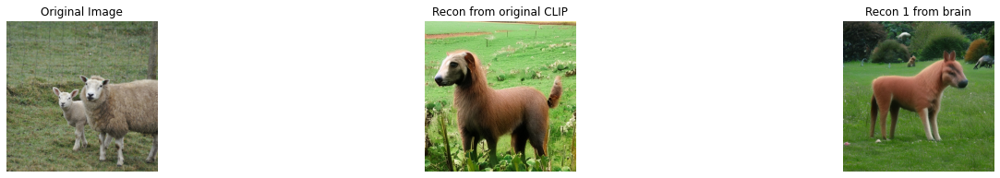

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Australian Wedge Tailed Eagle (gives you some ideas of the size of this bird).…', 'url': 'https://i.pinimg.com/736x/8c/30/e3/8c30e3c8c14ca22cea64b818e8f4f039.jpg', 'id': 2773611657, 'similarity': 0.8386815190315247}, {'caption': 'bird in flight', 'url': 'https://photos.smugmug.com/INTERNATIONAL-TRAVEL-PHOTOS/AUSTRALIA-AND-NEW-ZEALAND/Melbourne-Adelaide-Australia-9/i-zv2LrzC/2/441f4a6d/L/mel-adel%201%20%28127%29-L.jpg', 'id': 3438835659, 'similarity': 0.8364248275756836}, {'caption': 'healesville bird show', 'url': 'https://res.klook.com/images/fl_lossy.progressive,q_65/c_fill,w_1295,h_720,f_auto/w_80,x_15,y_15,g_south_west,l_klook_water/activities/ltxum4nkkmoquu9rlk6s/HealesvilleSanctuaryTicket.jpg', 'id': 4904221322, 'similarity': 0.8342157006263733}]
{'caption': 'Australian Wedge Tailed Eagle (gives you some ideas of the size of this bird).…', 'url': 'https://i.pinimg.com/736x/8c/30/e3/8c30e3c8c14ca22cea64b818e8f4f039.jpg', 'id': 2773611657, 'similarity': 0.838681519031

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'В дни осенних каникул для столичных школьников проведут 14 бесплатных экскурсий', 'url': 'https://www.mos.ru/upload/newsfeed/newsfeed/01(22192).JPG', 'id': 3802314657, 'similarity': 0.7899937033653259}, {'caption': 'Pia Cormier, 3, of Peabody giggles as she spins on a swing ride during the Danvers Family Festival before the annual fireworks Sunday evening. The festival included a dj, food, rides, games and bouncy houses. Photo by Deborah Parker/July 5, 2009.', 'url': 'https://photos.smugmug.com/The-Salem-News-Newspaper-/ARCHIVE/20102013/Photos-by-Deborah-Parker-1/i-S9gKRvG/0/a3867a7c/M/090705_SN_DPA_FESTIVAL_1-M.jpg', 'id': 1596077901, 'similarity': 0.7853974103927612}, {'caption': 'Enjoy the Ride ~ Maisie 2009', 'url': 'https://aminus3.s3.amazonaws.com/image/g0009/u00008624/i00689282/7ceb914fcc567f586138b93c49ebb68b_large.jpg', 'id': 2727398184, 'similarity': 0.7849050760269165}, {'caption': 'Circus Arts Brisbane children juggling', 'url': 'https://redballoon.com.au/dw/i

Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connection.py", line 175, in _new_conn
    (self._dns_host, self.port), self.timeout, **extra_kw
  File "/opt/conda/lib/python3.7/site-packages/urllib3/util/connection.py", line 95, in create_connection
    raise err
  File "/opt/conda/lib/python3.7/site-packages/urllib3/util/connection.py", line 85, in create_connection
    sock.connect(sa)
TimeoutError: [Errno 110] Connection timed out

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 710, in urlopen
    chunked=chunked,
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 386, in _make_request
    self._validate_conn(conn)
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 1042, in _validate_conn
    conn.connect()
  File "/opt/conda/lib/python3.7/site-pack

{'caption': 'Pia Cormier, 3, of Peabody giggles as she spins on a swing ride during the Danvers Family Festival before the annual fireworks Sunday evening. The festival included a dj, food, rides, games and bouncy houses. Photo by Deborah Parker/July 5, 2009.', 'url': 'https://photos.smugmug.com/The-Salem-News-Newspaper-/ARCHIVE/20102013/Photos-by-Deborah-Parker-1/i-S9gKRvG/0/a3867a7c/M/090705_SN_DPA_FESTIVAL_1-M.jpg', 'id': 1596077901, 'similarity': 0.7853974103927612}
{'caption': 'Enjoy the Ride ~ Maisie 2009', 'url': 'https://aminus3.s3.amazonaws.com/image/g0009/u00008624/i00689282/7ceb914fcc567f586138b93c49ebb68b_large.jpg', 'id': 2727398184, 'similarity': 0.7849050760269165}
{'caption': 'Circus Arts Brisbane children juggling', 'url': 'https://redballoon.com.au/dw/image/v2/BCRD_PRD/on/demandware.static/-/Sites-rb-au-catalog/default/images/products/CBS004-M/zf0z6h7gzkqg9xxdk5fw.jpg?sw=1160&amp;sh=637&amp;q=70', 'id': 643596258, 'similarity': 0.7847772836685181}
[None, <PIL.Image.Im

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb7010f4170>


  0%|          | 0/50 [00:00<?, ?it/s]

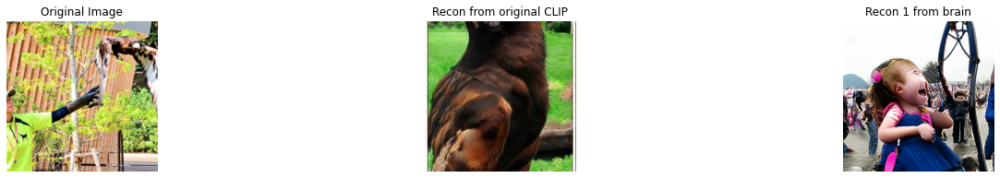

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Male shar pei 3 months old loving dog great with kids', 'url': 'https://images.greatbritainlisted.com/nssmall/shar_pei_10027742.jpg', 'id': 3164309528, 'similarity': 0.8007874488830566}, {'caption': 'Two pug dogs video', 'url': 'http://media.istockphoto.com/videos/two-pug-dogs-video-id92386574?s=192x192', 'id': 3130966966, 'similarity': 0.7914755344390869}, {'caption': 'Pug Barks at Pug Pillow! - Video', 'url': 'https://i.rmbl.ws/z1/R/U/P/e/a.49bb.jpg', 'id': 4938347502, 'similarity': 0.7898397445678711}]
{'caption': 'Male shar pei 3 months old loving dog great with kids', 'url': 'https://images.greatbritainlisted.com/nssmall/shar_pei_10027742.jpg', 'id': 3164309528, 'similarity': 0.8007874488830566}
{'caption': 'Two pug dogs video', 'url': 'http://media.istockphoto.com/videos/two-pug-dogs-video-id92386574?s=192x192', 'id': 3130966966, 'similarity': 0.7914755344390869}
{'caption': 'Pug Barks at Pug Pillow! - Video', 'url': 'https://i.rmbl.ws/z1/R/U/P/e/a.49bb.jpg', 'id': 

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700d14d70>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Lost dog on 08 Dec 2012 in Galway. MALE black Lab Cross with white on chest and paws, if anyone has seen him please text or call 0834146400', 'url': 'http://photos.lostdogs.ie/lost-dog-on-08-dec-2012-in-galway-.jpg', 'id': 2128995021, 'similarity': 0.7429482936859131}, {'caption': 'Fernseherhund.', 'url': 'https://weblog.hundeiker.de/media/1/20110220-bruno-sieht-fern.jpg', 'id': 5457567503, 'similarity': 0.7378591895103455}, {'caption': 'Mi perro loco', 'url': 'https://i.rmbl.ws/s8/1/z/u/j/i/zujib.0kob-small-Mi-perro-loco.jpg', 'id': 4889014770, 'similarity': 0.7349865436553955}, {'caption': 'Celimene, chien Bulldog', 'url': 'https://static.wamiz.com/images/animals/medium/celimene.jpg', 'id': 498275964, 'similarity': 0.7310597896575928}]
{'caption': 'Lost dog on 08 Dec 2012 in Galway. MALE black Lab Cross with white on chest and paws, if anyone has seen him please text or call 0834146400', 'url': 'http://photos.lostdogs.ie/lost-dog-on-08-dec-2012-in-galway-.jpg', 'id': 21

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700bfab30>


{'caption': 'Celimene, chien Bulldog', 'url': 'https://static.wamiz.com/images/animals/medium/celimene.jpg', 'id': 498275964, 'similarity': 0.7310597896575928}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700DF65D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700EF9310>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700B3DA90>]


  0%|          | 0/50 [00:00<?, ?it/s]

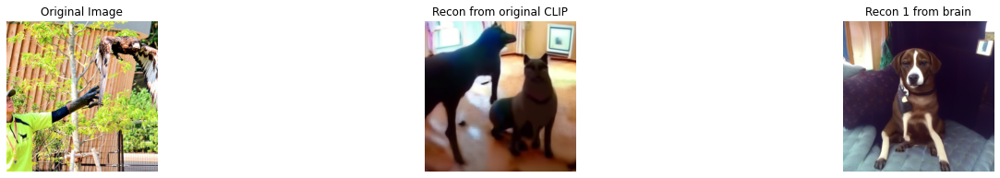

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Male shar pei 3 months old loving dog great with kids', 'url': 'https://images.greatbritainlisted.com/nssmall/shar_pei_10027742.jpg', 'id': 3164309528, 'similarity': 0.8007874488830566}, {'caption': 'Two pug dogs video', 'url': 'http://media.istockphoto.com/videos/two-pug-dogs-video-id92386574?s=192x192', 'id': 3130966966, 'similarity': 0.7914755344390869}, {'caption': 'Pug Barks at Pug Pillow! - Video', 'url': 'https://i.rmbl.ws/z1/R/U/P/e/a.49bb.jpg', 'id': 4938347502, 'similarity': 0.7898397445678711}]
{'caption': 'Male shar pei 3 months old loving dog great with kids', 'url': 'https://images.greatbritainlisted.com/nssmall/shar_pei_10027742.jpg', 'id': 3164309528, 'similarity': 0.8007874488830566}
{'caption': 'Two pug dogs video', 'url': 'http://media.istockphoto.com/videos/two-pug-dogs-video-id92386574?s=192x192', 'id': 3130966966, 'similarity': 0.7914755344390869}
{'caption': 'Pug Barks at Pug Pillow! - Video', 'url': 'https://i.rmbl.ws/z1/R/U/P/e/a.49bb.jpg', 'id': 

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be7a13b0>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Коте срещу Dvd', 'url': 'https://i49.vbox7.com/i/ebe/ebee6d03586.jpg', 'id': 3718372201, 'similarity': 0.7686792612075806}, {'caption': 'Chibi: Watching TV by IceCatDemon', 'url': 'http://t11.deviantart.net/PKlevdleW5OrrG16cfjUoPHkZYk=/300x200/filters:fixed_height(100,100):origin()/pre12/b6ec/th/pre/f/2009/066/6/a/chibi__watching_tv_by_icecatdemon.png', 'id': 800156343, 'similarity': 0.7663291692733765}, {'caption': 'birdie investigating the new living room cat platform', 'url': 'https://ninedarkmoons.com/wp-content/uploads/2014/11/87j-300x169.jpg', 'id': 395866425, 'similarity': 0.76613450050354}]
{'caption': 'Коте срещу Dvd', 'url': 'https://i49.vbox7.com/i/ebe/ebee6d03586.jpg', 'id': 3718372201, 'similarity': 0.7686792612075806}
{'caption': 'Chibi: Watching TV by IceCatDemon', 'url': 'http://t11.deviantart.net/PKlevdleW5OrrG16cfjUoPHkZYk=/300x200/filters:fixed_height(100,100):origin()/pre12/b6ec/th/pre/f/2009/066/6/a/chibi__watching_tv_by_icecatdemon.png', 'id': 800156

  0%|          | 0/50 [00:00<?, ?it/s]

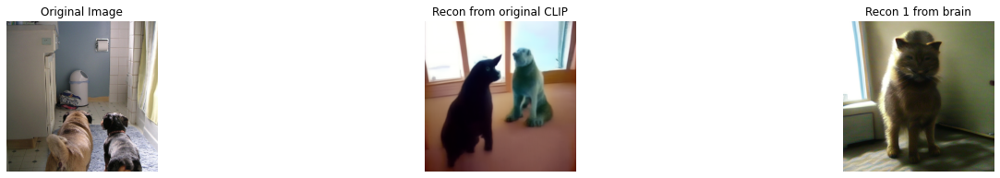

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': '. West Bloomfield hosted Birmingham Seaholm for an Oakland Activities Association White Division baseball doubleheader on Monday, April 30, 2018. (Photo gallery by Dan Fenner/The Oakland Press)', 'url': 'https://photos.smugmug.com/OP-Birmingham-Seaholm-at-West-Bloomfield-baseball/i-pKK2SJF/1/83d0363c/XL/DSC_0064-XL.jpg', 'id': 2148964139, 'similarity': 0.8676645755767822}, {'caption': ". La Salle\\'s George Medina catches a foul pop-up by Bishop Amat\\'s Christian Moya (not pictured) in the second inning of prep baseball game at Bishop Amat High School in La Puente, Calif., on Tuesday, May 6, 2014. (Keith Birmingham Pasadena Star-News)", 'url': 'https://photos.smugmug.com/photos/i-7bPNnmS/0/XL/i-7bPNnmS-XL.jpg', 'id': 1400622306, 'similarity': 0.8656853437423706}, {'caption': 'VFW Baseball vs Dassel-Cokato', 'url': 'https://photos.smugmug.com/Sports/2017-Baseball/2017-Litchfield-VFW/2017-07-08-VFW-BB/i-T58mQ5z/1/487a157d/S/20170708_VFW_BB-268-S.jpg', 'id': 435165343, 'sim

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700cc59b0>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Youth Baseball 25', 'url': 'https://i1.wp.com/theflashtoday.com/wp-content/uploads/2017/06/Youth-Baseball-25.jpg?w=331&', 'id': 906013501, 'similarity': 0.8900407552719116}, {'caption': 'baseball', 'url': 'https://kssunews.files.wordpress.com/2015/02/baseball.jpg?w=610&', 'id': 595222489, 'similarity': 0.8893161416053772}, {'caption': 'Diamond Devils Baseball - Charleston Labor Day weekend', 'url': 'https://photos.smugmug.com/Sports/Baseball/Diamond-Devils-Baseball-1/Labor-Day-Charleston/i-86ZrQfb/10/5c8cfe40/M/Diamond-Devils-baseball%20%206347-M.jpg', 'id': 963196819, 'similarity': 0.8841285705566406}, {'caption': 'baseball-com13-313462', 'url': 'https://livedoor.blogimg.jp/baseballcom_-baseballcoach/imgs/f/0/f0c1c7d9.jpg', 'id': 1144970474, 'similarity': 0.8828768134117126}]
{'caption': 'Youth Baseball 25', 'url': 'https://i1.wp.com/theflashtoday.com/wp-content/uploads/2017/06/Youth-Baseball-25.jpg?w=331&', 'id': 906013501, 'similarity': 0.8900407552719116}
{'caption': 

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700cd8cb0>


{'caption': 'baseball-com13-313462', 'url': 'https://livedoor.blogimg.jp/baseballcom_-baseballcoach/imgs/f/0/f0c1c7d9.jpg', 'id': 1144970474, 'similarity': 0.8828768134117126}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700CA2ED0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D6CF90>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700F17090>]


  0%|          | 0/50 [00:00<?, ?it/s]

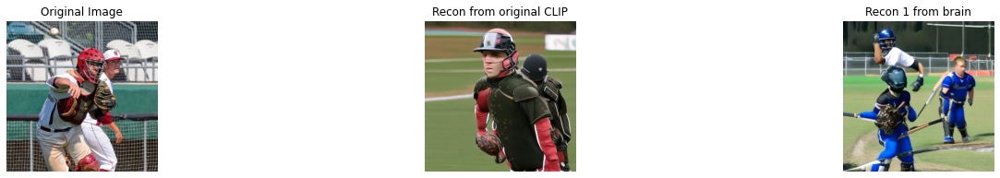

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Деревни и села Судиславского района оказались в снежном плену - Судиславль СМИ', 'url': 'https://sudislavl.bezformata.com/content/image291090041.jpg', 'id': 5251646986, 'similarity': 0.8235605955123901}, {'caption': 'An Image in Orbit 6.jpg', 'url': 'https://images.squarespace-cdn.com/content/v1/55fb7192e4b08422c88271be/1444398980019-9GSAUAH1COKQOD5XFXBJ/ke17ZwdGBToddI8pDm48kDklAnNxAYZezy8yHGwdyPRZw-zPPgdn4jUwVcJE1ZvWQUxwkmyExglNqGp0IvTJZUJFbgE-7XRK3dMEBRBhUpzHvRNn0vA4xvskbRuUDgU9p-_tICog5fY9t0pjzgjjuCDO7fh__Nt1pdRTcMpE9fs/An+Image+in+Orbit+6.jpg', 'id': 811175537, 'similarity': 0.8201250433921814}, {'caption': 'Von der Talstation 4er-Sesselbahn in Richtung Skigebiet!', 'url': 'https://media.skigebiete-test.de/images/ecu/content/c_blogarticle/testbericht-oberaudorf-hocheck-zur-kategorie-koenner_n168221-55589-1_span.jpg', 'id': 3812064670, 'similarity': 0.818314254283905}, {'caption': 'В поселке Ворожейкино Рассказовского района пропали все дорожные знаки - OnlineTambov.Ru

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be53add0>


{'caption': 'Von der Talstation 4er-Sesselbahn in Richtung Skigebiet!', 'url': 'https://media.skigebiete-test.de/images/ecu/content/c_blogarticle/testbericht-oberaudorf-hocheck-zur-kategorie-koenner_n168221-55589-1_span.jpg', 'id': 3812064670, 'similarity': 0.818314254283905}
{'caption': 'В поселке Ворожейкино Рассказовского района пропали все дорожные знаки - OnlineTambov.Ru', 'url': 'https://tambov.bezformata.com/content/image226908803.jpg', 'id': 4138454443, 'similarity': 0.8179705142974854}
[None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700F35450>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D50810>, None]


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700bfab30>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Interview: Chris Haffey about his Vibralux Part - Be-Mag', 'url': 'https://www.be-mag.com/wp-content/uploads/2015/01/haffey_vod_5.png', 'id': 1717202550, 'similarity': 0.859548807144165}, {'caption': 'POV shot of a skateboarder riding through a Brooklyn Skatepark - 4k', 'url': 'https://media.gettyimages.com/videos/shot-of-a-skateboarder-riding-through-a-brooklyn-skatepark-4k-video-id681176554?s=640x640', 'id': 28260930, 'similarity': 0.8533986210823059}, {'caption': 'Make Snowboarding great again!', 'url': 'https://prime-snowboarding.de/wp-content/uploads/2019/10/maxresdefault-16.jpg', 'id': 261309986, 'similarity': 0.852518618106842}, {'caption': '晴れた日の屋外の階段をジャンプ男性のスケートボーダー - スケートボードをする点の映像素材/bロール', 'url': 'https://media.istockphoto.com/videos/male-skateboarder-jumping-down-the-stairs-outdoor-in-sunny-day-video-id947119724?s=640x640', 'id': 5366730671, 'similarity': 0.852182149887085}]
{'caption': 'Interview: Chris Haffey about his Vibralux Part - Be-Mag', 'url': 'https:

  0%|          | 0/50 [00:00<?, ?it/s]

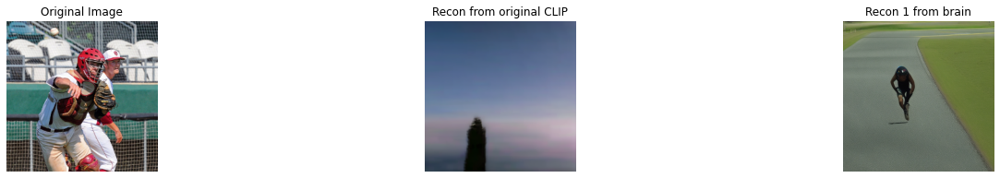

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Деревни и села Судиславского района оказались в снежном плену - Судиславль СМИ', 'url': 'https://sudislavl.bezformata.com/content/image291090041.jpg', 'id': 5251646986, 'similarity': 0.8235605955123901}, {'caption': 'An Image in Orbit 6.jpg', 'url': 'https://images.squarespace-cdn.com/content/v1/55fb7192e4b08422c88271be/1444398980019-9GSAUAH1COKQOD5XFXBJ/ke17ZwdGBToddI8pDm48kDklAnNxAYZezy8yHGwdyPRZw-zPPgdn4jUwVcJE1ZvWQUxwkmyExglNqGp0IvTJZUJFbgE-7XRK3dMEBRBhUpzHvRNn0vA4xvskbRuUDgU9p-_tICog5fY9t0pjzgjjuCDO7fh__Nt1pdRTcMpE9fs/An+Image+in+Orbit+6.jpg', 'id': 811175537, 'similarity': 0.8201250433921814}, {'caption': 'Von der Talstation 4er-Sesselbahn in Richtung Skigebiet!', 'url': 'https://media.skigebiete-test.de/images/ecu/content/c_blogarticle/testbericht-oberaudorf-hocheck-zur-kategorie-koenner_n168221-55589-1_span.jpg', 'id': 3812064670, 'similarity': 0.818314254283905}, {'caption': 'В поселке Ворожейкино Рассказовского района пропали все дорожные знаки - OnlineTambov.Ru

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be4f2830>


{'caption': 'Von der Talstation 4er-Sesselbahn in Richtung Skigebiet!', 'url': 'https://media.skigebiete-test.de/images/ecu/content/c_blogarticle/testbericht-oberaudorf-hocheck-zur-kategorie-koenner_n168221-55589-1_span.jpg', 'id': 3812064670, 'similarity': 0.818314254283905}
{'caption': 'В поселке Ворожейкино Рассказовского района пропали все дорожные знаки - OnlineTambov.Ru', 'url': 'https://tambov.bezformata.com/content/image226908803.jpg', 'id': 4138454443, 'similarity': 0.8179705142974854}
[None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D98D50>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB6EC710190>, None]


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be4f2fb0>


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Biosphère in Montréal, Canada', 'url': 'https://1.bp.blogspot.com/-mzWXY4eGGW8/WNXDBOwX9YI/AAAAAAAAPCw/hOhpEPyt850RPoFgjRmadGIrkDjG8Ky6QCLcB/s640/unnamed.jpg', 'id': 3645027426, 'similarity': 0.8523277640342712}, {'caption': 'Benches in snow', 'url': 'https://drx.typepad.com/.a/6a00d83451bdba69e201a73d6b3855970d-450wi', 'id': 3062201614, 'similarity': 0.8379822969436646}, {'caption': 'Улицы Воронежа частично освободят от платных парковок - Bloknot-Voronezh.Ru', 'url': 'https://voronej.bezformata.com/content/image343266736.jpg', 'id': 4069382158, 'similarity': 0.8304699659347534}]
{'caption': 'Biosphère in Montréal, Canada', 'url': 'https://1.bp.blogspot.com/-mzWXY4eGGW8/WNXDBOwX9YI/AAAAAAAAPCw/hOhpEPyt850RPoFgjRmadGIrkDjG8Ky6QCLcB/s640/unnamed.jpg', 'id': 3645027426, 'similarity': 0.8523277640342712}
{'caption': 'Benches in snow', 'url': 'https://drx.typepad.com/.a/6a00d83451bdba69e201a73d6b3855970d-450wi', 'id': 3062201614, 'similarity': 0.8379822969436646}
{'caption': '

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700b07770>


  0%|          | 0/50 [00:00<?, ?it/s]

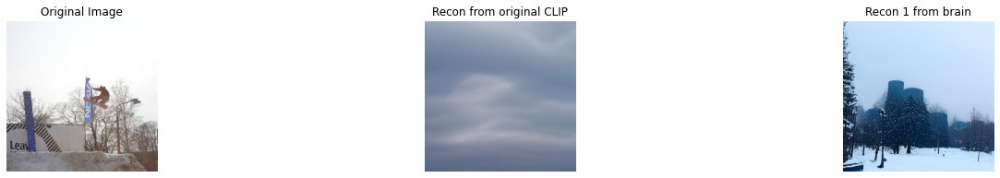

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Tàu siêu tốc Shinkansen – Niềm hy vọng của toàn dân Nhật sau chiến tranh thế giới thứ 2', 'url': 'http://media.tinnuocnhat.com/thumb_x260x166/files/2019/04/24/tau-sieu-toc-shinkansen--niem-hy-vong-cua-toan-dan-nhat-sau-chien-tranh-the-gioi-thu-22.jpg', 'id': 5304128476, 'similarity': 0.8477718830108643}, {'caption': 'The train leaves on the way to the railroad. Stok Video', 'url': 'https://vidcdn.123rf.com/450nwm/nebava/nebava1710/nebava171000025.jpg', 'id': 1551512365, 'similarity': 0.8362083435058594}, {'caption': 'Trein Stock Foto', 'url': 'https://thumbs.dreamstime.com/t/trein-14204250.jpg', 'id': 5321778351, 'similarity': 0.8302321434020996}]
{'caption': 'Tàu siêu tốc Shinkansen – Niềm hy vọng của toàn dân Nhật sau chiến tranh thế giới thứ 2', 'url': 'http://media.tinnuocnhat.com/thumb_x260x166/files/2019/04/24/tau-sieu-toc-shinkansen--niem-hy-vong-cua-toan-dan-nhat-sau-chien-tranh-the-gioi-thu-22.jpg', 'id': 5304128476, 'similarity': 0.8477718830108643}


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700d301d0>


{'caption': 'The train leaves on the way to the railroad. Stok Video', 'url': 'https://vidcdn.123rf.com/450nwm/nebava/nebava1710/nebava171000025.jpg', 'id': 1551512365, 'similarity': 0.8362083435058594}
{'caption': 'Trein Stock Foto', 'url': 'https://thumbs.dreamstime.com/t/trein-14204250.jpg', 'id': 5321778351, 'similarity': 0.8302321434020996}
[None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700DAC9D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700C75690>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'HSB 99 5902 med Tog 8992. Brocken 13.09.2002.', 'url': 'http://www.oledinesen.dk/wp-content/gallery/harzer-schmalspurbahnen-hsb/dynamic/20020913_10.jpg-nggid0517688-ngg0dyn-300x200x100-00f0w010c011r110f110r010t010.jpg', 'id': 3442734163, 'similarity': 0.8555974364280701}, {'caption': 'Vol 9: 41283 ready to depart Wellow for Bath (Green Park), 3rd March 1966', 'url': 'http://www.michaelclemensrailways.co.uk/pictures/CNC09.jpg', 'id': 3318372706, 'similarity': 0.8549676537513733}, {'caption': '<I>Easy does it!</I>�75029 shunting stock at Pickering station on 4 October 2009.<br><br>[Colin Miller&nbsp;04/10/2009]', 'url': 'https://www.railscot.co.uk/__cache/thumbnails/28000/28274.jpg', 'id': 2275395434, 'similarity': 0.8519558310508728}, {'caption': '130830 - Sherringham 30/08/13', 'url': 'http://www.wnxx.com/images/plogger/plog-content/thumbs/august-2013/130830---sherringham-300813/small/34150-1744-sheringham-300813-s-hughes.jpg', 'id': 3475604395, 'similarity': 0.8496443629

  0%|          | 0/50 [00:00<?, ?it/s]

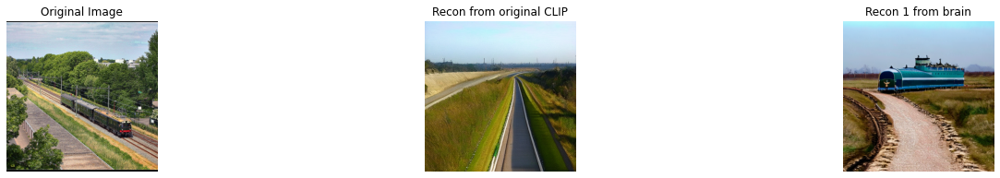

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Organic Banana', 'url': 'http://img1.exportersindia.com/product_images/bc-small/dir_137/4081828/organic-banana-1475126783-2413360.jpeg', 'id': 1169921157, 'similarity': 0.8733777403831482}, {'caption': 'Bunches of bananas for sale on market stall priced in imperial pounds and kilograms', 'url': 'https://m.psecn.photoshelter.com/img-get2/I0000V_Vs2j.In0I/fill=/fit=180x180/I0000V_Vs2j.In0I.jpg', 'id': 1404324890, 'similarity': 0.8731123208999634}]
{'caption': 'Organic Banana', 'url': 'http://img1.exportersindia.com/product_images/bc-small/dir_137/4081828/organic-banana-1475126783-2413360.jpeg', 'id': 1169921157, 'similarity': 0.8733777403831482}
{'caption': 'Bunches of bananas for sale on market stall priced in imperial pounds and kilograms', 'url': 'https://m.psecn.photoshelter.com/img-get2/I0000V_Vs2j.In0I/fill=/fit=180x180/I0000V_Vs2j.In0I.jpg', 'id': 1404324890, 'similarity': 0.8731123208999634}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700F17090>, <PIL.Imag

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'just-bananas', 'url': 'https://thewhyofit.files.wordpress.com/2013/07/just-bananas.jpg?w=676', 'id': 4409279752, 'similarity': 0.8565143346786499}, {'caption': 'preco-da-maca,-banana-e-melancia-sobe-forte-em-dezembro,-aponta-conab', 'url': 'https://brasil.perfil.com/wp-content/uploads/2021/01/32949-preco-da-maca-banana-e-melancia-sobe-forte-em-dezembro-aponta-conab-600x337.jpg', 'id': 3790621745, 'similarity': 0.842888593673706}]
{'caption': 'just-bananas', 'url': 'https://thewhyofit.files.wordpress.com/2013/07/just-bananas.jpg?w=676', 'id': 4409279752, 'similarity': 0.8565143346786499}
{'caption': 'preco-da-maca,-banana-e-melancia-sobe-forte-em-dezembro,-aponta-conab', 'url': 'https://brasil.perfil.com/wp-content/uploads/2021/01/32949-preco-da-maca-banana-e-melancia-sobe-forte-em-dezembro-aponta-conab-600x337.jpg', 'id': 3790621745, 'similarity': 0.842888593673706}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700FE5E50>, None]


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700c04ad0>


  0%|          | 0/50 [00:00<?, ?it/s]

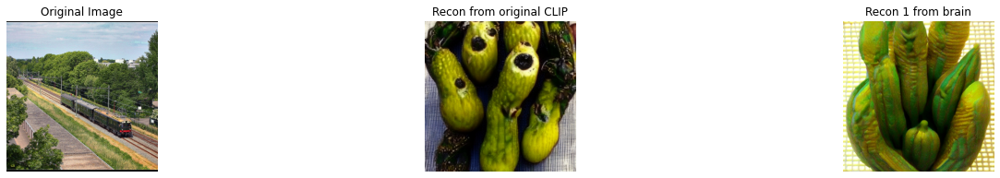

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Organic Banana', 'url': 'http://img1.exportersindia.com/product_images/bc-small/dir_137/4081828/organic-banana-1475126783-2413360.jpeg', 'id': 1169921157, 'similarity': 0.8733777403831482}, {'caption': 'Bunches of bananas for sale on market stall priced in imperial pounds and kilograms', 'url': 'https://m.psecn.photoshelter.com/img-get2/I0000V_Vs2j.In0I/fill=/fit=180x180/I0000V_Vs2j.In0I.jpg', 'id': 1404324890, 'similarity': 0.8731123208999634}]
{'caption': 'Organic Banana', 'url': 'http://img1.exportersindia.com/product_images/bc-small/dir_137/4081828/organic-banana-1475126783-2413360.jpeg', 'id': 1169921157, 'similarity': 0.8733777403831482}
{'caption': 'Bunches of bananas for sale on market stall priced in imperial pounds and kilograms', 'url': 'https://m.psecn.photoshelter.com/img-get2/I0000V_Vs2j.In0I/fill=/fit=180x180/I0000V_Vs2j.In0I.jpg', 'id': 1404324890, 'similarity': 0.8731123208999634}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700F88150>, <PIL.Imag

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'just-bananas', 'url': 'https://thewhyofit.files.wordpress.com/2013/07/just-bananas.jpg?w=676', 'id': 4409279752, 'similarity': 0.8819562196731567}, {'caption': 'preco-da-maca,-banana-e-melancia-sobe-forte-em-dezembro,-aponta-conab', 'url': 'https://brasil.perfil.com/wp-content/uploads/2021/01/32949-preco-da-maca-banana-e-melancia-sobe-forte-em-dezembro-aponta-conab-600x337.jpg', 'id': 3790621745, 'similarity': 0.8752413988113403}]
{'caption': 'just-bananas', 'url': 'https://thewhyofit.files.wordpress.com/2013/07/just-bananas.jpg?w=676', 'id': 4409279752, 'similarity': 0.8819562196731567}
{'caption': 'preco-da-maca,-banana-e-melancia-sobe-forte-em-dezembro,-aponta-conab', 'url': 'https://brasil.perfil.com/wp-content/uploads/2021/01/32949-preco-da-maca-banana-e-melancia-sobe-forte-em-dezembro-aponta-conab-600x337.jpg', 'id': 3790621745, 'similarity': 0.8752413988113403}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE558F50>, None]


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be78de90>


  0%|          | 0/50 [00:00<?, ?it/s]

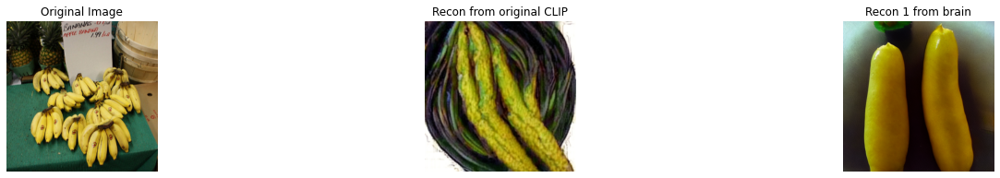

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'elephants', 'url': 'https://duryeaandwild.files.wordpress.com/2018/06/elephants.jpg?w=341&', 'id': 4543730128, 'similarity': 0.9290873408317566}, {'caption': 'Chobe National Park, Botswana 2013', 'url': 'http://a4.pbase.com/t9/60/645360/4/151286407.Q2FHjBrH.jpg', 'id': 1065581061, 'similarity': 0.9250033497810364}, {'caption': 'elefante', 'url': 'https://t2.ftcdn.net/jpg/00/60/36/81/240_F_60368106_Nr0wfVUZZ7L3kl6sVUhoSOil5NfxgjUu.jpg', 'id': 945777443, 'similarity': 0.9236786365509033}]
{'caption': 'elephants', 'url': 'https://duryeaandwild.files.wordpress.com/2018/06/elephants.jpg?w=341&', 'id': 4543730128, 'similarity': 0.9290873408317566}
{'caption': 'Chobe National Park, Botswana 2013', 'url': 'http://a4.pbase.com/t9/60/645360/4/151286407.Q2FHjBrH.jpg', 'id': 1065581061, 'similarity': 0.9250033497810364}
{'caption': 'elefante', 'url': 'https://t2.ftcdn.net/jpg/00/60/36/81/240_F_60368106_Nr0wfVUZZ7L3kl6sVUhoSOil5NfxgjUu.jpg', 'id': 945777443, 'similarity': 0.9236786365

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Elephants', 'url': 'https://farm4.staticflickr.com/3038/2936277632_55fc5ff5e4_m.jpg', 'id': 4989813171, 'similarity': 0.9313344359397888}, {'caption': 'Baby elephant walking, Tarangire National Park, Tanzania, East Africa', 'url': 'https://photos.smugmug.com/Animals/i-FWrVpkb/0/9ed1a3f0/M/Elephant%20baby--PE%20Tiringire%200995-M.jpg', 'id': 2692461910, 'similarity': 0.9277517199516296}]
{'caption': 'Elephants', 'url': 'https://farm4.staticflickr.com/3038/2936277632_55fc5ff5e4_m.jpg', 'id': 4989813171, 'similarity': 0.9313344359397888}
{'caption': 'Baby elephant walking, Tarangire National Park, Tanzania, East Africa', 'url': 'https://photos.smugmug.com/Animals/i-FWrVpkb/0/9ed1a3f0/M/Elephant%20baby--PE%20Tiringire%200995-M.jpg', 'id': 2692461910, 'similarity': 0.9277517199516296}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB7010D61D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE4EBF10>]


  0%|          | 0/50 [00:00<?, ?it/s]

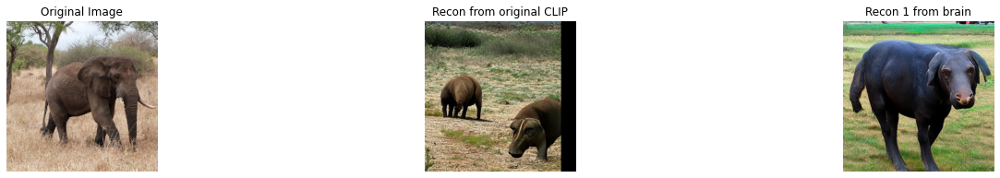

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Шоколадные конфеты из арахиса', 'url': 'https://dvoyni.ru/wp-content/uploads/2019/04/shokoladnye-konfety-iz-arahisa-s-medom-1024x576.jpg', 'id': 4035384625, 'similarity': 0.9056212902069092}, {'caption': 'Raspberry - Truffles by pandrina', 'url': 'http://t07.deviantart.net/Uu5RW_CNC2fkP3WPUQcm41OaLWM=/fit-in/150x150/filters:no_upscale():origin()/pre15/844a/th/pre/i/2015/102/4/7/raspberry___truffles_by_pandrina-d8peq4l.jpg', 'id': 683385295, 'similarity': 0.8949402570724487}, {'caption': "Rosie's peppermint truffles", 'url': 'https://www.rosemarymark.com/wp-content/uploads/2015/12/my-photo-of-ruffles-3-500x323.jpg', 'id': 561100844, 'similarity': 0.892103374004364}]
{'caption': 'Шоколадные конфеты из арахиса', 'url': 'https://dvoyni.ru/wp-content/uploads/2019/04/shokoladnye-konfety-iz-arahisa-s-medom-1024x576.jpg', 'id': 4035384625, 'similarity': 0.9056212902069092}
{'caption': 'Raspberry - Truffles by pandrina', 'url': 'http://t07.deviantart.net/Uu5RW_CNC2fkP3WPUQcm41OaLW

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Costco Chocolate Cake. I had to travel to the party place, so I ...', 'url': 'https://i.pinimg.com/originals/ca/9a/73/ca9a73dd8f0041b5f2c89304d08f9879.jpg', 'id': 2154289487, 'similarity': 0.8833540081977844}, {'caption': 'Malý patrový dortík', 'url': 'https://www.toprecepty.cz/fotky/recepty/0035/maly-patrovy-dortik-91210-270-160-exact.jpg', 'id': 5410314174, 'similarity': 0.8791320323944092}]
{'caption': 'Costco Chocolate Cake. I had to travel to the party place, so I ...', 'url': 'https://i.pinimg.com/originals/ca/9a/73/ca9a73dd8f0041b5f2c89304d08f9879.jpg', 'id': 2154289487, 'similarity': 0.8833540081977844}
{'caption': 'Malý patrový dortík', 'url': 'https://www.toprecepty.cz/fotky/recepty/0035/maly-patrovy-dortik-91210-270-160-exact.jpg', 'id': 5410314174, 'similarity': 0.8791320323944092}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE3D0A10>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE4EB110>]


  0%|          | 0/50 [00:00<?, ?it/s]

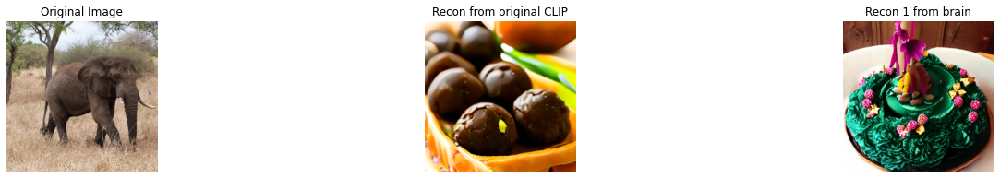

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Шоколадные конфеты из арахиса', 'url': 'https://dvoyni.ru/wp-content/uploads/2019/04/shokoladnye-konfety-iz-arahisa-s-medom-1024x576.jpg', 'id': 4035384625, 'similarity': 0.9056212902069092}, {'caption': 'Raspberry - Truffles by pandrina', 'url': 'http://t07.deviantart.net/Uu5RW_CNC2fkP3WPUQcm41OaLWM=/fit-in/150x150/filters:no_upscale():origin()/pre15/844a/th/pre/i/2015/102/4/7/raspberry___truffles_by_pandrina-d8peq4l.jpg', 'id': 683385295, 'similarity': 0.8949402570724487}, {'caption': "Rosie's peppermint truffles", 'url': 'https://www.rosemarymark.com/wp-content/uploads/2015/12/my-photo-of-ruffles-3-500x323.jpg', 'id': 561100844, 'similarity': 0.892103374004364}]
{'caption': 'Шоколадные конфеты из арахиса', 'url': 'https://dvoyni.ru/wp-content/uploads/2019/04/shokoladnye-konfety-iz-arahisa-s-medom-1024x576.jpg', 'id': 4035384625, 'similarity': 0.9056212902069092}
{'caption': 'Raspberry - Truffles by pandrina', 'url': 'http://t07.deviantart.net/Uu5RW_CNC2fkP3WPUQcm41OaLW

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'donuts', 'url': 'http://data.whicdn.com/images/70460838/superthumb.png', 'id': 3237898029, 'similarity': 0.9095700979232788}, {'caption': "amy's donuts, colorado springs", 'url': 'http://www.oinkety.com/wp-content/uploads/2014/08/amys_donuts.jpg', 'id': 5060072759, 'similarity': 0.8993604779243469}, {'caption': 'Doughnut', 'url': 'https://i0.wp.com/farm4.static.flickr.com/3112/2385509164_a27acc0df8.jpg', 'id': 3652316031, 'similarity': 0.8946775197982788}, {'caption': 'Donuts Donkin Donuts New York (Sabores De Una Vida)', 'url': 'https://i.pinimg.com/736x/92/7e/48/927e48563bdf232504ebcfaa21ba75d4.jpg', 'id': 4509058840, 'similarity': 0.894014835357666}]
{'caption': 'donuts', 'url': 'http://data.whicdn.com/images/70460838/superthumb.png', 'id': 3237898029, 'similarity': 0.9095700979232788}
{'caption': "amy's donuts, colorado springs", 'url': 'http://www.oinkety.com/wp-content/uploads/2014/08/amys_donuts.jpg', 'id': 5060072759, 'similarity': 0.8993604779243469}


Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be78d0b0>


{'caption': 'Doughnut', 'url': 'https://i0.wp.com/farm4.static.flickr.com/3112/2385509164_a27acc0df8.jpg', 'id': 3652316031, 'similarity': 0.8946775197982788}
{'caption': 'Donuts Donkin Donuts New York (Sabores De Una Vida)', 'url': 'https://i.pinimg.com/736x/92/7e/48/927e48563bdf232504ebcfaa21ba75d4.jpg', 'id': 4509058840, 'similarity': 0.894014835357666}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE70DA50>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE79CA10>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE64E8D0>]


  0%|          | 0/50 [00:00<?, ?it/s]

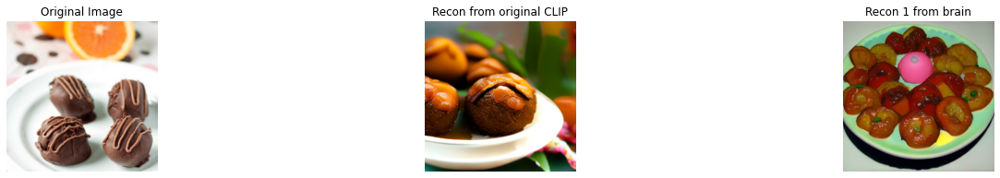

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'amador webcams', 'url': 'http://img.zluj.com/tmb/46/22/3109007/240x180-9.jpg', 'id': 3721404741, 'similarity': 0.849381685256958}, {'caption': 'discotopia userpic', 'url': 'https://l-userpic.livejournal.com/29911642/7119741', 'id': 898472213, 'similarity': 0.8459380269050598}, {'caption': 'colorful by BLACK-SAYURI', 'url': 'http://t07.deviantart.net/F44cEH6sJ0bTITOj12qaVRYzqkI=/300x200/filters:fixed_height(100,100):origin()/pre03/c1df/th/pre/i/2012/149/6/1/colorful_by_black_sayuri-d51i9fi.jpg', 'id': 289431131, 'similarity': 0.8436567783355713}, {'caption': 'Maria Elsa Matoso Fonseca', 'url': 'http://storage.ning.com/topology/rest/1.0/file/get/2197486487?profile=RESIZE_180x180&width=48&height=48&crop=1%3A1', 'id': 4697036088, 'similarity': 0.8415713310241699}]
{'caption': 'amador webcams', 'url': 'http://img.zluj.com/tmb/46/22/3109007/240x180-9.jpg', 'id': 3721404741, 'similarity': 0.849381685256958}
{'caption': 'discotopia userpic', 'url': 'https://l-userpic.livejournal.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'webcam-toy-photo1497 by Violapressley', 'url': 'https://stored-edge.slickpic.com/MTAwMTI2OTg3ZjhkNzY,/20140602/ODIyNzMyOTc4ZDc,/p/600/webcam-toy-photo1497.jpg', 'id': 357793897, 'similarity': 0.8494614362716675}, {'caption': 'বহু পুরুষের এক নারির বেঙ্গলি সেক্স ভিডিও এইচডি', 'url': 'https://hardpornxxx.com/media/thumbs/5/v06615.jpg?1620617473', 'id': 4678171781, 'similarity': 0.8480979800224304}, {'caption': "klove's avatar", 'url': 'https://i1.sndcdn.com/avatars-000001362874-ker2ei-t500x500.jpg', 'id': 1043744551, 'similarity': 0.8456063270568848}]
{'caption': 'webcam-toy-photo1497 by Violapressley', 'url': 'https://stored-edge.slickpic.com/MTAwMTI2OTg3ZjhkNzY,/20140602/ODIyNzMyOTc4ZDc,/p/600/webcam-toy-photo1497.jpg', 'id': 357793897, 'similarity': 0.8494614362716675}
{'caption': 'বহু পুরুষের এক নারির বেঙ্গলি সেক্স ভিডিও এইচডি', 'url': 'https://hardpornxxx.com/media/thumbs/5/v06615.jpg?1620617473', 'id': 4678171781, 'similarity': 0.8480979800224304}
{'caption': "klove's 

  0%|          | 0/50 [00:00<?, ?it/s]

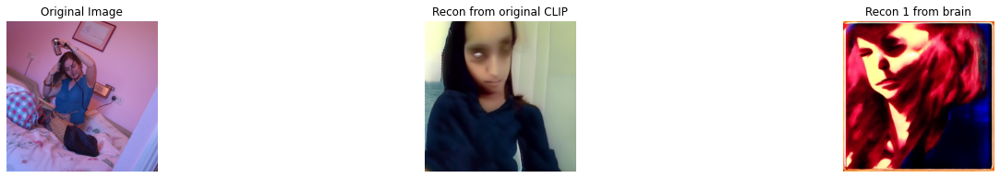

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Blurred video of Downtown Wellington City waterfront view in the capital of New Zealand; Slow motion', 'url': 'https://as2.ftcdn.net/jpg/03/21/32/11/110_F_321321123_LDPjVVFQrEw5OAHS2VrFAeJceu6881tJ.jpg', 'id': 2240464203, 'similarity': 0.8045415878295898}, {'caption': 'Photo of Church S.S. Peter And Paul Catholic Church at 36 N Ellsworth St, Naperville, IL 60540, United States', 'url': 'https://irs0.4sqi.net/img/general/400x220/967392_t_Q8uLig7Bi9A4HqMxiecevGdMLuEQjWIc9wUCWwN6g.jpg', 'id': 1861899396, 'similarity': 0.802937388420105}, {'caption': 'Modern city', 'url': 'http://media.gettyimages.com/videos/modern-city-video-id505400437?s=192x192', 'id': 23794043, 'similarity': 0.7964685559272766}, {'caption': 'Denver1.jpg', 'url': 'https://images.squarespace-cdn.com/content/v1/56cba1d67da24f43e1dd687d/1512411550756-O959JFCIGK9URWNBHX4D/ke17ZwdGBToddI8pDm48kL5yr4QPd68wHVTOmYC9kkEUqsxRUqqbr1mOJYKfIPR7LoDQ9mXPOjoJoqy81S2I8N_N4V1vUb5AoIIIbLZhVYxCRW4BPu10St3TBAUQYVKcN-HN3YuOjF8G

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Clock tower, Central Railway Station, Sydney', 'url': 'https://i2.wp.com/live.staticflickr.com/1494/24005331189_caf3d2fa81_z.jpg?resize=360%2C640&ssl=1', 'id': 832221204, 'similarity': 0.8386815786361694}, {'caption': 'the clock by romeogigli', 'url': 'https://ih0.redbubble.net/image.4113584.8524/flat,1000x1000,075,f.jpg', 'id': 436894377, 'similarity': 0.8326886892318726}, {'caption': '2010 Sydney Australia', 'url': 'https://urixblog.com/p/2011/aus02/picture-92.jpg', 'id': 848560467, 'similarity': 0.831600546836853}]
{'caption': 'Clock tower, Central Railway Station, Sydney', 'url': 'https://i2.wp.com/live.staticflickr.com/1494/24005331189_caf3d2fa81_z.jpg?resize=360%2C640&ssl=1', 'id': 832221204, 'similarity': 0.8386815786361694}
{'caption': 'the clock by romeogigli', 'url': 'https://ih0.redbubble.net/image.4113584.8524/flat,1000x1000,075,f.jpg', 'id': 436894377, 'similarity': 0.8326886892318726}
{'caption': '2010 Sydney Australia', 'url': 'https://urixblog.com/p/2011/a

  0%|          | 0/50 [00:00<?, ?it/s]

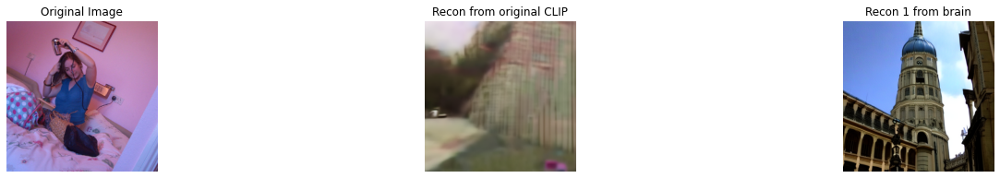

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Blurred video of Downtown Wellington City waterfront view in the capital of New Zealand; Slow motion', 'url': 'https://as2.ftcdn.net/jpg/03/21/32/11/110_F_321321123_LDPjVVFQrEw5OAHS2VrFAeJceu6881tJ.jpg', 'id': 2240464203, 'similarity': 0.8045415878295898}, {'caption': 'Photo of Church S.S. Peter And Paul Catholic Church at 36 N Ellsworth St, Naperville, IL 60540, United States', 'url': 'https://irs0.4sqi.net/img/general/400x220/967392_t_Q8uLig7Bi9A4HqMxiecevGdMLuEQjWIc9wUCWwN6g.jpg', 'id': 1861899396, 'similarity': 0.802937388420105}, {'caption': 'Modern city', 'url': 'http://media.gettyimages.com/videos/modern-city-video-id505400437?s=192x192', 'id': 23794043, 'similarity': 0.7964685559272766}, {'caption': 'Denver1.jpg', 'url': 'https://images.squarespace-cdn.com/content/v1/56cba1d67da24f43e1dd687d/1512411550756-O959JFCIGK9URWNBHX4D/ke17ZwdGBToddI8pDm48kL5yr4QPd68wHVTOmYC9kkEUqsxRUqqbr1mOJYKfIPR7LoDQ9mXPOjoJoqy81S2I8N_N4V1vUb5AoIIIbLZhVYxCRW4BPu10St3TBAUQYVKcN-HN3YuOjF8G

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': '和光百貨有名的大鐘', 'url': 'http://pic.pimg.tw/minniefc/1165029694.jpg', 'id': 3405427862, 'similarity': 0.8179291486740112}, {'caption': 'Clock tower, Central Railway Station, Sydney', 'url': 'https://i2.wp.com/live.staticflickr.com/1494/24005331189_caf3d2fa81_z.jpg?resize=360%2C640&ssl=1', 'id': 832221204, 'similarity': 0.8146340847015381}, {'caption': '2010 Sydney Australia', 'url': 'https://urixblog.com/p/2011/aus02/picture-92.jpg', 'id': 848560467, 'similarity': 0.808088481426239}]
{'caption': '和光百貨有名的大鐘', 'url': 'http://pic.pimg.tw/minniefc/1165029694.jpg', 'id': 3405427862, 'similarity': 0.8179291486740112}
{'caption': 'Clock tower, Central Railway Station, Sydney', 'url': 'https://i2.wp.com/live.staticflickr.com/1494/24005331189_caf3d2fa81_z.jpg?resize=360%2C640&ssl=1', 'id': 832221204, 'similarity': 0.8146340847015381}
{'caption': '2010 Sydney Australia', 'url': 'https://urixblog.com/p/2011/aus02/picture-92.jpg', 'id': 848560467, 'similarity': 0.808088481426239}
[<PIL.Im

  0%|          | 0/50 [00:00<?, ?it/s]

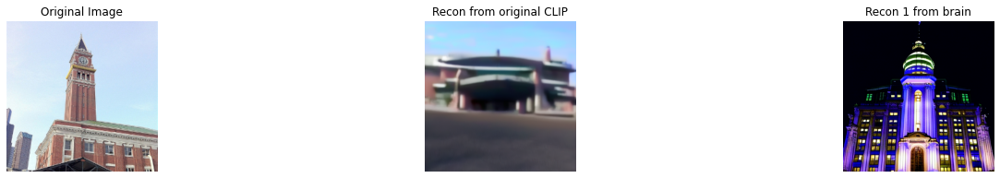

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Fishing boats moored in Kefalos, Kos ISland, Greece. Stock Footage', 'url': 'https://d3thflcq1yqzn0.cloudfront.net/026639862_iconm.jpeg', 'id': 5220912380, 'similarity': 0.855580747127533}, {'caption': 'Boats at Kudat Harbour.JPG', 'url': 'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ee/Boats_at_Kudat_Harbour.JPG/275px-Boats_at_Kudat_Harbour.JPG', 'id': 2990047760, 'similarity': 0.8531662225723267}, {'caption': 'Fishing boats in Kefalos showing mooring ropes Stock Footage', 'url': 'https://d1hw6n3yxknhky.cloudfront.net/026636995_iconm.jpeg', 'id': 1657952305, 'similarity': 0.8524879217147827}]
{'caption': 'Fishing boats moored in Kefalos, Kos ISland, Greece. Stock Footage', 'url': 'https://d3thflcq1yqzn0.cloudfront.net/026639862_iconm.jpeg', 'id': 5220912380, 'similarity': 0.855580747127533}
{'caption': 'Boats at Kudat Harbour.JPG', 'url': 'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ee/Boats_at_Kudat_Harbour.JPG/275px-Boats_at_Kudat_Harbour.JPG', 'id

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb700fe9830>


{'caption': 'Fishing boats in Kefalos showing mooring ropes Stock Footage', 'url': 'https://d1hw6n3yxknhky.cloudfront.net/026636995_iconm.jpeg', 'id': 1657952305, 'similarity': 0.8524879217147827}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700D7CF90>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE632650>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Venice', 'url': 'https://burgundybeaches.files.wordpress.com/2014/01/dsc0600.jpg?w=665&', 'id': 3807180867, 'similarity': 0.8023259043693542}, {'caption': '#arquitecture #building #Burano #canal #carnaval #color #colors #murano #veneza #Venice #Venezia #Italy #Italia #Europe Trekking #travelling #sightseeing', 'url': 'https://cdn.eyeem.com/thumb/e0c134c5b3b1b9f57693e8d1571eda8d581651cb-1444873133/w/1280?watermark=false', 'id': 1561882702, 'similarity': 0.7971505522727966}]
{'caption': 'Venice', 'url': 'https://burgundybeaches.files.wordpress.com/2014/01/dsc0600.jpg?w=665&', 'id': 3807180867, 'similarity': 0.8023259043693542}
{'caption': '#arquitecture #building #Burano #canal #carnaval #color #colors #murano #veneza #Venice #Venezia #Italy #Italia #Europe Trekking #travelling #sightseeing', 'url': 'https://cdn.eyeem.com/thumb/e0c134c5b3b1b9f57693e8d1571eda8d581651cb-1444873133/w/1280?watermark=false', 'id': 1561882702, 'similarity': 0.7971505522727966}
[<PIL.Image.Image i

  0%|          | 0/50 [00:00<?, ?it/s]

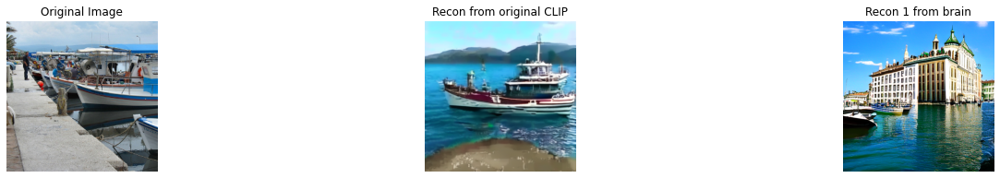

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'الشاطئ', 'url': 'https://exp.cdn-hotels.com/hotels/2000000/1670000/1668600/1668560/7d0bc47f_z.jpg?impolicy=fcrop&w=1000&h=666&q=medium', 'id': 5133201820, 'similarity': 0.9189516305923462}, {'caption': 'Druif Beach, Aruba', 'url': 'https://stephentravelsdotcom.files.wordpress.com/2014/04/aruba_druif.jpg?w=350&', 'id': 387013717, 'similarity': 0.9152792692184448}, {'caption': 'Playa Maroma, México: Beautiful beach front', 'url': 'https://media-cdn.tripadvisor.com/media/photo-s/01/29/be/31/beautiful-beach-front.jpg', 'id': 2668614359, 'similarity': 0.9137675166130066}]
{'caption': 'الشاطئ', 'url': 'https://exp.cdn-hotels.com/hotels/2000000/1670000/1668600/1668560/7d0bc47f_z.jpg?impolicy=fcrop&w=1000&h=666&q=medium', 'id': 5133201820, 'similarity': 0.9189516305923462}
{'caption': 'Druif Beach, Aruba', 'url': 'https://stephentravelsdotcom.files.wordpress.com/2014/04/aruba_druif.jpg?w=350&', 'id': 387013717, 'similarity': 0.9152792692184448}
{'caption': 'Playa Maroma, México: 

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Miami Beach ...', 'url': 'https://mp.reshift.nl/zoom/CFF02C334F5BF835977C55413A1B6E9E-miami-beach.jpg?w=460', 'id': 4113898744, 'similarity': 0.8713650107383728}, {'caption': 'Memories Caribe Beach Resort Cayo Coco Cuba Reviews', 'url': 'https://www.favething.com/uploads/images/main-fave-images/memories_caribe_beach_resort_cayo_coco_cuba-3.jpg', 'id': 360325112, 'similarity': 0.8694722056388855}, {'caption': 'Sandy Beach iPhone Wallpaper', 'url': 'http://idesigniphone.net/wallpapers/01893.jpg', 'id': 2447694834, 'similarity': 0.8684817552566528}, {'caption': 'exceed-blue', 'url': 'https://i1.wp.com/rlez.net/wp-content/uploads/cssimg001-2.jpg?resize=800%2C540&ssl=1', 'id': 685092871, 'similarity': 0.8649471998214722}]
{'caption': 'Miami Beach ...', 'url': 'https://mp.reshift.nl/zoom/CFF02C334F5BF835977C55413A1B6E9E-miami-beach.jpg?w=460', 'id': 4113898744, 'similarity': 0.8713650107383728}
{'caption': 'Memories Caribe Beach Resort Cayo Coco Cuba Reviews', 'url': 'https://w

  0%|          | 0/50 [00:00<?, ?it/s]

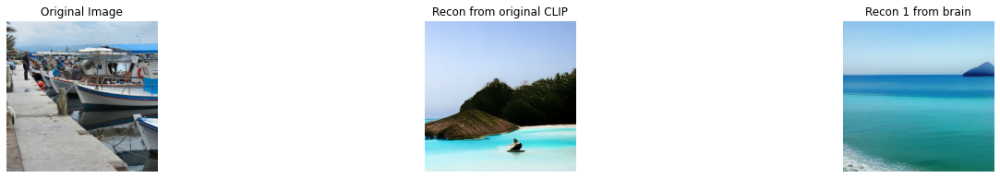

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'الشاطئ', 'url': 'https://exp.cdn-hotels.com/hotels/2000000/1670000/1668600/1668560/7d0bc47f_z.jpg?impolicy=fcrop&w=1000&h=666&q=medium', 'id': 5133201820, 'similarity': 0.9189516305923462}, {'caption': 'Druif Beach, Aruba', 'url': 'https://stephentravelsdotcom.files.wordpress.com/2014/04/aruba_druif.jpg?w=350&', 'id': 387013717, 'similarity': 0.9152792692184448}, {'caption': 'Playa Maroma, México: Beautiful beach front', 'url': 'https://media-cdn.tripadvisor.com/media/photo-s/01/29/be/31/beautiful-beach-front.jpg', 'id': 2668614359, 'similarity': 0.9137675166130066}]
{'caption': 'الشاطئ', 'url': 'https://exp.cdn-hotels.com/hotels/2000000/1670000/1668600/1668560/7d0bc47f_z.jpg?impolicy=fcrop&w=1000&h=666&q=medium', 'id': 5133201820, 'similarity': 0.9189516305923462}
{'caption': 'Druif Beach, Aruba', 'url': 'https://stephentravelsdotcom.files.wordpress.com/2014/04/aruba_druif.jpg?w=350&', 'id': 387013717, 'similarity': 0.9152792692184448}
{'caption': 'Playa Maroma, México: 

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'exceed-blue', 'url': 'https://i1.wp.com/rlez.net/wp-content/uploads/cssimg001-2.jpg?resize=800%2C540&ssl=1', 'id': 685092871, 'similarity': 0.8794006705284119}, {'caption': 'Miami Beach ...', 'url': 'https://mp.reshift.nl/zoom/CFF02C334F5BF835977C55413A1B6E9E-miami-beach.jpg?w=460', 'id': 4113898744, 'similarity': 0.8793264031410217}, {'caption': 'Memories Caribe Beach Resort Cayo Coco Cuba Reviews', 'url': 'https://www.favething.com/uploads/images/main-fave-images/memories_caribe_beach_resort_cayo_coco_cuba-3.jpg', 'id': 360325112, 'similarity': 0.8741707801818848}]
{'caption': 'exceed-blue', 'url': 'https://i1.wp.com/rlez.net/wp-content/uploads/cssimg001-2.jpg?resize=800%2C540&ssl=1', 'id': 685092871, 'similarity': 0.8794006705284119}
{'caption': 'Miami Beach ...', 'url': 'https://mp.reshift.nl/zoom/CFF02C334F5BF835977C55413A1B6E9E-miami-beach.jpg?w=460', 'id': 4113898744, 'similarity': 0.8793264031410217}
{'caption': 'Memories Caribe Beach Resort Cayo Coco Cuba Reviews

  0%|          | 0/50 [00:00<?, ?it/s]

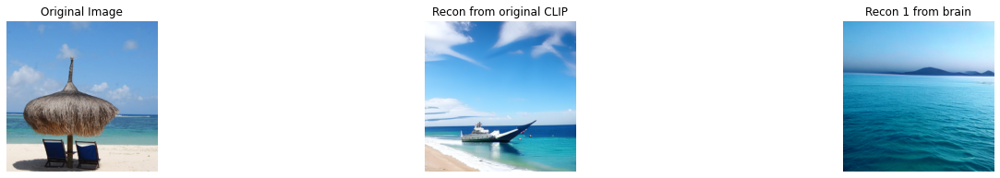

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'tir-au-but-rugby', 'url': 'https://ed-amphora.fr/wp-content/uploads/2012/04/tir-au-but-rugby.jpg', 'id': 5273647437, 'similarity': 0.82967209815979}, {'caption': '"""Photos du """"Pique rugby"""" Matin810"""', 'url': 'https://i.servimg.com/u/f88/11/48/12/60/th/matin810.jpg', 'id': 3996069513, 'similarity': 0.8185197710990906}, {'caption': '2016_Amurrio_Aiarako harana errugbi txapelketa (aiaraldea.eus) Tags: kirola rugby', 'url': 'https://farm9.static.flickr.com/8400/29163984204_0caa440198_m.jpg', 'id': 3489331109, 'similarity': 0.8165201544761658}, {'caption': '2012 Ohio Rugby Classic  Eastside High School v Twin Lakes', 'url': 'https://i.pinimg.com/236x/42/e8/71/42e871434663e79fef75b18cbdd477e4.jpg', 'id': 860545182, 'similarity': 0.8077402114868164}]
{'caption': 'tir-au-but-rugby', 'url': 'https://ed-amphora.fr/wp-content/uploads/2012/04/tir-au-but-rugby.jpg', 'id': 5273647437, 'similarity': 0.82967209815979}
{'caption': '"""Photos du """"Pique rugby"""" Matin810"""', '

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'nate thomas baseball', 'url': 'https://thedialog.org/wp-content/uploads/2018/05/IMG_7912.jpg', 'id': 105584170, 'similarity': 0.8749052882194519}, {'caption': 'Nick Bowe fielding a hard ground ball', 'url': 'http://merrillfotonews.com/wp-content/uploads/2017/06/DSC_1411.jpg', 'id': 623596921, 'similarity': 0.8732461333274841}, {'caption': 'Harvard Westlake Boys Fr/So Baseball vs Crescenta Valley 5-6-15', 'url': 'https://photos.smugmug.com/Sports/Harvard-Westlake-High-School/20142015/Incomplete-HW-Boys-FrSo-Baseball/i-Ww9QcNg/1/02029d54/S/JL139376-S.jpg', 'id': 2997196844, 'similarity': 0.8701218962669373}, {'caption': 'Game Recap: Knights edge Titans in last inning', 'url': 'https://www.knightcrier.org/wp-content/uploads/2019/05/DSC00211-475x316.jpg', 'id': 1916534442, 'similarity': 0.8693467974662781}]
{'caption': 'nate thomas baseball', 'url': 'https://thedialog.org/wp-content/uploads/2018/05/IMG_7912.jpg', 'id': 105584170, 'similarity': 0.8749052882194519}
{'caption': 

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be627830>


{'caption': 'Harvard Westlake Boys Fr/So Baseball vs Crescenta Valley 5-6-15', 'url': 'https://photos.smugmug.com/Sports/Harvard-Westlake-High-School/20142015/Incomplete-HW-Boys-FrSo-Baseball/i-Ww9QcNg/1/02029d54/S/JL139376-S.jpg', 'id': 2997196844, 'similarity': 0.8701218962669373}
{'caption': 'Game Recap: Knights edge Titans in last inning', 'url': 'https://www.knightcrier.org/wp-content/uploads/2019/05/DSC00211-475x316.jpg', 'id': 1916534442, 'similarity': 0.8693467974662781}
[<PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700FE5E50>, None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE3976D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE6C29D0>]


  0%|          | 0/50 [00:00<?, ?it/s]

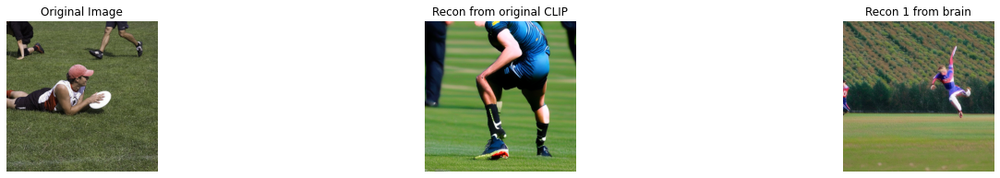

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': '冬日下雪风景', 'url': 'http://v.baopinnet.com/jpg/2020/05/1589447298KC30xo.jpg', 'id': 4750080079, 'similarity': 0.829223096370697}, {'caption': 'neige-2013-002.JPG', 'url': 'http://img.over-blog.com/600x398/3/15/68/19/photos-1/photo-2/neige-2013-002.JPG', 'id': 383149490, 'similarity': 0.8268269300460815}, {'caption': 'Balade à Ancelle sous la neige', 'url': 'http://img.over-blog-kiwi.com/1/50/36/40/20160209/ob_bf7a24_ancelle-village-sous-la-neige-4-helene.JPG', 'id': 4338280819, 'similarity': 0.8245923519134521}, {'caption': 'Snow 21 Trees in Cross Flatts Park Michele Foxton', 'url': 'https://southleedslife.com/wp-content/uploads/Snow-21-Trees-in-Cross-Flatts-Park-Michele-Foxton.jpg', 'id': 361334043, 'similarity': 0.8217996954917908}]
{'caption': '冬日下雪风景', 'url': 'http://v.baopinnet.com/jpg/2020/05/1589447298KC30xo.jpg', 'id': 4750080079, 'similarity': 0.829223096370697}


Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connection.py", line 175, in _new_conn
    (self._dns_host, self.port), self.timeout, **extra_kw
  File "/opt/conda/lib/python3.7/site-packages/urllib3/util/connection.py", line 72, in create_connection
    for res in socket.getaddrinfo(host, port, family, socket.SOCK_STREAM):
  File "/opt/conda/lib/python3.7/socket.py", line 752, in getaddrinfo
    for res in _socket.getaddrinfo(host, port, family, type, proto, flags):
socket.gaierror: [Errno -2] Name or service not known

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 710, in urlopen
    chunked=chunked,
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 398, in _make_request
    conn.request(method, url, **httplib_request_kw)
  File "/opt/conda/lib/python3.7/site-packages/urllib3/c

{'caption': 'neige-2013-002.JPG', 'url': 'http://img.over-blog.com/600x398/3/15/68/19/photos-1/photo-2/neige-2013-002.JPG', 'id': 383149490, 'similarity': 0.8268269300460815}
{'caption': 'Balade à Ancelle sous la neige', 'url': 'http://img.over-blog-kiwi.com/1/50/36/40/20160209/ob_bf7a24_ancelle-village-sous-la-neige-4-helene.JPG', 'id': 4338280819, 'similarity': 0.8245923519134521}
{'caption': 'Snow 21 Trees in Cross Flatts Park Michele Foxton', 'url': 'https://southleedslife.com/wp-content/uploads/Snow-21-Trees-in-Cross-Flatts-Park-Michele-Foxton.jpg', 'id': 361334043, 'similarity': 0.8217996954917908}
[None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700FEF8D0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700FFD890>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE5712D0>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Sidewalk covered in snow and parked vehicles', 'url': 'https://tennesseestar.com/wp-content/uploads/2021/05/Winter-Storm-VA_840x480.jpg', 'id': 2046440959, 'similarity': 0.8850469589233398}, {'caption': '雪の散歩 (62)', 'url': 'http://blog-imgs-61.fc2.com/j/a/p/japanmaster/2014021201220749a.jpg', 'id': 3544949755, 'similarity': 0.879014790058136}, {'caption': 'A snowy night in Brixton, Lambeth, London SW9 - scenes on Electric Avenue, Coldharbour Lane, Gresham Road, 2nd February 2009', 'url': 'http://www.urban75.org/brixton/photos/images/brixton-snow-01.jpg', 'id': 1591119534, 'similarity': 0.8772922158241272}, {'caption': 'hinsdale-illinois-snow-covered-street', 'url': 'https://nancymiller.com/wp-content/uploads/2017/09/hinsdale-illinois-snow-covered-street-800x453.jpg', 'id': 2489907507, 'similarity': 0.877101480960846}]
{'caption': 'Sidewalk covered in snow and parked vehicles', 'url': 'https://tennesseestar.com/wp-content/uploads/2021/05/Winter-Storm-VA_840x480.jpg', 'id':

  0%|          | 0/50 [00:00<?, ?it/s]

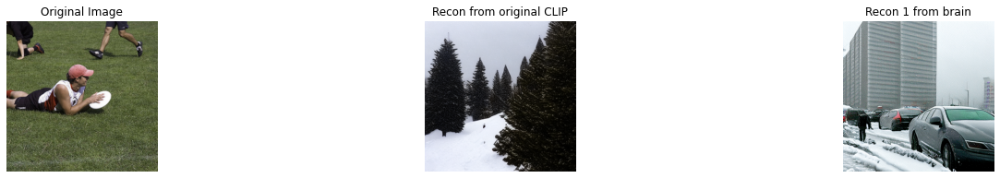

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': '冬日下雪风景', 'url': 'http://v.baopinnet.com/jpg/2020/05/1589447298KC30xo.jpg', 'id': 4750080079, 'similarity': 0.829223096370697}, {'caption': 'neige-2013-002.JPG', 'url': 'http://img.over-blog.com/600x398/3/15/68/19/photos-1/photo-2/neige-2013-002.JPG', 'id': 383149490, 'similarity': 0.8268269300460815}, {'caption': 'Balade à Ancelle sous la neige', 'url': 'http://img.over-blog-kiwi.com/1/50/36/40/20160209/ob_bf7a24_ancelle-village-sous-la-neige-4-helene.JPG', 'id': 4338280819, 'similarity': 0.8245923519134521}, {'caption': 'Snow 21 Trees in Cross Flatts Park Michele Foxton', 'url': 'https://southleedslife.com/wp-content/uploads/Snow-21-Trees-in-Cross-Flatts-Park-Michele-Foxton.jpg', 'id': 361334043, 'similarity': 0.8217996954917908}]
{'caption': '冬日下雪风景', 'url': 'http://v.baopinnet.com/jpg/2020/05/1589447298KC30xo.jpg', 'id': 4750080079, 'similarity': 0.829223096370697}


Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connection.py", line 175, in _new_conn
    (self._dns_host, self.port), self.timeout, **extra_kw
  File "/opt/conda/lib/python3.7/site-packages/urllib3/util/connection.py", line 72, in create_connection
    for res in socket.getaddrinfo(host, port, family, socket.SOCK_STREAM):
  File "/opt/conda/lib/python3.7/socket.py", line 752, in getaddrinfo
    for res in _socket.getaddrinfo(host, port, family, type, proto, flags):
socket.gaierror: [Errno -2] Name or service not known

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 710, in urlopen
    chunked=chunked,
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 398, in _make_request
    conn.request(method, url, **httplib_request_kw)
  File "/opt/conda/lib/python3.7/site-packages/urllib3/c

{'caption': 'neige-2013-002.JPG', 'url': 'http://img.over-blog.com/600x398/3/15/68/19/photos-1/photo-2/neige-2013-002.JPG', 'id': 383149490, 'similarity': 0.8268269300460815}
{'caption': 'Balade à Ancelle sous la neige', 'url': 'http://img.over-blog-kiwi.com/1/50/36/40/20160209/ob_bf7a24_ancelle-village-sous-la-neige-4-helene.JPG', 'id': 4338280819, 'similarity': 0.8245923519134521}
{'caption': 'Snow 21 Trees in Cross Flatts Park Michele Foxton', 'url': 'https://southleedslife.com/wp-content/uploads/Snow-21-Trees-in-Cross-Flatts-Park-Michele-Foxton.jpg', 'id': 361334043, 'similarity': 0.8217996954917908}
[None, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB700E12ED0>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE789650>, <PIL.Image.Image image mode=RGB size=336x336 at 0x7FB5BE792210>]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'A snowy night in Brixton, Lambeth, London SW9 - scenes on Electric Avenue, Coldharbour Lane, Gresham Road, 2nd February 2009', 'url': 'http://www.urban75.org/brixton/photos/images/brixton-snow-01.jpg', 'id': 1591119534, 'similarity': 0.8797607421875}, {'caption': 'Sidewalk covered in snow and parked vehicles', 'url': 'https://tennesseestar.com/wp-content/uploads/2021/05/Winter-Storm-VA_840x480.jpg', 'id': 2046440959, 'similarity': 0.8770455121994019}, {'caption': '雪の散歩 (62)', 'url': 'http://blog-imgs-61.fc2.com/j/a/p/japanmaster/2014021201220749a.jpg', 'id': 3544949755, 'similarity': 0.875952422618866}, {'caption': 'Upper_Chorlton_Road_in_the_Snow.jpg', 'url': 'https://upload.wikimedia.org/wikipedia/commons/e/e9/Upper_Chorlton_Road_in_the_Snow.jpg', 'id': 2293079735, 'similarity': 0.8739495277404785}]
{'caption': 'A snowy night in Brixton, Lambeth, London SW9 - scenes on Electric Avenue, Coldharbour Lane, Gresham Road, 2nd February 2009', 'url': 'http://www.urban75.org/br

Traceback (most recent call last):
  File "/tmp/ipykernel_318/4289372403.py", line 41, in img_result
    requests.get(result["url"]).content  # , stream=True).raw
  File "/opt/conda/lib/python3.7/site-packages/PIL/Image.py", line 3124, in open
    "cannot identify image file %r" % (filename if filename else fp)
PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7fb5be6c65f0>


  0%|          | 0/50 [00:00<?, ?it/s]

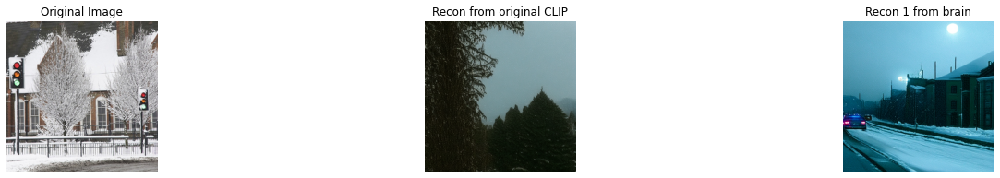

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Arte floral en Madrid', 'url': 'http://estaticos.qdq.com/swdata/photos/350/350729677/4d62971a3a714be892c62bbfe703726d.jpg', 'id': 812321352, 'similarity': 0.8189600706100464}, {'caption': 'Giardina 2015 Ikebana International Ausstellung Daniela Jost', 'url': 'https://www.asien-zuhause.ch/Bilder/Giardina2015/TN_Giardina_2015_Ikebana_021.jpg', 'id': 3327503511, 'similarity': 0.8101097941398621}, {'caption': 'www.floristic.ru - Флористика. Москва, выставки икэбана', 'url': 'https://www.floristic.ru:443/forum/attachments/17106d1392326622t-moskva-vystavki-ikebana-222.jpg', 'id': 5446942192, 'similarity': 0.8055318593978882}]
{'caption': 'Arte floral en Madrid', 'url': 'http://estaticos.qdq.com/swdata/photos/350/350729677/4d62971a3a714be892c62bbfe703726d.jpg', 'id': 812321352, 'similarity': 0.8189600706100464}
{'caption': 'Giardina 2015 Ikebana International Ausstellung Daniela Jost', 'url': 'https://www.asien-zuhause.ch/Bilder/Giardina2015/TN_Giardina_2015_Ikebana_021.jpg', 'i

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'center pieces 268', 'url': 'https://parkwayfloristpghblog.files.wordpress.com/2014/01/center-pieces-268.jpg?w=481&', 'id': 3015682105, 'similarity': 0.8555098176002502}, {'caption': 'Tmx 1383936299729 Dsc0006 Marlborough wedding florist', 'url': 'https://cdn0.weddingwire.com/emp/fotos/8/5/2/7/1/5/tmx_1383936299729-dsc0006.jpg', 'id': 884555649, 'similarity': 0.8531500101089478}, {'caption': 'Red Rose Valentine by blondspice', 'url': 'https://www.ephotozine.com/resize/2011/07/xlrg/145216_1297730597.jpg?RTUdGk5cXyJFBQgJVANtcQlnYF8JERFaGwJRNQh6SlYUAEw1cmsCdg1hAWoxXFNGLSI=', 'id': 224316259, 'similarity': 0.8517111539840698}, {'caption': 'Memory Vase Arrangement Flickr Photo Sharing', 'url': 'https://farm5.staticflickr.com/4142/4779814893_ae3ab2422e_z.jpg', 'id': 42071628, 'similarity': 0.8510248064994812}]
{'caption': 'center pieces 268', 'url': 'https://parkwayfloristpghblog.files.wordpress.com/2014/01/center-pieces-268.jpg?w=481&', 'id': 3015682105, 'similarity': 0.8555098

  0%|          | 0/50 [00:00<?, ?it/s]

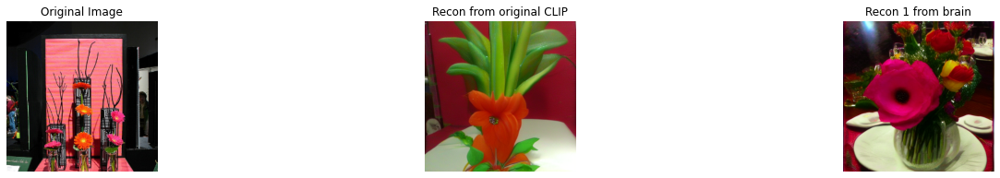

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': "La panchina dell'Homeless", 'url': 'http://img.over-blog.com/500x375/4/44/77/17/Panchine/DSC06168.JPG', 'id': 2769848136, 'similarity': 0.7683698534965515}, {'caption': 'siesta... by Vernon Mata - People Street & Candids', 'url': 'http://lh6.ggpht.com/t0ftBRjyuk9G9Yslm5_kquVN1rVdY4J-cYhX3j8L1N8-Fpq8-QGk-Q4np-4_DXlltEr2OhL-PUJXvuufFtVj27va=s270-c', 'id': 2460607522, 'similarity': 0.7679166197776794}, {'caption': 'Sleeping (elbrozzie) Tags: nyc newyorkcity manhattan lowereastside rooseveltpark', 'url': 'https://farm4.static.flickr.com/3699/8973044650_0e388d455f_m.jpg', 'id': 1900151802, 'similarity': 0.7651189565658569}, {'caption': 'В Венгрии бездомным  запретили ночевать на улице', 'url': 'https://www.oreanda.ru/app/web/preview.php?sw=150&sh=100&mode=0&path=aimg%2F79x16000%2F1250042%2Fhead_0.jpg', 'id': 4970049819, 'similarity': 0.7650414109230042}]
{'caption': "La panchina dell'Homeless", 'url': 'http://img.over-blog.com/500x375/4/44/77/17/Panchine/DSC06168.JPG', 'id': 2

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': '9.pause sieste-Chambery-juillet-2011.jpg', 'url': 'https://images.squarespace-cdn.com/content/v1/594983a6a5790ae33a227208/1551432458636-A6B16ZPFRNK85QUL5A9M/ke17ZwdGBToddI8pDm48kOqP98dk5khNoVWS0NwX10Z7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1UZLtAK5hBHcXFmOv-fV5ZgUBlXK8eXVOVgZ7wf_3On05EhgbVMRY38HPx3bIKqHiXg/9.pause+sieste-Chambery-juillet-2011.jpg', 'id': 3830742092, 'similarity': 0.807444155216217}, {'caption': 'Untitled_1_tokyo_japan', 'url': 'http://s3.amazonaws.com/bandw-gallery/standard/45130/Untitled_1_Tokyo_Japan.jpg?1373424819', 'id': 1166685493, 'similarity': 0.7995702624320984}, {'caption': 'Mann mit Smartphone', 'url': 'https://tipzeitung.de//img//35fa9201.jpg', 'id': 5364756117, 'similarity': 0.7993537187576294}, {'caption': 'Photograph Elderly and Bicycle by Andy Ng on 500px', 'url': 'https://drscdn.500px.org/photo/4617442/m%3D2048/bd05681059722aba3cb37795256ed8c2', 'id': 1312887599, 'similarity':

  0%|          | 0/50 [00:00<?, ?it/s]

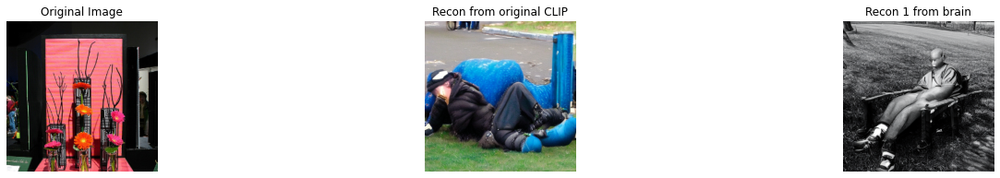

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': "La panchina dell'Homeless", 'url': 'http://img.over-blog.com/500x375/4/44/77/17/Panchine/DSC06168.JPG', 'id': 2769848136, 'similarity': 0.7683698534965515}, {'caption': 'siesta... by Vernon Mata - People Street & Candids', 'url': 'http://lh6.ggpht.com/t0ftBRjyuk9G9Yslm5_kquVN1rVdY4J-cYhX3j8L1N8-Fpq8-QGk-Q4np-4_DXlltEr2OhL-PUJXvuufFtVj27va=s270-c', 'id': 2460607522, 'similarity': 0.7679166197776794}, {'caption': 'Sleeping (elbrozzie) Tags: nyc newyorkcity manhattan lowereastside rooseveltpark', 'url': 'https://farm4.static.flickr.com/3699/8973044650_0e388d455f_m.jpg', 'id': 1900151802, 'similarity': 0.7651189565658569}, {'caption': 'В Венгрии бездомным  запретили ночевать на улице', 'url': 'https://www.oreanda.ru/app/web/preview.php?sw=150&sh=100&mode=0&path=aimg%2F79x16000%2F1250042%2Fhead_0.jpg', 'id': 4970049819, 'similarity': 0.7650414109230042}]
{'caption': "La panchina dell'Homeless", 'url': 'http://img.over-blog.com/500x375/4/44/77/17/Panchine/DSC06168.JPG', 'id': 2

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Red House Restaurant', 'url': 'https://media-cdn.tripadvisor.com/media/photo-i/0e/74/2b/04/red-house-restaurant.jpg', 'id': 175070329, 'similarity': 0.744952917098999}, {'caption': 'Sto sa 10 istih stolica drveni stolice bi trebalo presvuci cena nije', 'url': 'https://img5.lalafo.com/i/posters/api/8a/97/88/5e57bfc14f03bd074e2398b8a6.jpeg', 'id': 5204698824, 'similarity': 0.7415880560874939}, {'caption': 'glass table finished wrought iron frame two chairs same', 'url': 'https://images.canadianlisted.com/nssmall/sun-room-table-an-2-chairs-yamaha-baby-grand-piano_11063328.jpg', 'id': 2920543442, 'similarity': 0.7370420694351196}, {'caption': 'Antique card table', 'url': 'https://i.ebayimg.com/00/s/ODAwWDQ1MA==/z/t78AAOSwk~ZaOJar/$_35.JPG', 'id': 3306631283, 'similarity': 0.7366502285003662}]
{'caption': 'Red House Restaurant', 'url': 'https://media-cdn.tripadvisor.com/media/photo-i/0e/74/2b/04/red-house-restaurant.jpg', 'id': 175070329, 'similarity': 0.744952917098999}
{'cap

  0%|          | 0/50 [00:00<?, ?it/s]

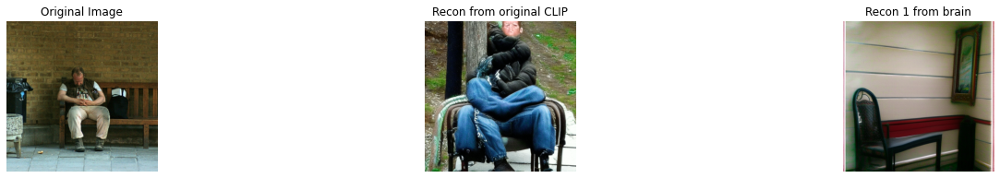

  0%|          | 0/1 [00:00<?, ?it/s]

[{'caption': 'Meat alternatives such as tofu becoming more popular with US meat eaters. (image by Rudi Riet)', 'url': 'https://cdn-a.william-reed.com/var/wrbm_gb_food_pharma/storage/images/3/4/3/9/1359343-1-eng-GB/US-consumers-opt-increasingly-for-meat-alternatives_news_teaser_medium.jpg', 'id': 2245918539, 'similarity': 0.9111313819885254}]
{'caption': 'Meat alternatives such as tofu becoming more popular with US meat eaters. (image by Rudi Riet)', 'url': 'https://cdn-a.william-reed.com/var/wrbm_gb_food_pharma/storage/images/3/4/3/9/1359343-1-eng-GB/US-consumers-opt-increasingly-for-meat-alternatives_news_teaser_medium.jpg', 'id': 2245918539, 'similarity': 0.9111313819885254}


Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 710, in urlopen
    chunked=chunked,
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 386, in _make_request
    self._validate_conn(conn)
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connectionpool.py", line 1042, in _validate_conn
    conn.connect()
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connection.py", line 467, in connect
    _match_hostname(cert, self.assert_hostname or server_hostname)
  File "/opt/conda/lib/python3.7/site-packages/urllib3/connection.py", line 540, in _match_hostname
    match_hostname(cert, asserted_hostname)
  File "/opt/conda/lib/python3.7/site-packages/urllib3/util/ssl_match_hostname.py", line 155, in match_hostname
    raise CertificateError("hostname %r doesn't match %r" % (hostname, dnsnames[0]))
urllib3.util.ssl_match_hostname.CertificateError: hostname 'cdn-a.william-reed.com' doesn't m

[None]


IndexError: list index out of range

In [28]:
import gc

val_dl = wds.WebLoader(val_data, num_workers=0,  # num_workers,
                       batch_size=None, shuffle=False, # persistent_workers=True
                      )


def embed_image(image, self=clip_extractor):
    """Expects images in -1 to 1 range"""
    image = torch.from_numpy(np.stack([np.asarray(im) / 255. for im in image])
                             if isinstance(image, list)
                             else np.asarray(image)[None, ...] / 255.
                            ).to(device)
    image = image.permute(0, 3, 1, 2)
    # note: antialias should be False if planning to use Pinkney's Image Variation SD model
    clip_emb = nn.functional.interpolate(image.to(device), self.clip_size, mode="area", antialias=False)
    # clip_emb = self.normalize(0.5*clip_emb + 0.5).clamp(0,1)
    clip_emb = self.clip.encode_image(self.normalize(clip_emb))
    # input is now in CLIP space, but mind-reader preprint further processes embeddings:
    # clip_emb = torch.clamp(clip_emb, -1.5, 1.5)
    # clip_emb = nn.functional.normalize(clip_emb, dim=-1)
    return clip_emb


def flatten(im):
    a = []
    for i in im:
        try:
            a += flatten(i)
        except TypeError:
            a.append(i)
    return a


@torch.no_grad()
def clip_sim(a, b):
    a, b = map(embed_image, (flatten(a), flatten(b)))
    return torch.einsum("a d, b d -> a b", a, b) / a.norm(-1) / b.norm(-1).unsqueeze(0)

sim_baseline, sim_gen = 0, 0
gs = 4
torch.set_grad_enabled(False)
for i, ((clip_emb, image_embeddings), (_, image)) in enumerate(tqdm(zip(all_embeddings, val_dl), total=len(all_embeddings))):
    gc.collect()
    torch.cuda.empty_cache()
    
    clip_emb = [torch.from_numpy(ce).to(device) for ce in clip_emb][-1:]
    image_embeddings = torch.from_numpy(image_embeddings).to(device)

    num_per_sample = 1  # TODO
    # if sd_mode:
    # duplicate the embedding to serve classifier free guidance
    image_embeddings = image_embeddings.repeat(num_per_sample, 1)
    image_embeddings = torch.cat([torch.zeros_like(image_embeddings), image_embeddings]).unsqueeze(1).to(device)

    with torch.autocast(torch.device(device).type):
        decoded_clip_image = decode_latents(sample_fn([ce.detach().cpu().numpy() for e in clip_emb for ce in e],
                                                      i=i, bs=num_per_sample, gs=gs))        
        latents = sample_fn(image_embeddings[-1:].detach().cpu().numpy(), i=i, bs=num_per_sample, gs=gs)

        recons = []
        for i in range(2,2+num_per_sample):
            recon = decode_latents(latents[i-2])
            recons.append(recon)
    
    with torch.no_grad():
        p, n = i / (i + 1), 1 / (i + 1)
        imm = [torch_to_Image(ppp) for ppp in image]
        sim_baseline = sim_baseline * p + clip_sim(decoded_clip_image, imm) * n
        sim_gen = sim_gen * p + sum(clip_sim([recon],
                                             imm) for recon in recons) / len(recons) * n

    fig, ax = plt.subplots(1, 2+num_per_sample, figsize=(23,3))
    ax[0].set_title(f"Original Image")
    ax[0].imshow(torch_to_Image(image))
    ax[1].set_title(f"Recon from original CLIP")
    ax[1].imshow(torch_to_Image(np.concatenate(decoded_clip_image, axis=1)))
    for recon in recons:
        ax[i].set_title(f"Recon {i-1} from brain")
        ax[i].imshow(recon)
    for i in range(2 + num_per_sample):
        ax[i].axis("off")
    plt.show()       
   
sim_baseline, sim_gen

In [ ]:
from inspect import getsource
print(getsource(clip_extractor.embed_image))

In [ ]:
test_images[0]